##### TCC MBA Data Science & Analytics - USP/Esalq - PRELIMINAR

(Trabalho em desenvolvimento)     

Versão até 21 de setembro de 2025.

# 1
<div style="background-color:lightcoral; padding: 20px;">
  <span style="font-size:20px; font-weight:bold;">1. SETUP E PREPARAÇAO DOS DADOS (ETL)</span>
</div>

## 1.0
<div style="background-color:lightblue; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;">1.0. DADOS DA BASE E REGRAS DOS GASTOS</span>
</div>

### 1.0.1
<div style="background-color:rgb(255, 219, 88); padding: 10px;">
  <span style="font-size:14px; font-weight:bold;">ORIGEM E SIGNIFICADO DOS CAMPOS.</span>
</div>



   Os dados foram baixados no site da camara dos deputados
https://dadosabertos.camara.leg.br/swagger/api.html?tab=staticfile

#Significado dos campos das bases
Fonte: o site https://dadosabertos.camara.leg.br/howtouse/2023-12-26-dados-ceap.html

Foram baixados inicialmente em CSV, mas houve problemas no carregamento (separaçao e coluna deu problema)
Foram depois baixados em .ODS e depois covnertidos em CSV
   
-------------------------
      
txNomeParlamentar   
Nome adotado pelo parlamentar no início de seu mandato na legislatura. Nos dados da CEAP, o nome parlamentar pode não sofrer as mesmas variações registradas pela API e pelos demais arquivos para download do Dados Abertos. O campo também pode trazer o título identificador de uma liderança partidária, à qual líderes e vice-líderes podem direcionar parte de suas próprias cotas individuais (Atos da Mesa 13/2011 e 5/2015).


cpf     
Cadastro de Pessoa Física (CPF) do parlamentar beneficiário da CEAP ao qual o registro de despesa tenha sido vinculado.
    
ideCadastro   
Identificador numérico exclusivo de cada parlamentar da Câmara dos Deputados. É o mesmo id que identifica os parlamentares na API e nos demais arquivos do Dados Abertos.
     
nuCarteiraParlamentar    
Número do documento que identifica um parlamentar em alguns sistemas da Câmara. Tem a validade de uma legislatura: por isso, deputados de diferentes legislaturas podem ter um mesmo número de carteira.
    
nuLegislatura    
Apesar do nome, é o ano de início da legislatura mencionada no campo codLegislatura mais adiante. É aqui colocado por fazer parte da identificação por meio de nuCarteiraParlamentar.
   
sgUF    
Sigla da unidade da federação (estados e Distrito Federal) por qual o respectivo parlamentar foi eleito. No contexto da CEAP, afeta o valor disponível para o parlamentar.
     
sgPartido    
Sigla do partido ao qual o parlamentar é/era filiado. Nos dados da CEAP, o conteúdo do campo pode mostrar divergências em relação a outros arquivos e endpoints do Dados Abertos, por não refletir necessariamente e com a mesma precisão as trocas de filiação ocorridas durante cada legislatura. Atualmente, os parlamentares são listados com a filiação partidária mais recente (isto é, a última cadastrada) de cada ano.
    
codLegislatura    
Número identificador da legislatura na qual ocorreu a despesa.
      
numSubCota    
Código numérico de uma categoria de despesa à qual o registro seja pertinente.
       
txtDescricao     
Título da categoria de despesa à qual seja pertinente o registro — a mesma referida pelo campo numSubCota.
      
numEspecificacaoSubcota     
Quando cabível, é um código numérico de uma subcategoria de despesa que classifica o registro. Usado em pares com os valores do campo 
       
txtDescricaoEspecificacao.      
Apenas alguns dos tipos de despesas identificados por numSubCota e txtDescricao têm este segundo nível de classificação.
       
txtDescricaoEspecificacao 
Título descritivo da subcategoria de despesa referida pelo campo numEspecificacaoSubcota.
  
txtFornecedor 
Nome da pessoa física ou empresa fornecedora do serviço ou produto ao qual se refere o registro de despesa, conforme o documento fiscal apresentado.
    
txtCNPJCPF        
Número de Cadastro de Pessoa Física (CPF) ou de Cadastro Nacional de Pessoas Jurídicas (CNPJ) da pessoa ou empresa fornecedora do serviço ou produto ao qual se refere o registro de despesa. Geralmente estão com os separadores "." e "/", e por isso são fornecidos em formato string. Há registros com CNPJs inválidos, na faixa de 00.000.000/0000-01 a 00.000.000/0000-07, que são usados basicamente para criação de agrupamentos de despesas na apresentação pelo Portal da Câmara. O campo pode ser vazio quando a despesa é registrada junto a um fornecedor diretamente contratado pela Câmara para prestação do serviço.
   
txtNumero    
O número de face do documento fiscal comprovante da despesa, ou do documento de outro tipo (contrato, p.ex.) que deu causa à despesa.   
      
indTipoDocumento             
Indicador numérico do tipo de documento fiscal associado à despesa, com os seguintes valores, segundo informações da área responsável em agosto de 2017:   
0 - nota fiscal   
1 - recibo ou outros   
2 - documento emitido no exterior   
3 - despesa do Parlasul   
4 - nota fiscal eletrônica   
5 - nota fiscal eletrônica
       
datEmissao   
Data de emissão do documento comprobatório da despesa a que se refere o registro.  
     
vlrDocumento    
Valor de face do documento comprobatório da despesa. Alguns tipos de despesa podem ter registros com valores negativos: nos de passagens aéreas, por exemplo, isso ocorre quando são emitidos bilhetes de compensação pela não-utilização de uma passagem.
  
vlrGlosa  
Valor retido, isto é, não coberto pela CEAP, por qualquer razão (impedimento legal, insuficiência de comprovação, etc).
  
vlrLiquido  
Valor da despesa efetivamente debitado da Cota Parlamentar, correspondente ao vlrDocumento menos o vlrGlosa. Em despesas de Telefonia, é possível que este valor seja registrado como 0, significando que a despesa foi coberta pela franquia do contrato.
  
numMes  
Mês de competência financeira do documento comprobatório da despesa. Determina em qual período se dará o efeito da despesa sobre a CEAP.
  
numAno  
Ano da competência financeira do documento comprobatório da despesa.
   
numParcela
Valor numérico diferente de 0 quando a despesa cadastrada é reembolsada pela CEAP de forma parcelada, conforme a documentação comprobatória associada ao registro.   
    
txtPassageiro    
Nos registros referentes a passagens aéreas, o campo traz o nome da pessoa para quem foi emitida a passagem.
    
txtTrecho   
Também nos registros referentes a passagens aéreas, traz como texto livre a descrição do(s) trecho(s) de viagem do bilhete. Normalmente utiliza o padrão, popularizado por companhias aéreas, de siglas de três letras que identificam aeroportos, separadas pelo caractere barra (/).

numLote   
Se cabível, é o identificador numérico do lote de documentos, entregues à Câmara para verificação e reembolso pela CEAP, ao qual o documento associado ao registro de despesa pertença.
   
numRessarcimento  
Se cabível, identifica numericamente o ressarcimento da despesa dentro do lote referido por numLote. Só é preenchido nos casos em que o parlamentar realizou o gasto com recursos próprios e depois solicitou o reembolso da câmara.
  
datPagamentoRestituicao  
Data e hora, em formato ISO 8601, de quando o parlamentar realizou a restituição à Câmara de valores referentes à despesa citada no registro. Preenchido somente quando há algo no campo vlrRestituicao descrito a seguir.
  
vlrRestituicao  
Valor que o parlamentar devolveu à Câmara. Nos registros em que este campo é preenchido, é comum que haja outro registro associado ao mesmo documento comprobatório da despesa.
  
nuDeputadoId  
Identificador numérico do parlamentar à qual a despesa é associada no sistema interno da Câmara de registro e controle do uso da Cota para Exercício da Atividade Parlamentar. Este é também o identificador usado nas páginas do Portal da Câmara sobre o uso da CEAP. Não é utilizado nos demais arquivos e endpoints da API do Dados Abertos.
  
ideDocumento  
Identificador numérico do documento comprobatório da despesa a que se refere o registro. Como é possível haver mais de um registro referente a um mesmo documento, não deve ser usado como identificador dos registros, mas permite agrupar todos os registros referentes a uma mesma despesa.
urlDocumento

### 1.0.2
<div style="background-color:rgb(255, 219, 88); padding: 10px;">
  <span style="font-size:14px; font-weight:bold;">REGRAS GERAIS DE USO DAS COTAS.</span>
</div>



 Algumas regras gerais para o das cotas estào no site: 
 
https://www2.camara.leg.br/comunicacao/assessoria-de-imprensa/guia-para-jornalistas/cota-parlamentar


O valor da Cota é diferente para cada estado da Federação, porque leva em consideração o preço das passagens aéreas de Brasília até a capital do estado pelo qual o deputado foi eleito. Os valores atuais são:

AC 50.426,26	DF 36.582,46	MT 45.221,83	RJ 41.553,77	SE 45.933,06
AL 46.737,90	ES 43.217,71	PA 48.021,25	RN 48.525,79	SP 42.837,33
AM 49.363,92	GO 41.300,86	PB 47.826,36	RO 49.466,29	TO 45.297,41
AP 49.168,58	MA 47.945,49	PE 47.470,60	RR 51.406,33	
BA 44.804,65	MG 41.886,51	PI 46.765,57	RS 46.669,70	
CE 48.245,57	MS 46.336,64	PR 44.665,66	SC 45.671,58	


 Despesas que podem ser pagas com a Cota Parlamentar 

As despesas que podem ser pagas com os recursos da Cota Parlamentar são: 

1 - passagens aéreas, incluindo o despacho de bagagens pessoais e os serviços de acesso à internet oferecidos por companhias aéreas ou aeroportos;

2 – telefones dos gabinetes, dos escritórios nos estados e dos imóveis funcionais, e as despesas com o celular funcional do deputado. As contas devem ser de comprovada responsabilidade do parlamentar;

3 - manutenção de escritórios de apoio à atividade parlamentar, como locação de imóveis, energia elétrica, água e esgoto, acesso à internet, entre outros;

4 – assinatura de publicações;

5 - alimentação do deputado;

6 – hospedagem, exceto no Distrito Federal;

7 - despesas com locomoção por:

- locação ou fretamento de aeronaves;

- locação ou fretamento de veículos automotores (limite inacumulável de R$ 12.713,00 mensais), permitida contratação de seguro;

- locação ou fretamento de embarcações;

- serviços de táxi, pedágio e estacionamento (limite inacumulável de R$ 2.700,00 mensais);

- passagens terrestres, marítimas ou fluviais.

8 - combustíveis e lubrificantes (limite inacumulável de R$ 9.392,00 mensais);

9 - serviços de segurança de empresas especializadas (limite inacumulável de R$ 8.700,00 mensais);

10 - divulgação da atividade parlamentar (exceto nos 120 dias anteriores à data das eleições, se o deputado for candidato - Ato da Mesa 40/2012);

11 - participação em cursos, congressos ou eventos, realizados por instituição especializada (limite mensal inacumulável de 25% do valor da menor cota – hoje R$7.697,17);

12 - complementação de auxílio-moradia, de acordo com o Ato da Mesa 104/88 (limite inacumulável de R$ 4.148,80 mensais). 

13 - aquisição de tokens e certificados digitais.



Despesas que não podem ser pagas com a Cota Parlamentar 

Não são admitidos gastos com a utilização da cota para: 

1 - bens ou serviços adquiridos de empresa ou entidade da qual o deputado ou parente até o terceiro grau ou servidor da Câmara seja proprietário ou detentor de qualquer participação;

2 - locação ou fretamento em empresas em que o deputado ou parente até o terceiro grau ou em que um servidor da Câmara sejam proprietários ou detentores de qualquer participação;

3 - pagamento realizado à pessoa física, salvo para locação de imóvel, uso de aeronave ou embarcação, e serviços de táxi;

4 - sem apresentação de nota fiscal, salvo se a empresa estiver legalmente isenta de emitir a nota;

5 - aquisição de gêneros alimentícios;

6 - aquisição de material permanente, de duração superior a dois anos;

7 - locação de bens móveis com cláusulas que possibilitem sua aquisição com recursos da Cota;

8 - locação de veículo automotor, prestada por pessoa jurídica especializada, que contemple o serviço de motorista;

9 - gastos de caráter eleitoral;

10 - gastos referentes à participação do deputado em cursos de educação básica, graduação e pós-graduação. 

Nos 120 dias anteriores à data das eleições gerais e municipais, os deputados que forem candidatos não poderão utilizar recursos da cota para pagar divulgação da atividade parlamentar (Ato da Mesa 40/2012). 


Despesas de assessores pagas com a Cota 

Podem ser reembolsadas pela Cota as despesas de funcionários a serviço da atividade parlamentar do deputado com: passagens aéreas, terrestres, marítimas ou fluviais; hospedagem; locação ou fretamento de veículos, aeronaves e embarcações; serviços de táxi; pedágio; estacionamento; e aquisição de tokens e certificados digitais. 

Disponibilização das notas fiscais 

Desde julho de 2014, as cópias digitalizadas das notas fiscais referentes a gastos da Cota Parlamentar estão disponíveis no sistema de Cota Parlamentar, conforme Portaria 228/2014. A responsabilidade pela digitalização das notas fiscais é dos gabinetes parlamentares. O material digitalizado é encaminhado à área responsável pela administração da Cota, que se ocupa de tornar público o conteúdo dos documentos. 

Algumas notas fiscais não são divulgadas na “Transparência” do portal da Câmara. São elas: 

- despesas telefônicas, devido ao sigilo telefônico - O interessado pelo documento deve solicitá-lo por meio da Lei de Acesso à Informação (LAI) - disponível no portal, em Fale Conosco. O setor responsável fará o tarjamento dos trechos onde há informações sigilosas antes de enviar ao requerente. O mesmo procedimento vale para notas que identificam outros dados sigilosos, como o bancário; 

- gastos com passagens em companhias aéreas credenciadas pela Câmara feitos mediante emissão de Requisição de Passagem Aérea (RPA) e pelo Sistema de Gestão de Passagens Aéreas (Sigepa). (Ver item abaixo)

Passagem aérea

A compra de passagem aérea para o exercício da atividade parlamentar por meio da Cota pode ser feita de três formas:

- Por Requisição de Passagem Aérea (RPA), cujas passagens são emitidas pelas companhias aéreas credenciadas pela Câmara, sendo as despesas com as passagens debitadas do valor da cota mensal do parlamentar, a partir de uma fatura global enviada à Câmara pelas empresas credenciadas. Como não são emitidas notas fiscais individuais, na página da Cota esse tipo de gasto aparece como “Passagem aérea - RPA", e na coluna "Número do documento", aparece o número do bilhete aéreo. A RPA tem validade para uso até o último dia útil do respectivo exercício financeiro.

- Por reembolso, quando o deputado compra passagem aérea para o exercício do mandato diretamente nas companhias aéreas. Neste caso, as despesas aparecem como “Passagem aérea - Reembolso”, e a nota fiscal é anexada em “Número do documento”.

- Pelo Sistema de Gestão de Passagens Aéreas (Sigepa), que permite aos deputados e assessores credenciados a realização de reservas ou emissões, cancelamentos, remarcações, pedidos de reembolso de passagens aéreas, conforme regras e políticas de viagem estabelecidas entre a Câmara e as companhias aéreas credenciadas. O valor das passagens aéreas retiradas pelo Sigepa é debitado diretamente da cota mensal do parlamentar. Na página da Cota esse tipo de gasto aparece como “Passagem aérea - Sigepa", a data da compra, e na coluna "Número do documento", o número do bilhete aéreo. 

Nos meses em que os gastos com passagem aérea pela Cota são destaques no gráfico disponível na Transparência do portal da Câmara, a nomenclatura "Passagem Aérea" constante da legenda, no campo "Em que tipo de despesa a Cota foi gasta?", traz a soma dos gastos com bilhetes aéreos emitidos por RPA e na modalidade reembolso. A modalidade "Sigepa" aparece separadamente.

Além dos valores previstos na Cota para compra de passagens, os deputados têm direito a até oito passagens aéreas por mês em seu nome para voar entre seu estado de representação e Brasília. A origem pode ainda ser aeródromo situado em outra unidade da Federação e próximo à residência do parlamentar, desde que essa alteração seja autorizada pela Terceira-Secretaria.

 

In [1]:
#!pip list

In [2]:
#import sys, subprocess
#subprocess.run([sys.executable, '-m', 'pip', 'install', '--upgrade', 'pandas'])

In [3]:
#!pip uninstall numpy

In [4]:
#!pip install numpy==1.26.4

In [5]:
#!pip install numpy==2.0.0

## 1.1

<div style="background-color:lightblue; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;">1.1. Obtenção da base</span>
</div>

As bases de gastos estão divididas por ano de competência do gasto.


In [6]:
import pandas as pd
import numpy as np # Importar numpy para usar np.where

df_2023 = pd.read_csv(r"Ano-2023_convertido.csv", sep=';',low_memory=False)


In [7]:
#df_2023.head()

In [8]:
df_2023['vlrLiquido']

0             899
1             899
2             899
3             899
4             899
           ...   
231998    1367,51
231999      11000
232000       0,51
232001    1393,34
232002    1393,34
Name: vlrLiquido, Length: 232003, dtype: object

In [9]:
df_2023.tail()

,txNomeParlamentar,cpf,ideCadastro,nuCarteiraParlamentar,nuLegislatura,sgUF,sgPartido,codLegislatura,numSubCota,txtDescricao,...,numParcela,txtPassageiro,txtTrecho,numLote,numRessarcimento,datPagamentoRestituicao,vlrRestituicao,nuDeputadoId,ideDocumento,urlDocumento
231998,Dr Fabio Rueda,2.539052e+09,227401.0,569.0,2023,AC,UNIÃO,57,998,PASSAGEM AÉREA - SIGEPA,...,0,FABIO GONCALVES DE RUEDA,BSB/GRU/REC,0,0.0,NaN,NaN,3755,218349,NaN
231999,Douglas Viegas,2.551906e+10,227433.0,571.0,2023,SP,UNIÃO,57,5,DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR.,...,0,NaN,NaN,2002507,NaN,NaN,NaN,3756,7669098,https://www.camara.leg.br/cota-parlamentar/doc...
232000,Douglas Viegas,2.551906e+10,227433.0,571.0,2023,SP,UNIÃO,57,10,TELEFONIA,...,0,NaN,NaN,0,0.0,NaN,NaN,3756,0,NaN
232001,Douglas Viegas,2.551906e+10,227433.0,571.0,2023,SP,UNIÃO,57,120,LOCAÇÃO OU FRETAMENTO DE VEÍCULOS AUTOMOTORES,...,0,NaN,NaN,2003390,NaN,NaN,NaN,3756,7670764,https://www.camara.leg.br/cota-parlamentar/doc...
232002,Douglas Viegas,2.551906e+10,227433.0,571.0,2023,SP,UNIÃO,57,120,LOCAÇÃO OU FRETAMENTO DE VEÍCULOS AUTOMOTORES,...,0,NaN,NaN,2003390,NaN,NaN,NaN,3756,7670760,https://www.camara.leg.br/cota-parlamentar/doc...


In [19]:
#vamos avaliar os tipos de dados em cada colunas 
df_2023.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 232003 entries, 0 to 232002
Data columns (total 32 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   txNomeParlamentar          232003 non-null  object 
 1   cpf                        231100 non-null  float64
 2   ideCadastro                231148 non-null  float64
 3   nuCarteiraParlamentar      231148 non-null  float64
 4   nuLegislatura              232003 non-null  int64  
 5   sgUF                       231148 non-null  object 
 6   sgPartido                  231148 non-null  object 
 7   codLegislatura             232003 non-null  int64  
 8   numSubCota                 232003 non-null  int64  
 9   txtDescricao               232003 non-null  object 
 10  numEspecificacaoSubCota    232003 non-null  int64  
 11  txtDescricaoEspecificacao  69374 non-null   object 
 12  txtFornecedor              232003 non-null  object 
 13  txtCNPJCPF                 17

In [20]:
df_2024 = pd.read_csv(r"Ano-2024_convertido.csv", sep=';',low_memory=False)
df_2024.head(10)

,txNomeParlamentar,cpf,ideCadastro,nuCarteiraParlamentar,nuLegislatura,sgUF,sgPartido,codLegislatura,numSubCota,txtDescricao,...,numParcela,txtPassageiro,txtTrecho,numLote,numRessarcimento,datPagamentoRestituicao,vlrRestituicao,nuDeputadoId,ideDocumento,urlDocumento
0,LID.GOV-CD,NaN,NaN,NaN,2023,NaN,NaN,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,0,NaN,NaN,2018065,NaN,NaN,NaN,2812,7696122,https://www.camara.leg.br/cota-parlamentar/doc...
1,LID.GOV-CD,NaN,NaN,NaN,2023,NaN,NaN,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,0,NaN,NaN,2028853,NaN,NaN,NaN,2812,7716118,https://www.camara.leg.br/cota-parlamentar/doc...
2,LID.GOV-CD,NaN,NaN,NaN,2023,NaN,NaN,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,0,NaN,NaN,2032624,NaN,NaN,NaN,2812,7723265,https://www.camara.leg.br/cota-parlamentar/doc...
3,LID.GOV-CD,NaN,NaN,NaN,2023,NaN,NaN,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,0,NaN,NaN,2044731,NaN,NaN,NaN,2812,7745812,https://www.camara.leg.br/cota-parlamentar/doc...
4,LID.GOV-CD,NaN,NaN,NaN,2023,NaN,NaN,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,0,NaN,NaN,2057199,NaN,NaN,NaN,2812,7769537,https://www.camara.leg.br/cota-parlamentar/doc...
5,LID.GOV-CD,NaN,NaN,NaN,2023,NaN,NaN,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,0,NaN,NaN,2061518,NaN,NaN,NaN,2812,7778358,https://www.camara.leg.br/cota-parlamentar/doc...
6,LID.GOV-CD,NaN,NaN,NaN,2023,NaN,NaN,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,0,NaN,NaN,2070050,NaN,NaN,NaN,2812,7795468,https://www.camara.leg.br/cota-parlamentar/doc...
7,LID.GOV-CD,NaN,NaN,NaN,2023,NaN,NaN,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,0,NaN,NaN,2077287,NaN,NaN,NaN,2812,7809310,https://www.camara.leg.br/cota-parlamentar/doc...
8,LID.GOV-CD,NaN,NaN,NaN,2023,NaN,NaN,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,0,NaN,NaN,2086377,NaN,NaN,NaN,2812,7825602,https://www.camara.leg.br/cota-parlamentar/doc...
9,LID.GOV-CD,NaN,NaN,NaN,2023,NaN,NaN,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,0,NaN,NaN,2092779,NaN,NaN,NaN,2812,7837543,https://www.camara.leg.br/cota-parlamentar/doc...


In [21]:
df_2024.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 230875 entries, 0 to 230874
Data columns (total 32 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   txNomeParlamentar          230875 non-null  object 
 1   cpf                        229971 non-null  float64
 2   ideCadastro                229972 non-null  float64
 3   nuCarteiraParlamentar      229972 non-null  float64
 4   nuLegislatura              230875 non-null  int64  
 5   sgUF                       229972 non-null  object 
 6   sgPartido                  229972 non-null  object 
 7   codLegislatura             230875 non-null  int64  
 8   numSubCota                 230875 non-null  int64  
 9   txtDescricao               230875 non-null  object 
 10  numEspecificacaoSubCota    230875 non-null  int64  
 11  txtDescricaoEspecificacao  72735 non-null   object 
 12  txtFornecedor              230875 non-null  object 
 13  txtCNPJCPF                 17

In [22]:
# agora vamos importar o arquivo de 2025
df_2025 = pd.read_csv(r"Ano-2025_convertido_v1.csv", sep=';',low_memory=False)
df_2025.head()

,txNomeParlamentar,cpf,ideCadastro,nuCarteiraParlamentar,nuLegislatura,sgUF,sgPartido,codLegislatura,numSubCota,txtDescricao,...,numParcela,txtPassageiro,txtTrecho,numLote,numRessarcimento,datPagamentoRestituicao,vlrRestituicao,nuDeputadoId,ideDocumento,urlDocumento
0,LID.GOV-CD,NaN,NaN,NaN,2023,NaN,NaN,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,0,NaN,NaN,2115566,NaN,NaN,NaN,2812,7877589,https://www.camara.leg.br/cota-parlamentar/doc...
1,LID.GOV-CD,NaN,NaN,NaN,2023,NaN,NaN,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,0,NaN,NaN,2123760,NaN,NaN,NaN,2812,7892756,https://www.camara.leg.br/cota-parlamentar/doc...
2,LID.GOV-CD,NaN,NaN,NaN,2023,NaN,NaN,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,0,NaN,NaN,2131750,NaN,NaN,NaN,2812,7907982,https://www.camara.leg.br/cota-parlamentar/doc...
3,LID.GOV-CD,NaN,NaN,NaN,2023,NaN,NaN,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,0,NaN,NaN,2139804,NaN,NaN,NaN,2812,7923034,https://www.camara.leg.br/cota-parlamentar/doc...
4,LID.GOV-CD,NaN,NaN,NaN,2023,NaN,NaN,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,0,NaN,NaN,2150181,NaN,NaN,NaN,2812,7940865,https://www.camara.leg.br/cota-parlamentar/doc...


In [23]:
df_2025.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 141496 entries, 0 to 141495
Data columns (total 32 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   txNomeParlamentar          141496 non-null  object 
 1   cpf                        140882 non-null  float64
 2   ideCadastro                140882 non-null  float64
 3   nuCarteiraParlamentar      140882 non-null  float64
 4   nuLegislatura              141496 non-null  int64  
 5   sgUF                       140882 non-null  object 
 6   sgPartido                  140882 non-null  object 
 7   codLegislatura             141496 non-null  int64  
 8   numSubCota                 141496 non-null  int64  
 9   txtDescricao               141496 non-null  object 
 10  numEspecificacaoSubCota    141496 non-null  int64  
 11  txtDescricaoEspecificacao  48714 non-null   object 
 12  txtFornecedor              141496 non-null  object 
 13  txtCNPJCPF                 11

In [24]:
df_2025['vlrLiquido']

0           1467
1           1467
2           1467
3           1467
4           1467
           ...  
141491    441,23
141492    189,02
141493    114,80
141494     72,90
141495    104,20
Name: vlrLiquido, Length: 141496, dtype: object

In [25]:
# visto que as 3 estruturas estào iguais, vamos unir as bases

lista_de_dataframes = [df_2023, df_2024, df_2025]
df = pd.concat(lista_de_dataframes, ignore_index=True)
df.tail(20)

,txNomeParlamentar,cpf,ideCadastro,nuCarteiraParlamentar,nuLegislatura,sgUF,sgPartido,codLegislatura,numSubCota,txtDescricao,...,numParcela,txtPassageiro,txtTrecho,numLote,numRessarcimento,datPagamentoRestituicao,vlrRestituicao,nuDeputadoId,ideDocumento,urlDocumento
604354,Rafael Fera,9.966843e+10,233594.0,619.0,2023,RO,PODE,57,5,DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR.,...,0,NaN,NaN,2168246,NaN,NaN,NaN,3794,7974499,https://www.camara.leg.br/cota-parlamentar/doc...
604355,Rafael Fera,9.966843e+10,233594.0,619.0,2023,RO,PODE,57,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,...,0,NaN,NaN,2170295,NaN,NaN,NaN,3794,7978412,https://www.camara.leg.br/cota-parlamentar/not...
604356,Rafael Fera,9.966843e+10,233594.0,619.0,2023,RO,PODE,57,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,...,0,NaN,NaN,2166909,NaN,NaN,NaN,3794,7972006,https://www.camara.leg.br/cota-parlamentar/not...
604357,Rafael Fera,9.966843e+10,233594.0,619.0,2023,RO,PODE,57,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,...,0,NaN,NaN,2166935,NaN,NaN,NaN,3794,7972057,https://www.camara.leg.br/cota-parlamentar/not...
604358,Rafael Fera,9.966843e+10,233594.0,619.0,2023,RO,PODE,57,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,...,0,NaN,NaN,2160843,NaN,NaN,NaN,3794,7961058,https://www.camara.leg.br/cota-parlamentar/not...
604359,Rafael Fera,9.966843e+10,233594.0,619.0,2023,RO,PODE,57,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,...,0,NaN,NaN,2160153,NaN,NaN,NaN,3794,7959753,https://www.camara.leg.br/cota-parlamentar/not...
604360,Rafael Fera,9.966843e+10,233594.0,619.0,2023,RO,PODE,57,120,LOCAÇÃO OU FRETAMENTO DE VEÍCULOS AUTOMOTORES,...,0,NaN,NaN,2166968,NaN,NaN,NaN,3794,7972121,https://www.camara.leg.br/cota-parlamentar/doc...
604361,Rafael Fera,9.966843e+10,233594.0,619.0,2023,RO,PODE,57,122,"SERVIÇO DE TÁXI, PEDÁGIO E ESTACIONAMENTO",...,0,NaN,NaN,2166942,NaN,NaN,NaN,3794,7972089,https://www.camara.leg.br/cota-parlamentar/doc...
604362,Rafael Fera,9.966843e+10,233594.0,619.0,2023,RO,PODE,57,122,"SERVIÇO DE TÁXI, PEDÁGIO E ESTACIONAMENTO",...,0,NaN,NaN,2164458,NaN,NaN,NaN,3794,7967297,https://www.camara.leg.br/cota-parlamentar/doc...
604363,Rafael Fera,9.966843e+10,233594.0,619.0,2023,RO,PODE,57,122,"SERVIÇO DE TÁXI, PEDÁGIO E ESTACIONAMENTO",...,0,NaN,NaN,2160787,NaN,NaN,NaN,3794,7960973,https://www.camara.leg.br/cota-parlamentar/doc...


In [26]:
# Vamos conferir se a a soma de entradas está compatível
#Verifica;çao dos tamanhos 
len(df) == len(df_2023)+len(df_2024)+len(df_2025)

True

In [27]:
#539729 = 232003 + 230875 + 76851
len(df)

604374

In [28]:
# Visto que está ok, vamos eguir.

## 1.2

<div style="background-color:lightblue; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;">1.2. Ajuste de formato de algumas features     </span>
</div>


Vamos fazer transformaçoes nos tipos de dados para podermos efetuar as análises
#### Colunas envolvendo valores monetários


In [29]:
#Vamos inicar pelos ajustes dos campos envolvendo valores, que estão como object 

df_2023[['vlrLiquido']]

,vlrLiquido
0,899
1,899
2,899
3,899
4,899
...,...
231998,"1367,51"
231999,11000
232000,"0,51"
232001,"1393,34"


In [30]:
# visto que valores dos números estào com vórgula e python trbalha com ponto para decimal, precisamos alterar isso
df_2023['vlrLiquido']=df_2023['vlrLiquido'].astype(str).str.replace(',', '.')
#podemos converter para float64
df_2023['vlrLiquido']=df_2023['vlrLiquido'].astype('float64')
df_2023[['vlrLiquido']]

,vlrLiquido
0,899.00
1,899.00
2,899.00
3,899.00
4,899.00
...,...
231998,1367.51
231999,11000.00
232000,0.51
232001,1393.34


In [31]:
# Visto que a transformaçao da colunad eu certo com as etpaas acima, vamos aplicar o mesmo processo para as demais colunas de interesse, 
# que também estao como object:vlrDocumento , vlrGlosa e vlrRestituicao  


#Testando a transformaçào de coluna tipo object

df['vlrLiquido']=df['vlrLiquido'].str.replace(',', '.').astype('float64')
df['vlrDocumento']=df['vlrDocumento'].str.replace(',', '.').astype('float64')
df['vlrGlosa']=df['vlrGlosa'].str.replace(',', '.').astype('float64')
df['vlrRestituicao']=df['vlrRestituicao'].str.replace(',', '.').astype('float64')
df[['vlrLiquido','vlrDocumento','vlrGlosa','vlrRestituicao']]

,vlrLiquido,vlrDocumento,vlrGlosa,vlrRestituicao
0,899.00,899.00,0.00,NaN
1,899.00,899.00,0.00,NaN
2,899.00,899.00,0.00,NaN
3,899.00,899.00,0.00,NaN
4,899.00,899.00,0.00,NaN
...,...,...,...,...
604369,441.23,441.23,0.00,NaN
604370,189.02,211.70,22.68,NaN
604371,114.80,114.80,0.00,NaN
604372,72.90,72.90,0.00,NaN


Vamos efetuar uma verificaçao na coluna 

In [32]:
df[df['numAno'] == 2025]['vlrLiquido'].sum()

np.float64(157507191.08999997)

In [33]:
df[df['numAno'] == 2025 ]['vlrLiquido'].sum()

np.float64(157507191.08999997)

In [34]:
df[(df['numAno'] == 2025) & (df['numMes'] == 4)]['vlrLiquido'].sum()

np.float64(21718450.4)

### Colunas envolvendo Datas

In [35]:
#vamos agora dar atençao às colunas de datas

# A coluna de maior interesse é a data de emissão da nota ou recibo

df[['datEmissao']]


,datEmissao
0,2023-02-07T00:00:00
1,2023-06-06T00:00:00
2,2023-07-12T00:00:00
3,2023-08-03T00:00:00
4,2023-09-12T00:00:00
...,...
604369,2025-08-20T20:50:58
604370,2025-08-19T00:00:00
604371,2025-08-26T00:00:00
604372,2025-08-26T00:00:00


In [36]:
#vamos testar no df_2023
df_2023['datEmissao_convert'] = pd.to_datetime(df_2023['datEmissao'], errors='coerce')
df_2023[['datEmissao_convert']]

,datEmissao_convert
0,2023-02-07 00:00:00
1,2023-06-06 00:00:00
2,2023-07-12 00:00:00
3,2023-08-03 00:00:00
4,2023-09-12 00:00:00
...,...
231998,2023-12-20 12:00:00
231999,2023-12-28 00:00:00
232000,NaT
232001,2023-12-28 00:00:00


In [37]:
# NaT significa "Not a Time" (Não é um Tempo/Data). 

#entendendo a linha de index 232000, que contem data com "NaT"
# Nao iremos subsituir algo 
df_2023[['datEmissao_convert']]
df_2023.loc[232000]

txNomeParlamentar                 Douglas Viegas
cpf                                25519061807.0
ideCadastro                             227433.0
nuCarteiraParlamentar                      571.0
nuLegislatura                               2023
sgUF                                          SP
sgPartido                                  UNIÃO
codLegislatura                                57
numSubCota                                    10
txtDescricao                           TELEFONIA
numEspecificacaoSubCota                        0
txtDescricaoEspecificacao                    NaN
txtFornecedor                              RAMAL
txtCNPJCPF                   000.000.000/0000-6 
txtNumero                                7671333
indTipoDocumento                               0
datEmissao                                   NaN
vlrDocumento                                0,51
vlrGlosa                                       0
vlrLiquido                                  0.51
numMes              

In [38]:
df['datEmissao'] = pd.to_datetime(df['datEmissao'], errors='coerce')
df[['datEmissao']]

,datEmissao
0,2023-02-07 00:00:00
1,2023-06-06 00:00:00
2,2023-07-12 00:00:00
3,2023-08-03 00:00:00
4,2023-09-12 00:00:00
...,...
604369,2025-08-20 20:50:58
604370,2025-08-19 00:00:00
604371,2025-08-26 00:00:00
604372,2025-08-26 00:00:00


## 1.3

<div style="background-color:lightblue; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;">1.3. Criaçao de colunas auxiliares - Parte 1   </span>
</div>

### 1.3.1 - Colunas para auxiliar datas

In [39]:
#Agora vamos criar uma coluna auxiliar da data de emissao em fromato AAAAMM
df['datEmissao_AAAAMM']=df['datEmissao'].dt.strftime('%Y%m')
df['datEmissao_AAAAMM'].head()

0    202302
1    202306
2    202307
3    202308
4    202309
Name: datEmissao_AAAAMM, dtype: object

In [40]:
df['numMes'].unique()

array([ 2,  6,  7,  8,  9, 10,  3,  4,  5, 11, 12,  1])

In [41]:
df['numAno'].unique()

array([2023, 2024, 2025])

In [42]:
#Vamos agora gerar uma coluna para conter o codifo AAAAMM para a o periodo de compeência que o gasto está sendo registrado

df['numAnoMes_compet'] = df['numAno'].astype(str) + df['numMes'].astype(str).str.zfill(2)
df['numAnoMes_compet'] = df['numAnoMes_compet'].astype(int)

In [43]:
sorted(df['numAnoMes_compet'].unique()  )

[np.int64(202301),
 np.int64(202302),
 np.int64(202303),
 np.int64(202304),
 np.int64(202305),
 np.int64(202306),
 np.int64(202307),
 np.int64(202308),
 np.int64(202309),
 np.int64(202310),
 np.int64(202311),
 np.int64(202312),
 np.int64(202401),
 np.int64(202402),
 np.int64(202403),
 np.int64(202404),
 np.int64(202405),
 np.int64(202406),
 np.int64(202407),
 np.int64(202408),
 np.int64(202409),
 np.int64(202410),
 np.int64(202411),
 np.int64(202412),
 np.int64(202501),
 np.int64(202502),
 np.int64(202503),
 np.int64(202504),
 np.int64(202505),
 np.int64(202506),
 np.int64(202507),
 np.int64(202508),
 np.int64(202509)]

In [44]:
#vamos agora dexiar exolicito o tipo de documento, que está originalmente apenas com códigos. O significado está no dicionario de dados da base, no site da câmara.

dict_tipo_documento = {
    0: 'NF',
    1: 'Recibo_outros',
    2: 'Doc_exterior',
    3: 'Desp_Parlasul',
    4: 'NFe',
    5: 'NFe' # Note que 4 e 5 têm a mesma descrição
}

df['TipoDocumento'] = df['indTipoDocumento'].map(dict_tipo_documento)
df['TipoDocumento'].head()

0    NF
1    NF
2    NF
3    NF
4    NF
Name: TipoDocumento, dtype: object

### 1.3.2 - Colunas para auxiliar na identificaçào das categoria de gastos

In [45]:
#Vamosa gora avaliar as categorias de gastos existentes nas bases

In [46]:
df['txtDescricao'].unique()

array(['MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE PARLAMENTAR',
       'COMBUSTÍVEIS E LUBRIFICANTES.',
       'FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR',
       'LOCAÇÃO OU FRETAMENTO DE VEÍCULOS AUTOMOTORES',
       'DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR.',
       'PASSAGEM AÉREA - REEMBOLSO',
       'CONSULTORIAS, PESQUISAS E TRABALHOS TÉCNICOS.',
       'HOSPEDAGEM ,EXCETO DO PARLAMENTAR NO DISTRITO FEDERAL.',
       'SERVIÇO DE TÁXI, PEDÁGIO E ESTACIONAMENTO',
       'ASSINATURA DE PUBLICAÇÕES', 'TELEFONIA', 'SERVIÇOS POSTAIS',
       'PASSAGEM AÉREA - SIGEPA',
       'SERVIÇO DE SEGURANÇA PRESTADO POR EMPRESA ESPECIALIZADA.',
       'PASSAGEM AÉREA - RPA',
       'PASSAGENS TERRESTRES, MARÍTIMAS OU FLUVIAIS',
       'LOCAÇÃO OU FRETAMENTO DE AERONAVES',
       'AQUISIÇÃO DE TOKENS E CERTIFICADOS DIGITAIS',
       'LOCAÇÃO OU FRETAMENTO DE EMBARCAÇÕES',
       'PARTICIPAÇÃO EM CURSO, PALESTRA OU EVENTO SIMILAR'], dtype=object)

In [47]:
df['txtDescricao'] = df['txtDescricao'].str.rstrip('.').str.strip()
df['txtDescricao'].unique()

array(['MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE PARLAMENTAR',
       'COMBUSTÍVEIS E LUBRIFICANTES',
       'FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR',
       'LOCAÇÃO OU FRETAMENTO DE VEÍCULOS AUTOMOTORES',
       'DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR',
       'PASSAGEM AÉREA - REEMBOLSO',
       'CONSULTORIAS, PESQUISAS E TRABALHOS TÉCNICOS',
       'HOSPEDAGEM ,EXCETO DO PARLAMENTAR NO DISTRITO FEDERAL',
       'SERVIÇO DE TÁXI, PEDÁGIO E ESTACIONAMENTO',
       'ASSINATURA DE PUBLICAÇÕES', 'TELEFONIA', 'SERVIÇOS POSTAIS',
       'PASSAGEM AÉREA - SIGEPA',
       'SERVIÇO DE SEGURANÇA PRESTADO POR EMPRESA ESPECIALIZADA',
       'PASSAGEM AÉREA - RPA',
       'PASSAGENS TERRESTRES, MARÍTIMAS OU FLUVIAIS',
       'LOCAÇÃO OU FRETAMENTO DE AERONAVES',
       'AQUISIÇÃO DE TOKENS E CERTIFICADOS DIGITAIS',
       'LOCAÇÃO OU FRETAMENTO DE EMBARCAÇÕES',
       'PARTICIPAÇÃO EM CURSO, PALESTRA OU EVENTO SIMILAR'], dtype=object)

In [48]:

# txtDescricao = descriçao do campo numSubcota
df[['numSubCota','txtDescricao','numEspecificacaoSubCota','txtDescricaoEspecificacao']].\
drop_duplicates().sort_values(by=['numSubCota', 'numEspecificacaoSubCota'])

,numSubCota,txtDescricao,numEspecificacaoSubCota,txtDescricaoEspecificacao
0,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,0,NaN
22,3,COMBUSTÍVEIS E LUBRIFICANTES,1,Veículos Automotores
4347,3,COMBUSTÍVEIS E LUBRIFICANTES,2,Embarcações
840,3,COMBUSTÍVEIS E LUBRIFICANTES,3,Aeronaves
24681,3,COMBUSTÍVEIS E LUBRIFICANTES,4,Sem especificações
271,4,"CONSULTORIAS, PESQUISAS E TRABALHOS TÉCNICOS",0,NaN
225,5,DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR,0,NaN
1128,8,SERVIÇO DE SEGURANÇA PRESTADO POR EMPRESA ESPE...,0,NaN
227,9,PASSAGEM AÉREA - REEMBOLSO,0,NaN
880,10,TELEFONIA,0,NaN


In [49]:


# Faremos uma regra nova de coluna contemplando a especificaçao do categoria
# Isso ocorre paenas para Combustíveis 
df['desc_Subcota_Espec'] = np.where(
    df['txtDescricao'] == 'COMBUSTÍVEIS E LUBRIFICANTES',
    df['txtDescricao'].str.rstrip('.').str.strip() + ' - ' + df['txtDescricaoEspecificacao'].str.strip().str.title(),
    df['txtDescricao'].str.rstrip('.').str.strip()
)

df[['numSubCota','txtDescricao','numEspecificacaoSubCota','txtDescricaoEspecificacao','desc_Subcota_Espec']].\
drop_duplicates().sort_values(by=['numSubCota', 'numEspecificacaoSubCota'])

,numSubCota,txtDescricao,numEspecificacaoSubCota,txtDescricaoEspecificacao,desc_Subcota_Espec
0,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,0,NaN,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...
22,3,COMBUSTÍVEIS E LUBRIFICANTES,1,Veículos Automotores,COMBUSTÍVEIS E LUBRIFICANTES - Veículos Automo...
4347,3,COMBUSTÍVEIS E LUBRIFICANTES,2,Embarcações,COMBUSTÍVEIS E LUBRIFICANTES - Embarcações
840,3,COMBUSTÍVEIS E LUBRIFICANTES,3,Aeronaves,COMBUSTÍVEIS E LUBRIFICANTES - Aeronaves
24681,3,COMBUSTÍVEIS E LUBRIFICANTES,4,Sem especificações,COMBUSTÍVEIS E LUBRIFICANTES - Sem Especificações
271,4,"CONSULTORIAS, PESQUISAS E TRABALHOS TÉCNICOS",0,NaN,"CONSULTORIAS, PESQUISAS E TRABALHOS TÉCNICOS"
225,5,DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR,0,NaN,DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR
1128,8,SERVIÇO DE SEGURANÇA PRESTADO POR EMPRESA ESPE...,0,NaN,SERVIÇO DE SEGURANÇA PRESTADO POR EMPRESA ESPE...
227,9,PASSAGEM AÉREA - REEMBOLSO,0,NaN,PASSAGEM AÉREA - REEMBOLSO
880,10,TELEFONIA,0,NaN,TELEFONIA


In [55]:
# vamos criar uma nova coluna com a macro categoria

df['macro_categoria'] = np.where(
    df['txtDescricao'].str.contains('LOCAÇÃO OU FRETAMENTO', case=False, na=False),
    'LOCAÇÃO OU FRETAMENTO',
    np.where(
        df['txtDescricao'].str.contains('PASSAGEM AÉREA', case=False, na=False),
        'PASSAGEM AÉREA',
        df['txtDescricao']
    )
)


In [56]:
df_categorias = df[['macro_categoria','numSubCota','txtDescricao','numEspecificacaoSubCota','txtDescricaoEspecificacao','desc_Subcota_Espec']].\
drop_duplicates().sort_values(by=['macro_categoria','numSubCota', 'numEspecificacaoSubCota'])
df_categorias


,macro_categoria,numSubCota,txtDescricao,numEspecificacaoSubCota,txtDescricaoEspecificacao,desc_Subcota_Espec
52006,AQUISIÇÃO DE TOKENS E CERTIFICADOS DIGITAIS,145,AQUISIÇÃO DE TOKENS E CERTIFICADOS DIGITAIS,0,NaN,AQUISIÇÃO DE TOKENS E CERTIFICADOS DIGITAIS
818,ASSINATURA DE PUBLICAÇÕES,12,ASSINATURA DE PUBLICAÇÕES,0,NaN,ASSINATURA DE PUBLICAÇÕES
22,COMBUSTÍVEIS E LUBRIFICANTES,3,COMBUSTÍVEIS E LUBRIFICANTES,1,Veículos Automotores,COMBUSTÍVEIS E LUBRIFICANTES - Veículos Automo...
4347,COMBUSTÍVEIS E LUBRIFICANTES,3,COMBUSTÍVEIS E LUBRIFICANTES,2,Embarcações,COMBUSTÍVEIS E LUBRIFICANTES - Embarcações
840,COMBUSTÍVEIS E LUBRIFICANTES,3,COMBUSTÍVEIS E LUBRIFICANTES,3,Aeronaves,COMBUSTÍVEIS E LUBRIFICANTES - Aeronaves
24681,COMBUSTÍVEIS E LUBRIFICANTES,3,COMBUSTÍVEIS E LUBRIFICANTES,4,Sem especificações,COMBUSTÍVEIS E LUBRIFICANTES - Sem Especificações
271,"CONSULTORIAS, PESQUISAS E TRABALHOS TÉCNICOS",4,"CONSULTORIAS, PESQUISAS E TRABALHOS TÉCNICOS",0,NaN,"CONSULTORIAS, PESQUISAS E TRABALHOS TÉCNICOS"
225,DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR,5,DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR,0,NaN,DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR
185,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,13,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,0,NaN,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR
745,"HOSPEDAGEM ,EXCETO DO PARLAMENTAR NO DISTRITO ...",14,"HOSPEDAGEM ,EXCETO DO PARLAMENTAR NO DISTRITO ...",0,NaN,"HOSPEDAGEM ,EXCETO DO PARLAMENTAR NO DISTRITO ..."


In [57]:
#df_categorias.to_csv('df_categorias.csv', sep=';', index=False)

In [58]:
#Vemos que há várias categorias falando sobre passagens aéress

In [59]:
df['macro_categoria'].unique()

array(['MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE PARLAMENTAR',
       'COMBUSTÍVEIS E LUBRIFICANTES',
       'FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR',
       'LOCAÇÃO OU FRETAMENTO', 'DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR',
       'PASSAGEM AÉREA', 'CONSULTORIAS, PESQUISAS E TRABALHOS TÉCNICOS',
       'HOSPEDAGEM ,EXCETO DO PARLAMENTAR NO DISTRITO FEDERAL',
       'SERVIÇO DE TÁXI, PEDÁGIO E ESTACIONAMENTO',
       'ASSINATURA DE PUBLICAÇÕES', 'TELEFONIA', 'SERVIÇOS POSTAIS',
       'SERVIÇO DE SEGURANÇA PRESTADO POR EMPRESA ESPECIALIZADA',
       'PASSAGENS TERRESTRES, MARÍTIMAS OU FLUVIAIS',
       'AQUISIÇÃO DE TOKENS E CERTIFICADOS DIGITAIS',
       'PARTICIPAÇÃO EM CURSO, PALESTRA OU EVENTO SIMILAR'], dtype=object)

##  Delimitação do periodo de analise

<div style="background-color:lightblue; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;"> delimitação periodo de analise   </span>
</div>

In [60]:
#Selecionando apenas os dados entre fev/23 e abril de 25
df=df[df['numAnoMes_compet']<=202504]
df=df[df['numAnoMes_compet']>=202302]

#Conferindo se só aparece dados dda  Legsilatura=2023

df['nuLegislatura'].unique()

array([2023])

## 1.4
<div style="background-color:lightblue; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;">1.4 - Avaliação preliminar dos cadastros dos deputados na base e verificaçao de existência de inconsistências quanto a candidatura   </span>delimitação do per
</div>

### 1.4.1 - Atribuição da flag_lid

In [61]:
#vendo registros unicos da 1a coluna, que representa  nomes de deputados e aglomerados para fins de registro de gastos

txNomeParlamentar_unico=df['txNomeParlamentar'].unique()

print(type(txNomeParlamentar_unico))
print("------------")
print(txNomeParlamentar_unico.size)
print("------------")
#Mostrar os 40 primeiros termos:
for item in txNomeParlamentar_unico[0:40]:
    print(item)


<class 'numpy.ndarray'>
------------
632
------------
LID.GOV-CD
LIDERANÇA DO PDT
LIDERANÇA DO PODEMOS
LIDERANÇA DO PROGRESSISTAS
LIDERANÇA DO PSD
LIDERANÇA DO PSDB
LIDERANÇA DO PSOL
LIDERANÇA DO PT
LIDERANÇA DO REPUBLICANOS
LIDERANÇA DO SOLIDARIEDADE
LIDERANÇA DO UNIÃO BRASIL
Danilo Forte
Julio Arcoverde
Fausto Pinato
Bacelar
Felipe Carreras
Arlindo Chinaglia
Celso Russomanno
Pompeo de Mattos
Ivan Valente
Alberto Fraga
Rui Falcão
Osmar Terra
Benedita da Silva
Dilceu Sperafico
Luiz Carlos Hauly
Ricardo Barros
Renildo Calheiros
Roseana Sarney
Sérgio Brito
Perpétua Almeida
Luiz Couto
Wellington Roberto
Wilson Santiago
Alice Portugal
Daniel Almeida
Elcione Barbalho
José Priante
Raimundo Santos
Átila Lins


In [62]:
df[df['cpf'].isna()].head()

,txNomeParlamentar,cpf,ideCadastro,nuCarteiraParlamentar,nuLegislatura,sgUF,sgPartido,codLegislatura,numSubCota,txtDescricao,...,datPagamentoRestituicao,vlrRestituicao,nuDeputadoId,ideDocumento,urlDocumento,datEmissao_AAAAMM,numAnoMes_compet,TipoDocumento,desc_Subcota_Espec,macro_categoria
0,LID.GOV-CD,NaN,NaN,NaN,2023,NaN,NaN,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,NaN,NaN,2812,7503781,https://www.camara.leg.br/cota-parlamentar/doc...,202302,202302,NF,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...
1,LID.GOV-CD,NaN,NaN,NaN,2023,NaN,NaN,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,NaN,NaN,2812,7570656,https://www.camara.leg.br/cota-parlamentar/doc...,202306,202306,NF,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...
2,LID.GOV-CD,NaN,NaN,NaN,2023,NaN,NaN,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,NaN,NaN,2812,7580960,https://www.camara.leg.br/cota-parlamentar/doc...,202307,202307,NF,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...
3,LID.GOV-CD,NaN,NaN,NaN,2023,NaN,NaN,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,NaN,NaN,2812,7599444,https://www.camara.leg.br/cota-parlamentar/doc...,202308,202308,NF,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...
4,LID.GOV-CD,NaN,NaN,NaN,2023,NaN,NaN,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,NaN,NaN,2812,7620412,https://www.camara.leg.br/cota-parlamentar/doc...,202309,202309,NF,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...


In [63]:
#Verificando so registros unicos sem cpf
nomes_semcpf = df[df['cpf'].isna()]['txNomeParlamentar'].unique()
for nome in nomes_semcpf:
    print(nome)

LID.GOV-CD
LIDERANÇA DO PDT
LIDERANÇA DO PODEMOS
LIDERANÇA DO PROGRESSISTAS
LIDERANÇA DO PSD
LIDERANÇA DO PSDB
LIDERANÇA DO PSOL
LIDERANÇA DO PT
LIDERANÇA DO REPUBLICANOS
LIDERANÇA DO SOLIDARIEDADE
LIDERANÇA DO UNIÃO BRASIL
Perpétua Almeida
Eduardo Barbosa
Christiane de Souza Yared
Eduardo Cury
Aline Gurgel
Célio Moura
Ney Leprevost
Professor Joziel
Marcelo Ramos
Gil Cutrim
Ricardo da Karol
LIDERANÇA DO PRD


In [64]:
# 3vamos avaliar alguns casos

df[df['txNomeParlamentar']== 'Augusto Puppio'].head(10)

,txNomeParlamentar,cpf,ideCadastro,nuCarteiraParlamentar,nuLegislatura,sgUF,sgPartido,codLegislatura,numSubCota,txtDescricao,...,datPagamentoRestituicao,vlrRestituicao,nuDeputadoId,ideDocumento,urlDocumento,datEmissao_AAAAMM,numAnoMes_compet,TipoDocumento,desc_Subcota_Espec,macro_categoria
174333,Augusto Puppio,7.070276e+10,220577.0,9.0,2023,AP,MDB,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,NaN,NaN,3540,7541874,https://www.camara.leg.br/cota-parlamentar/doc...,202303,202303,Recibo_outros,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...
174334,Augusto Puppio,7.070276e+10,220577.0,9.0,2023,AP,MDB,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,NaN,NaN,3540,7541886,https://www.camara.leg.br/cota-parlamentar/doc...,202305,202305,Recibo_outros,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...
174335,Augusto Puppio,7.070276e+10,220577.0,9.0,2023,AP,MDB,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,NaN,NaN,3540,7560947,https://www.camara.leg.br/cota-parlamentar/doc...,202306,202306,Recibo_outros,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...
174336,Augusto Puppio,7.070276e+10,220577.0,9.0,2023,AP,MDB,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,NaN,NaN,3540,7579363,https://www.camara.leg.br/cota-parlamentar/doc...,202307,202307,Recibo_outros,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...
174337,Augusto Puppio,7.070276e+10,220577.0,9.0,2023,AP,MDB,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,NaN,NaN,3540,7612985,https://www.camara.leg.br/cota-parlamentar/doc...,202308,202308,Recibo_outros,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...
174338,Augusto Puppio,7.070276e+10,220577.0,9.0,2023,AP,MDB,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,NaN,NaN,3540,7612877,https://www.camara.leg.br/cota-parlamentar/doc...,202309,202309,Recibo_outros,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...
174339,Augusto Puppio,7.070276e+10,220577.0,9.0,2023,AP,MDB,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,NaN,NaN,3540,7657876,https://www.camara.leg.br/cota-parlamentar/doc...,202310,202310,Recibo_outros,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...
174340,Augusto Puppio,7.070276e+10,220577.0,9.0,2023,AP,MDB,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,NaN,NaN,3540,7657743,https://www.camara.leg.br/cota-parlamentar/doc...,202311,202311,Recibo_outros,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...
174341,Augusto Puppio,7.070276e+10,220577.0,9.0,2023,AP,MDB,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,NaN,NaN,3540,7665755,https://www.camara.leg.br/cota-parlamentar/doc...,202312,202312,Recibo_outros,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...
174342,Augusto Puppio,7.070276e+10,220577.0,9.0,2023,AP,MDB,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,NaN,NaN,3540,7541881,https://www.camara.leg.br/cota-parlamentar/doc...,202304,202304,Recibo_outros,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...


In [65]:
#No caso desse deputado o registro sem cpf parece estar na legsilatura anterior \
# Em janeiro/2023 ainda havia gastos da legislatura anterior pois é o o últi o mês do mandato anterior )


#vamosa valair outro caso
df[df['txNomeParlamentar']== 'Pastor Henrique Vieira'].head(10)

,txNomeParlamentar,cpf,ideCadastro,nuCarteiraParlamentar,nuLegislatura,sgUF,sgPartido,codLegislatura,numSubCota,txtDescricao,...,datPagamentoRestituicao,vlrRestituicao,nuDeputadoId,ideDocumento,urlDocumento,datEmissao_AAAAMM,numAnoMes_compet,TipoDocumento,desc_Subcota_Espec,macro_categoria
190840,Pastor Henrique Vieira,1.228117e+10,220615.0,320.0,2023,RJ,PSOL,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,NaN,NaN,3602,7552044,https://www.camara.leg.br/cota-parlamentar/not...,202305,202305,NFe,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...
190841,Pastor Henrique Vieira,1.228117e+10,220615.0,320.0,2023,RJ,PSOL,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,NaN,NaN,3602,7664691,https://www.camara.leg.br/cota-parlamentar/not...,202312,202312,NFe,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...
190842,Pastor Henrique Vieira,1.228117e+10,220615.0,320.0,2023,RJ,PSOL,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,NaN,NaN,3602,7573981,https://www.camara.leg.br/cota-parlamentar/doc...,202307,202306,Recibo_outros,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...
190843,Pastor Henrique Vieira,1.228117e+10,220615.0,320.0,2023,RJ,PSOL,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,NaN,NaN,3602,7583711,https://www.camara.leg.br/cota-parlamentar/doc...,202308,202307,Recibo_outros,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...
190844,Pastor Henrique Vieira,1.228117e+10,220615.0,320.0,2023,RJ,PSOL,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,NaN,NaN,3602,7618075,https://www.camara.leg.br/cota-parlamentar/doc...,202309,202310,Recibo_outros,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...
190845,Pastor Henrique Vieira,1.228117e+10,220615.0,320.0,2023,RJ,PSOL,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,NaN,NaN,3602,7637034,https://www.camara.leg.br/cota-parlamentar/doc...,202311,202311,Recibo_outros,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...
190846,Pastor Henrique Vieira,1.228117e+10,220615.0,320.0,2023,RJ,PSOL,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,NaN,NaN,3602,7662317,https://www.camara.leg.br/cota-parlamentar/doc...,202312,202312,Recibo_outros,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...
190847,Pastor Henrique Vieira,1.228117e+10,220615.0,320.0,2023,RJ,PSOL,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,NaN,NaN,3602,7604819,https://www.camara.leg.br/cota-parlamentar/doc...,202308,202309,Recibo_outros,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...
190848,Pastor Henrique Vieira,1.228117e+10,220615.0,320.0,2023,RJ,PSOL,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,NaN,NaN,3602,7673213,NaN,202312,202312,NF,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...
190849,Pastor Henrique Vieira,1.228117e+10,220615.0,320.0,2023,RJ,PSOL,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,NaN,NaN,3602,7605357,https://www.camara.leg.br/cota-parlamentar/doc...,202308,202308,NF,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...


In [66]:
#vamos avlaiar mais um caso:
df[df['txNomeParlamentar']== 'Marcelo Ramos'].head(10)

,txNomeParlamentar,cpf,ideCadastro,nuCarteiraParlamentar,nuLegislatura,sgUF,sgPartido,codLegislatura,numSubCota,txtDescricao,...,datPagamentoRestituicao,vlrRestituicao,nuDeputadoId,ideDocumento,urlDocumento,datEmissao_AAAAMM,numAnoMes_compet,TipoDocumento,desc_Subcota_Espec,macro_categoria
145162,Marcelo Ramos,NaN,204556.0,42.0,2023,AM,PSD,57,998,PASSAGEM AÉREA - SIGEPA,...,NaN,NaN,3197,98174,NaN,202306,202306,NF,PASSAGEM AÉREA - SIGEPA,PASSAGEM AÉREA
145163,Marcelo Ramos,NaN,204556.0,42.0,2023,AM,PSD,57,998,PASSAGEM AÉREA - SIGEPA,...,NaN,NaN,3197,99137,NaN,202306,202306,NF,PASSAGEM AÉREA - SIGEPA,PASSAGEM AÉREA
145164,Marcelo Ramos,NaN,204556.0,42.0,2023,AM,PSD,57,998,PASSAGEM AÉREA - SIGEPA,...,NaN,NaN,3197,99246,NaN,202306,202306,NF,PASSAGEM AÉREA - SIGEPA,PASSAGEM AÉREA
145165,Marcelo Ramos,NaN,204556.0,42.0,2023,AM,PSD,57,998,PASSAGEM AÉREA - SIGEPA,...,NaN,NaN,3197,100893,NaN,202306,202306,NF,PASSAGEM AÉREA - SIGEPA,PASSAGEM AÉREA
145166,Marcelo Ramos,NaN,204556.0,42.0,2023,AM,PSD,57,998,PASSAGEM AÉREA - SIGEPA,...,NaN,NaN,3197,115451,NaN,202306,202306,NF,PASSAGEM AÉREA - SIGEPA,PASSAGEM AÉREA
145167,Marcelo Ramos,NaN,204556.0,42.0,2023,AM,PSD,57,998,PASSAGEM AÉREA - SIGEPA,...,NaN,NaN,3197,117482,NaN,202306,202306,NF,PASSAGEM AÉREA - SIGEPA,PASSAGEM AÉREA
145168,Marcelo Ramos,NaN,204556.0,42.0,2023,AM,PSD,57,998,PASSAGEM AÉREA - SIGEPA,...,NaN,NaN,3197,121701,NaN,202306,202306,NF,PASSAGEM AÉREA - SIGEPA,PASSAGEM AÉREA
145169,Marcelo Ramos,NaN,204556.0,42.0,2023,AM,PSD,57,998,PASSAGEM AÉREA - SIGEPA,...,NaN,NaN,3197,123021,NaN,202306,202306,NF,PASSAGEM AÉREA - SIGEPA,PASSAGEM AÉREA
372746,Marcelo Ramos,NaN,204556.0,42.0,2023,AM,PSD,57,998,PASSAGEM AÉREA - SIGEPA,...,NaN,NaN,3197,104916,NaN,202403,202403,NF,PASSAGEM AÉREA - SIGEPA,PASSAGEM AÉREA


In [67]:
# nota-se que em todos esses casos 

In [95]:
# A partir desses resultados vemos que temos aglonerdados de gastos de lideranças...
# Precisamos depois entender se é um verba adicional para os partis além da cota parlamentar

# Vamos definir uma lista de entradas desses "bolsões" misteriosos

In [96]:
aglomerado = [
    "LID.GOV-CD",
    "LIDERANÇA DO NOVO",
    "LIDERANÇA DO PARTIDO REPUBLICANO DA ORDEM SOCIAL",
    "LIDERANÇA DO PDT",
    "LIDERANÇA DO PODEMOS",
    "LIDERANÇA DO PROGRESSISTAS",
    "LIDERANÇA DO PSD",
    "LIDERANÇA DO PSDB",
    "LIDERANÇA DO PSOL",
    "LIDERANÇA DO PT",
    "LIDERANÇA DO REPUBLICANOS",
    "LIDERANÇA DO SOLIDARIEDADE",
    "LIDERANÇA DO UNIÃO BRASIL",
    "LIDMIN",
    'LIDERANÇA DO PRD'
]

### Verificaçao

In [97]:
#vamos ver os partidos da base:
df['sgPartido'].unique()


array([nan, 'UNIÃO', 'PP', 'PV', 'PSB', 'PT', 'REPUBLICANOS', 'PDT',
       'PSOL', 'PL', 'MDB', 'PODE', 'PCdoB', 'PSD', 'PSDB', 'AVANTE',
       'CIDADANIA', 'SOLIDARIEDADE', 'NOVO', 'REDE', 'PRD', 'PATRIOTA',
       'S.PART.'], dtype=object)

In [98]:
#Vamos criar uma flag auxiliar para uso futuro

df['flag_lid'] = df['txNomeParlamentar'].isin(aglomerado)
df['flag_lid'] = df['flag_lid'].astype(int)
df['flag_lid']

0         1
1         1
2         1
3         1
4         1
         ..
525608    0
525609    0
525610    0
525611    0
525612    0
Name: flag_lid, Length: 525613, dtype: int64

In [99]:
df[['sgPartido', 'txNomeParlamentar', 'flag_lid']].drop_duplicates().sort_values(by=['flag_lid', 'sgPartido','txNomeParlamentar'])

,sgPartido,txNomeParlamentar,flag_lid
126554,AVANTE,André Janones,0
139378,AVANTE,Bruno Farias,0
182413,AVANTE,Delegada Ione,0
92767,AVANTE,Greyce Elias,0
49108,AVANTE,Luis Tibé,0
...,...,...,...
420,NaN,LIDERANÇA DO PSOL,1
453,NaN,LIDERANÇA DO PT,1
681,NaN,LIDERANÇA DO REPUBLICANOS,1
726,NaN,LIDERANÇA DO SOLIDARIEDADE,1


In [100]:
#Vamos fazer um a verificaçao se os registros dos algomerados tem partidos

colunas_1= ['nuLegislatura', 'txNomeParlamentar', 'cpf', 'nuDeputadoId', 'sgUF', 'sgPartido']
df_filtrado_aglomerado = df[df['txNomeParlamentar'].isin(aglomerado)][colunas_1]
df_filtrado_aglomerado.drop_duplicates()

,nuLegislatura,txNomeParlamentar,cpf,nuDeputadoId,sgUF,sgPartido
0,2023,LID.GOV-CD,NaN,2812,NaN,NaN
223,2023,LIDERANÇA DO PDT,NaN,2715,NaN,NaN
265,2023,LIDERANÇA DO PODEMOS,NaN,3172,NaN,NaN
296,2023,LIDERANÇA DO PROGRESSISTAS,NaN,3461,NaN,NaN
307,2023,LIDERANÇA DO PSD,NaN,2725,NaN,NaN
383,2023,LIDERANÇA DO PSDB,NaN,2442,NaN,NaN
420,2023,LIDERANÇA DO PSOL,NaN,3150,NaN,NaN
453,2023,LIDERANÇA DO PT,NaN,2439,NaN,NaN
681,2023,LIDERANÇA DO REPUBLICANOS,NaN,3457,NaN,NaN
726,2023,LIDERANÇA DO SOLIDARIEDADE,NaN,2864,NaN,NaN


In [101]:
for partido in df['sgPartido'].unique():
    print(partido)

nan
UNIÃO
PP
PV
PSB
PT
REPUBLICANOS
PDT
PSOL
PL
MDB
PODE
PCdoB
PSD
PSDB
AVANTE
CIDADANIA
SOLIDARIEDADE
NOVO
REDE
PRD
PATRIOTA
S.PART.


#Após pesquisa , verifcou-se a que partidos ou cjto de partidos eram atribuidos aslgumas das lideranças

In [102]:

df[['sgPartido', 'txNomeParlamentar', 'flag_lid']].drop_duplicates().sort_values(by=['flag_lid', 'sgPartido','txNomeParlamentar'])

,sgPartido,txNomeParlamentar,flag_lid
126554,AVANTE,André Janones,0
139378,AVANTE,Bruno Farias,0
182413,AVANTE,Delegada Ione,0
92767,AVANTE,Greyce Elias,0
49108,AVANTE,Luis Tibé,0
...,...,...,...
420,NaN,LIDERANÇA DO PSOL,1
453,NaN,LIDERANÇA DO PT,1
681,NaN,LIDERANÇA DO REPUBLICANOS,1
726,NaN,LIDERANÇA DO SOLIDARIEDADE,1


### 1.4.2   Verificação de registro de CPFs nos gastos

In [ ]:
#Na lista, temos ainda deputados que nao tem cpf cadastrado 
nomes_dep_semcpf = [nome for nome in nomes_semcpf if nome not in aglomerado]
nomes_dep_semcpf

#### >>>> Aqui temos uma inconsistencia de dados: para os casos de registros de gastos, deveriamos ter o cpf registrado na base

In [ ]:
#Temos os 841 entradas, mas temos eleitos 513 deputados e mais 15 aglomerados. Entao temos 312 nomes a serem avaliados. 
# Vamos verificar duplicatas , compatibilidade de nomes e legislatura dos parlamentares.


In [ ]:
nomes_filtrados = [nome for nome in txNomeParlamentar_unico if nome not in aglomerado]

# Criar o DataFrame com a coluna única
df_dep_unico = pd.DataFrame(nomes_filtrados, columns=['Nome_basegastos'])
df_dep_unico

### 1.4.3 - Verificaçao de duplicatas de nomes para um mesmo CPF

In [ ]:
# nota-se que alguns dos nomes dessa lista , como a deputada Norma Ayub, são da legislatura anterior, a 56a. e nao foi releeito.
# Vamos avaliar quais outros estoa na mesma situaçao
# a legislatura vigente, a 57a. , iniciou em 01/02/2023 e vai até 31/01/2027.  Portanto, durante o mês de janeiro é esperado que tenhamos gastos nesse mês de compatênia,c omo o ultimo a da 56a legislatura. 

In [ ]:
### Verificaçao de duplicatas de nomes para um mesmo CPF

In [ ]:
#df.sort_values(by='txNomeParlamentar')
df_dep_unico_sort = df_dep_unico.sort_values(by='Nome_basegastos')
df_dep_unico_sort 

In [ ]:
#vamos investigar se existe a possbiidade de termos gastos registrado para um mesmo cpf mas com nome sde registro diferentes
#(Ex.: usaou o 1o sobrenome  em umados lançamentos" e o 2o sobrenome em outro

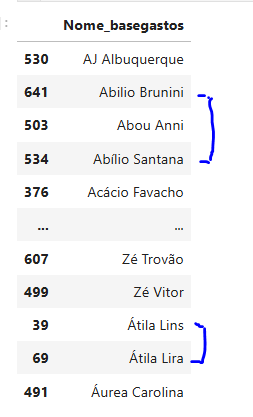

In [ ]:
# Criando o DataFrame sem duplicatas com o trio 
df_trio= df[['nuLegislatura', 'cpf', 'txNomeParlamentar', ]].drop_duplicates()

df_contagem = df_trio.groupby(['nuLegislatura', 'cpf']).size().reset_index(name='contagem')
df_contagem.head()

In [ ]:
df_contagem[df_contagem['contagem'] > 1]

In [ ]:
# PArecem nao existir duplicatas, ou seja, essa hipotese de inconsistencia nos dados, de 1 cpf conter mais de um registro de nome, nao existe.
# Teoricamente temos pares 'txNomeParlamentar' -  'cpf' únicos


In [ ]:
#Vamos selecionar agora os deputados com nuLegislatura	=2023 e sem os nomes dos aglomerados

df_legisl_2023= df[df['nuLegislatura'] == 2023]
#df[df['nuLegislatura'] == 2023]['txNomeParlamentar'].unique()

df_legisl_2023_deput= df_legisl_2023[~df_legisl_2023['txNomeParlamentar'].isin(aglomerado)]

df_legisl_2023_deput['txNomeParlamentar'].unique()


In [ ]:
df_listadeputado_unic = pd.DataFrame(df_legisl_2023_deput['txNomeParlamentar'].unique(),
                                     columns=['Nome'])
#np.savetxt('deputados_base_gastos.csv', df_legisl_2023_deput['txNomeParlamentar'].unique(), delimiter=';')


In [ ]:
df_legisl_2023_deput['txNomeParlamentar'].unique().size


In [ ]:
df_legisl_2023 = df[df['nuLegislatura'] == 2023]

# Filtra os deputados excluindo os nomes presentes em 'aglomerado'
df_legisl_2023_deput = df_legisl_2023[~df_legisl_2023['txNomeParlamentar'].isin(aglomerado)]

# Cria um DataFrame temporário com 'sgUF' e 'txNomeParlamentar'
# Remove duplicatas baseadas no nome do parlamentar, mantendo a primeira ocorrência
# Isso garante que cada nome de deputado tenha uma UF associada
df_temp = df_legisl_2023_deput[['sgUF', 'txNomeParlamentar','sgPartido']].drop_duplicates(subset=['txNomeParlamentar'])

# Renomeia a coluna 'txNomeParlamentar' para 'Nome' para o DataFrame final
df_listadeputado_unic = df_temp.rename(columns={'txNomeParlamentar': 'Nome'})

# Reorganiza as colunas para que 'sgUF' seja a primeira
df_listadeputado_unic = df_listadeputado_unic[['sgUF', 'Nome', 'sgPartido']]

# Opcional: Para verificar os nomes únicos (já feito implicitamente pela remoção de duplicatas)
# print(df_listadeputado_unic['Nome'].unique())

print(df_listadeputado_unic.head())

### 1.4.4 - verificaçao de consistencia de numero de deputados

In [ ]:
import locale

# Configurando locale para português do Brasil
locale.setlocale(locale.LC_ALL, 'pt_BR.UTF-8')

In [ ]:
# Filtrando deputados com registros em 202301
deputados_202301 = df[df['numAnoMes_compet'] == 202301]['txNomeParlamentar'].unique()
# Filtrando deputados com registros a partir de 202306  (para passar pelo menos 90 dias 
deputados_apos_202306 = df[df['numAnoMes_compet'] >= 202306]['txNomeParlamentar'].unique()

In [ ]:
# Encontrando os deputados que aparecem nas duas listas
deputados_filtrados =sorted( list(set(deputados_202301) & set(deputados_apos_202306)) )
deputados_filtrados =sorted( deputados_filtrados, key=locale.strxfrm)

deputados_filtrados = [deputado for deputado in deputados_filtrados if deputado not in aglomerado]
for item in sorted(deputados_filtrados):
    print(item)

In [ ]:
len(deputados_filtrados)

In [ ]:
#Temos 331 nomes de deputados que gastaram tanto em jan/23 quanto após junho/23, mas temos do site oficila da câmara, que 294 deputados foram reeleitos.
#Site ref.: https://www.camara.leg.br/noticias/912220-reeleicao-na-camara-alcanca-57-veja-quais-deputados-foram-reeleitos/

In [ ]:
df_avaliacao_registros = df[['nuLegislatura','txNomeParlamentar','nuDeputadoId', 'cpf','numAnoMes_compet']].drop_duplicates().\
sort_values(by=['nuLegislatura','txNomeParlamentar','nuDeputadoId', 'cpf','numAnoMes_compet'])



df_avaliacao_registros[df_avaliacao_registros['nuLegislatura']==2019]

In [ ]:
df_avaliacao_registros[df_avaliacao_registros['nuLegislatura']==2019]['numAnoMes_compet'].unique()

In [ ]:
#Para deputados com legsliatura em #todos os candidatos da legislatura anterior tiveram gastos apemnas no anomes de jan/2023, 
# entao parece não haver anomlaias quanto aos

In [ ]:
df_avaliacao_registros[df_avaliacao_registros['nuLegislatura']==2023]['nuDeputadoId'].drop_duplicates().count()

In [ ]:
df_avaliacao_registros[df_avaliacao_registros['nuLegislatura']==2023]['cpf'].drop_duplicates().count()

In [ ]:
#Para a legislatura de 2023, Foram registrados 629 ids 

In [ ]:
# Ainda mteos muito mais deputados na legislatura #vamos usar a base oficial histórica de deputados, disponivel abertamebente no site oficial da câmara de deputados
# https://dadosabertos.camara.leg.br/swagger/api.html?tab=staticfile

df_deputados_oficial = pd.read_csv(r"deputados.csv", sep=';',low_memory=False)
df_deputados_oficial.head()

In [ ]:
df_deputados_oficial[df_deputados_oficial['idLegislaturaFinal']==57].drop_duplicates().count()

In [ ]:
# apesar de termos 513 deputados oficialmente eleitos, após inicio de mandato podem temporariamente assumir deputados suplentes. 
#Pode ainda ter ocorrido desistências (assume alguma prefeitura, como na eleiçao de 2024, assumindo em 2025,

## 1.5
<div style="background-color:lightblue; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;">1.5 Criaçao de novas colunas: INCLUSAO DO FLAG DE REELEICAO  </span>
</div>


#### Parte 1 e 2 - tentativas de marcar flag com base em código

In [ ]:
"""
Parte 1: pegar a base de deputados reeleitos
Disponível em 
<https://www.camara.leg.br/noticias/912220-reeleicao-na-camara-alcanca-57-veja-quais-deputados-foram-reeleitos/>
"""

In [ ]:

df_deputados_reeleitos = pd.read_csv(r"deputados_reeleitos.csv", sep=',',low_memory=False)
df_deputados_reeleitos.head()


In [ ]:
df_deputados_reeleitos.shape

3temos 294 deputados registrados como eleitos 

In [ ]:
"""
Pegar o dataframe df_deputados_reeleitos e criar uma coluna nova "Nome_dep_reeleito_simplificado"
em que : 
- transformamos a coluna "Nome"colocando todas as letras em minúsculo
- depois substituiremos todas as vogais com acentuaçao, da lingua portuguesa, pellas vogais sem acentuação, ex.:  á ou ã ou â é substituído por a; ó ou ó ou õ é subsituído por o,  é ou ê substituir por e etc.  

"""

In [ ]:
import unicodedata

def simplificar_nome(nome):
    if pd.isna(nome): # Lidar com valores NaN (Not a Number)
        return nome
    nome = str(nome) # Garantir que é uma string
    # 1. Converter para minúsculas
    nome_minusculo = nome.lower()
    # 2. Remover acentos usando unicodedata
    nfkd_form = unicodedata.normalize('NFKD', nome_minusculo)
    only_ascii = "".join([char for char in nfkd_form if not unicodedata.combining(char)])

    # 3. Substituir "jr." por "jr"
    nome_minusculo = only_ascii.replace("jr.", "jr")
    
    return nome_minusculo

# Aplicar a função para criar a nova coluna
df_deputados_reeleitos['Nome_dep_reeleito_simplificado'] = df_deputados_reeleitos['Nome'].apply(simplificar_nome)
df_deputados_reeleitos.head(20)

In [ ]:
"""
PARTE 2 - PEGAR A BASE DE NOMES UNICOS d de deputados encontrados na base de gastos e aplicar transformaçao para simplificar os nomes
"""

In [ ]:
df_listadeputado_unic['Nome_dep_simplificado'] = df_listadeputado_unic['Nome'].apply(simplificar_nome)
df_listadeputado_unic.head(20)

In [ ]:
"""
Vamos fazer uma comparaçao de colunas para ver quais dos deputados das bases foram releitos ou nao

"""

In [ ]:
df_listadeputado_unic_1 = df_listadeputado_unic.copy()

In [ ]:
from fuzzywuzzy import process
import unicodedata
# --- Processamento ---

# Convertendo a coluna de reeleitos para um conjunto/lista para busca eficiente
# É importante ter os nomes de reeleitos em um formato que o fuzzywuzzy possa iterar
nomes_reeleitos_set = df_deputados_reeleitos['Nome_dep_reeleito_simplificado'].tolist()

# Criar a coluna 'flag_reeleito'
df_listadeputado_unic_1['flag_reeleito'] = 'Não' # Inicializa todos como 'Não'

# Definir um limite de similaridade (ex: 90 para alta similaridade)
# Este valor pode ser ajustado dependendo da precisão que você precisa
SIMILARITY_THRESHOLD = 90

# Iterar sobre cada nome no df_listadeputado_unic e verificar similaridade
for index, row in df_listadeputado_unic.iterrows():
    nome_para_comparar = row['Nome_dep_simplificado']

    # Usa process.extractOne para encontrar a melhor correspondência e sua pontuação
    # Retorna (melhor_match, score, indice_no_conjunto_de_busca)
    best_match = process.extractOne(nome_para_comparar, nomes_reeleitos_set)

    if best_match and best_match[1] >= SIMILARITY_THRESHOLD:
        df_listadeputado_unic_1.loc[index, 'flag_reeleito'] = 'Sim'


In [ ]:
 df_listadeputado_unic_1.head(10)

In [ ]:
df_listadeputado_unic_1['flag_reeleito'].value_counts()

In [ ]:
#Visto que so encontramos 288 nomes a prior indentifcados como reeleitos, menos que os 294 oficiais, entao vamos adaptar o algoritmo de busca por similaridade

In [ ]:
#df_listadeputado_unic_1.to_csv('df_listadeputado_unic.csv', sep=';', index=False)

In [ ]:
"""
Parte 2.2 )   CODIGO 2 
Visto que o codigo 1 só identificou 288 dos 294 deputados reeleitos, vamos tentar outra abordagem de copdigo

Usando IA para gerar codigo


Prompt:
 Escrever codigo para 

1) criar uma coluna string "flag_reeleito" no dataframe df_listadeputado_unic


Essa coluna "flag_reeleito" recebe o valor "Sim" se os elementos de df_listadeputado_unic['Nome_dep_simplificado']

estao contidos no conjunto da coluna df_deputados_reeleitos['Nome_dep_reeleito_simplificado'].


Fazer essa comparaçao de df_listadeputado_unic['Nome_dep_simplificado'] e df_deputados_reeleitos['Nome_dep_reeleito_simplificado'] por similaridade semantica. 
Considerar que muitas pessoas tem 2 sobrenomes, mas pode ser que apenas 1 deles tenha sido mencionado tanto na df_listadeputado_unic['Nome_dep_simplificado'] ou na df_deputados_reeleitos['Nome_dep_reeleito_simplificado'] . Quando a pessoa tiver 2 sobrenomes, pode omitir o do meio para fins de comparaçao de similaridade (Ex.: "joao da silva domes, pode ser considerado como  "joao gomes")
Também desocnsiderar termos como ("da", "de", "e").
Alguns títulos como doutor podem estar abreviados como "dr." ou "dr", pastor, como "pr". ou "pr", padre como "pe." ou "pe.", professor como "prof."ou "prof" ou vice versa. Considerar que essas trocas nao afetam a similaridade.

2)   incluir uma nova coluna em df_listadeputado_unic que é a coluna df_deputados_reeleitos['Nome_dep_reeleito_simplificado'] com a qual comparou anteriorimente

"""


In [ ]:

import pandas as pd
from fuzzywuzzy import fuzz
from fuzzywuzzy import process
import re

df_listadeputado_unic_2 = df_listadeputado_unic.copy()

def preprocess_name(name):
    """
    Normaliza o nome para comparação, removendo termos irrelevantes, abreviações de títulos
    e simplificando sobrenomes compostos.
    """
    if pd.isna(name):
        return ""
    name = str(name).lower()

    # Remover termos como "da", "de", "e"
    name = re.sub(r'\b(da|de|do|das|dos|e)\b', '', name)

    # Lidar com abreviações de títulos
    name = re.sub(r'\b(dr|dra|pr|pa|prof|pe)\.?\b', '', name)

    # Remover múltiplos espaços e espaços nas extremidades
    name = re.sub(r'\s+', ' ', name).strip()

    # Simplificar nomes com múltiplos sobrenomes (ex: "joao da silva gomes" para "joao gomes")
    parts = name.split()
    if len(parts) > 2:
        # Tenta pegar o primeiro nome e o último sobrenome
        # Isso é uma heurística e pode não ser perfeito para todos os casos
        name = f"{parts[0]} {parts[-1]}"
    return name

def find_best_match(name, reelected_names_set, threshold=80):
    """
    Encontra o melhor casamento para um nome na lista de reeleitos usando similaridade semântica.
    Retorna o nome reeleito correspondente se a similaridade for maior que o threshold, senão None.
    """
    processed_name = preprocess_name(name)
    if not processed_name:
        return None, 0

    best_match = None
    best_score = 0

    # Usar process.extractOne para encontrar o melhor casamento com fuzzywuzzy
    # Ele compara a string com todas as strings na lista e retorna a melhor.
    if reelected_names_set: # Garante que o conjunto não está vazio
        match = process.extractOne(processed_name, list(reelected_names_set), scorer=fuzz.token_set_ratio)
        if match and match[1] >= threshold:
            best_match = match[0] # Retorna o nome original do reeleito que deu match
            best_score = match[1]
    return best_match, best_score


In [ ]:
# --- INÍCIO DO CÓDIGO PARA CRIAR AS COLUNAS ---

# 1. Pré-processar os nomes dos deputados reeleitos para facilitar a comparação
# Criamos um set dos nomes pré-processados para busca rápida
# Mapeamos o nome pré-processado de volta para o nome original
processed_reelected_names_map = {}

for name in df_deputados_reeleitos['Nome_dep_reeleito_simplificado'].unique():
    processed_name = preprocess_name(name)
    if processed_name: # Garante que o nome pré-processado não é vazio
        # Se houver duplicidade de nomes pré-processados, o último será mantido.
        # Isso é uma consideração importante se os nomes originais podem ser diferentes
        # mas resultam no mesmo nome pré-processado.
        processed_reelected_names_map[processed_name] = name

reelected_names_set = set(processed_reelected_names_map.keys())


# 2. Criar as novas colunas no df_listadeputado_unic
df_listadeputado_unic_2['flag_reeleito'] = 'Nao' # Valor padrão
df_listadeputado_unic_2['Nome_dep_reeleito_comparado'] = None # Coluna para o nome que deu match

for index, row in df_listadeputado_unic_2.iterrows():
    dep_name = row['Nome_dep_simplificado']
    best_match_processed, score = find_best_match(dep_name, reelected_names_set, threshold=85) # Aumentar o threshold pode tornar a comparação mais rigorosa

    if best_match_processed:
        df_listadeputado_unic_2.at[index, 'flag_reeleito'] = 'Sim'
        # Usar o mapeamento para obter o nome original reeleito
        df_listadeputado_unic_2.at[index, 'Nome_dep_reeleito_comparado'] = processed_reelected_names_map[best_match_processed]

print("DataFrame df_listadeputado_unic_2 atualizado:")

In [ ]:
df_listadeputado_unic_2.head()

In [ ]:
df_listadeputado_unic_2 = df_listadeputado_unic_2.sort_values(by='Nome')
#df_listadeputado_unic_2.to_csv('df_listadeputado_unic_2.csv', sep=';', index=False)

In [ ]:
df_listadeputado_unic_2['flag_reeleito'].value_counts()

In [ ]:
#Nesse caso encontramos 298 nomes releitos em vez dos 294 previstos. 
#PRecisamos de mais uma etapa de verificaçao, na Parte 3



#### Parte 3 - atribuição final das flags

In [71]:
"""
Parte 3  - Parte final de atribuição das flags

Verificaçao dos campos [flags_reeleito] entre a base df_listadeputado_unic_1 e df_listadeputado_unic_2

Se fosse diferentes entre si , eram checados no dataframe oficial 
Nessa etapa de verificaçao , feita em software de planilha eletronica


""" 

'\nParte 3  - Parte final de atribuição das flags\n\nVerificaçao dos campos [flags_reeleito] entre a base df_listadeputado_unic_1 e df_listadeputado_unic_2\n\nSe fosse diferentes entre si , eram checados no dataframe oficial \nNessa etapa de verificaçao , feita em software de planilha eletronica\n\n\n'

In [72]:
df_listadeputado_unic_flag_reeleitos_verificada = pd.read_csv(r"df_listadeputado_unic_flag_reeleitos_verificada.csv", sep=';',low_memory=False)
df_listadeputado_unic_flag_reeleitos_verificada.head(10)

,sgUF,Nome,sgPartido,Nome_dep_simplificado,flag_reeleito_final
0,MT,Abilio Brunini,PL,abilio brunini,Nao
1,AP,Acácio Favacho,MDB,acacio favacho,Sim
2,AM,Adail Filho,REPUBLICANOS,adail filho,Nao
3,SP,Adilson Barroso,PL,adilson barroso,Nao
4,BA,Adolfo Viana,PSDB,adolfo viana,Sim
5,SP,Adriana Ventura,NOVO,adriana ventura,Sim
6,GO,Adriano do Baldy,PP,adriano do baldy,Sim
7,MG,Aécio Neves,PSDB,aecio neves,Sim
8,BA,Afonso Florence,PT,afonso florence,Sim
9,RS,Afonso Hamm,PP,afonso hamm,Sim


In [73]:
"""
amos incluir a nova coluna flag_reeleito no seu DataFrame df
baseando-se nos nomes dos parlamentares presentes em df_listadeputado_unic_flag_reeleitos_verificada
""" 

'\namos incluir a nova coluna flag_reeleito no seu DataFrame df\nbaseando-se nos nomes dos parlamentares presentes em df_listadeputado_unic_flag_reeleitos_verificada\n'

In [74]:
mapeamento_reeleicao = df_listadeputado_unic_flag_reeleitos_verificada.set_index('Nome')['flag_reeleito_final']

mapeamento_reeleicao

Nome
Abilio Brunini     Nao
Acácio Favacho     Sim
Adail Filho        Nao
Adilson Barroso    Nao
Adolfo Viana       Sim
                  ... 
Zé Trovão          Nao
Zé Vitor           Sim
Zeca Dirceu        Sim
Zezinho Barbary    Nao
Zucco              Nao
Name: flag_reeleito_final, Length: 617, dtype: object

In [75]:
# Use o método .map() para criar a nova coluna no DataFrame df
# Se um nome em df['txNomeParlamentar'] não for encontrado no dicionário,
# o valor correspondente em 'flag_reeleito' será NaN (Not a Number).

df['flag_reeleito'] = df['txNomeParlamentar'].map(mapeamento_reeleicao)

# no caso dos nomes dos aglomerados ( Ex,
df['flag_reeleito'] = df['flag_reeleito'].fillna("Nao aplicavel")

In [76]:

# Mapeia os valores da coluna 'flag_reeleito' para a nova coluna 'coluna_cat_reeleicao'
def mapear_categoria_reeleicao(valor):
    if valor == "Nao":
        return "Nao_reeleito"
    elif valor == "Sim":
        return "Reeleito"
    elif valor == "Nao aplicavel":
        return "NA"
    else:
        return None # Caso haja valores inesperados

df['cat_reeleicao'] = df['flag_reeleito'].apply(mapear_categoria_reeleicao)


In [77]:
df.tail(10)

,txNomeParlamentar,cpf,ideCadastro,nuCarteiraParlamentar,nuLegislatura,sgUF,sgPartido,codLegislatura,numSubCota,txtDescricao,...,nuDeputadoId,ideDocumento,urlDocumento,datEmissao_AAAAMM,numAnoMes_compet,TipoDocumento,desc_Subcota_Espec,macro_categoria,flag_reeleito,cat_reeleicao
604178,Lenir de Assis,6.738955e+10,231911.0,613.0,2023,PR,PT,57,122,"SERVIÇO DE TÁXI, PEDÁGIO E ESTACIONAMENTO",...,3792,7901071,https://www.camara.leg.br/cota-parlamentar/doc...,202504,202504,Recibo_outros,"SERVIÇO DE TÁXI, PEDÁGIO E ESTACIONAMENTO","SERVIÇO DE TÁXI, PEDÁGIO E ESTACIONAMENTO",Nao,Nao_reeleito
604266,Lenir de Assis,6.738955e+10,231911.0,613.0,2023,PR,PT,57,998,PASSAGEM AÉREA - SIGEPA,...,3792,319044,NaN,202503,202503,NF,PASSAGEM AÉREA - SIGEPA,PASSAGEM AÉREA,Nao,Nao_reeleito
604267,Lenir de Assis,6.738955e+10,231911.0,613.0,2023,PR,PT,57,998,PASSAGEM AÉREA - SIGEPA,...,3792,320977,NaN,202503,202503,NF,PASSAGEM AÉREA - SIGEPA,PASSAGEM AÉREA,Nao,Nao_reeleito
604268,Lenir de Assis,6.738955e+10,231911.0,613.0,2023,PR,PT,57,998,PASSAGEM AÉREA - SIGEPA,...,3792,320977,NaN,202503,202503,NF,PASSAGEM AÉREA - SIGEPA,PASSAGEM AÉREA,Nao,Nao_reeleito
604269,Lenir de Assis,6.738955e+10,231911.0,613.0,2023,PR,PT,57,998,PASSAGEM AÉREA - SIGEPA,...,3792,330330,NaN,202504,202504,NF,PASSAGEM AÉREA - SIGEPA,PASSAGEM AÉREA,Nao,Nao_reeleito
604271,Lenir de Assis,6.738955e+10,231911.0,613.0,2023,PR,PT,57,998,PASSAGEM AÉREA - SIGEPA,...,3792,325031,NaN,202504,202504,NF,PASSAGEM AÉREA - SIGEPA,PASSAGEM AÉREA,Nao,Nao_reeleito
604272,Lenir de Assis,6.738955e+10,231911.0,613.0,2023,PR,PT,57,998,PASSAGEM AÉREA - SIGEPA,...,3792,325527,NaN,202504,202504,NF,PASSAGEM AÉREA - SIGEPA,PASSAGEM AÉREA,Nao,Nao_reeleito
604273,Lenir de Assis,6.738955e+10,231911.0,613.0,2023,PR,PT,57,998,PASSAGEM AÉREA - SIGEPA,...,3792,325532,NaN,202504,202504,NF,PASSAGEM AÉREA - SIGEPA,PASSAGEM AÉREA,Nao,Nao_reeleito
604274,Lenir de Assis,6.738955e+10,231911.0,613.0,2023,PR,PT,57,998,PASSAGEM AÉREA - SIGEPA,...,3792,329664,NaN,202504,202504,NF,PASSAGEM AÉREA - SIGEPA,PASSAGEM AÉREA,Nao,Nao_reeleito
604275,Lenir de Assis,6.738955e+10,231911.0,613.0,2023,PR,PT,57,998,PASSAGEM AÉREA - SIGEPA,...,3792,329664,NaN,202504,202504,NF,PASSAGEM AÉREA - SIGEPA,PASSAGEM AÉREA,Nao,Nao_reeleito


## 1.6 
<div style="background-color:lightblue; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;">1.6 Categoria do cargo: Titular ou Suplente</span>
</div>

Usar a base disponivel em:  https://www.camara.leg.br/internet/agencia/infograficos-html5/tabelasEleicoes/deputados-eleitos-estado/index.html

#### Partes 1 a 4 - tentativa via codigo (pular)

In [ ]:
"""

Parte 1  - Pegar a base de deputados eleitos, baixada do site https://www.camara.leg.br/internet/agencia/infograficos-html5/tabelasEleicoes/deputados-eleitos-estado/index.html

"""


# 1.portar a base e renomear as colunas
df_listadeputados_eleitos = pd.read_csv(
    'deputados_federais_eleitos_2023_a_2026.csv', 
    encoding='utf-8', 
    sep=';')
# Renomear as colunas
df_listadeputados_eleitos = df_listadeputados_eleitos.rename(columns={'Nome': 'Nome_dep_eleito'})

In [ ]:
df_listadeputados_eleitos

In [ ]:
def simplificar_nome(nome):
    if pd.isna(nome): # Lidar com valores NaN (Not a Number)
        return nome
    nome = str(nome) # Garantir que é uma string
    # 1. Converter para minúsculas
    nome_minusculo = nome.lower()
    # 2. Remover acentos usando unicodedata
    nfkd_form = unicodedata.normalize('NFKD', nome_minusculo)
    only_ascii = "".join([char for char in nfkd_form if not unicodedata.combining(char)])

    # 3. Substituir "jr." por "jr"
    nome_minusculo = only_ascii.replace("jr.", "jr")
    
    return nome_minusculo

# Aplicar a função para criar a nova coluna
df_listadeputados_eleitos['Nome_dep_eleito_simplificado'] = df_listadeputados_eleitos['Nome_dep_eleito'].apply(simplificar_nome)
df_listadeputados_eleitos.head(20)

In [ ]:
df_listadeputado_unic_10 = df_listadeputado_unic_flag_reeleitos_verificada.copy()

In [ ]:
"""
Parte 2 - comparar a lista dos deputados efetivamente eleitos (512) com a lista de  deputados presentes nos gastos de legislatura vigente 
"""

import pandas as pd
from fuzzywuzzy import fuzz
import re
# --- 1) Pré-processamento e Lógica de Comparação ---

def limpar_nome_para_comparacao(nome):
    """
    Limpa nomes para comparação, removendo títulos e preposições.
    """
    # Remove títulos e abreviações comuns
    nome = re.sub(r'\b(dr|dr\.|pr|pr\.|pe|pe\.|prof|prof\.|sra|sr|sr\.)\b', '', nome)
    # Remove preposições e conjunções
    nome = re.sub(r'\b(da|de|do|dos|das|e)\b', '', nome)
    # Remove múltiplos espaços
    nome = re.sub(r'\s+', ' ', nome).strip()
    return nome

def encontrar_melhor_correspondencia(nome_unic, df_eleitos):
    """
    Encontra a melhor correspondência de nome usando similaridade fuzzy.
    """
    nome_limpo_unic = limpar_nome_para_comparacao(nome_unic)
    
    melhor_match = None
    melhor_score = 0
    
    for _, row in df_eleitos.iterrows():
        nome_eleito = row['Nome_dep_eleito_simplificado']
        nome_limpo_eleito = limpar_nome_para_comparacao(nome_eleito)

        # Lógica para tratar nomes com mais de duas palavras (ex: 'joao da silva gomes')
        palavras_unic = nome_limpo_unic.split()
        palavras_eleito = nome_limpo_eleito.split()
        
        # Considera a primeira e última palavra para comparação
        if len(palavras_unic) > 2:
            nome_unic_simples = f"{palavras_unic[0]} {palavras_unic[-1]}"
            score1 = fuzz.ratio(nome_unic_simples, nome_limpo_eleito)
        else:
            score1 = 0
            
        if len(palavras_eleito) > 2:
            nome_eleito_simples = f"{palavras_eleito[0]} {palavras_eleito[-1]}"
            score2 = fuzz.ratio(nome_limpo_unic, nome_eleito_simples)
        else:
            score2 = 0
        
        # Usa token_sort_ratio para comparação geral, que ignora a ordem das palavras
        score_base = fuzz.token_sort_ratio(nome_limpo_unic, nome_limpo_eleito)

        # Combina os scores, priorizando o melhor
        score = max(score_base, score1, score2)
        
        # O valor 80 é um bom ponto de partida, mas pode ser ajustado
        if score > melhor_score:
            melhor_score = score
            melhor_match = nome_eleito

    if melhor_score >= 80: 
        return melhor_match
    else:
        return None

In [ ]:
# --- 2) Incluir a coluna com a correspondência ---
df_listadeputado_unic_10['Nome_dep_eleito_simplificado'] = (
    df_listadeputado_unic_10['Nome_dep_simplificado']
    .apply(lambda x: encontrar_melhor_correspondencia(x, df_listadeputados_eleitos))
)


In [ ]:
# --- 3) Criar a coluna 'flag_eleito_direto' ---

# 3.1) Inicializa com valor padrão 'Nao'
df_listadeputado_unic_10['flag_eleito_direto_1'] = 'Nao'

# 3.2) Recebe valor "Sim" se houver similaridade semântica
df_listadeputado_unic_10.loc[
    df_listadeputado_unic_10['Nome_dep_eleito_simplificado'].notna(), 
    'flag_eleito_direto_1'
] = 'Sim'

# 3.3) Recebe valor "Sim" se 'flag_reeleito_final' for "Sim"
df_listadeputado_unic_10.loc[
    df_listadeputado_unic_10['flag_reeleito_final'] == 'Sim', 
    'flag_eleito_direto_1'
] = 'Sim'

# Exibir o DataFrame final
print("DataFrame com as novas colunas:")
df_listadeputado_unic_10.head(10)

In [ ]:
#df_listadeputado_unic_10 = df_listadeputado_unic_10.drop(['flag_eleito_direto'], axis=1)

In [ ]:
df_listadeputado_unic_10.head(10)

In [ ]:
# --- 4) Contagem das categorias Sim e Nao ---
print("\nContagem de flag_eleito_direto:")
contagem = df_listadeputado_unic_10['flag_eleito_direto_1'].value_counts()
print(contagem)

In [ ]:
# Filtrar registros de fevereiro de 2023 com vlrLiquido não nulo
df_filt = df[
    (df['datEmissao_AAAAMM'] == 202302) &
    (df['vlrLiquido'].notnull()) &
    (~df['txNomeParlamentar'].isin(aglomerado))
]

# Selecionar colunas desejadas e remover duplicatas
df_dep_gastos_iniciomandato = df_filt[['txNomeParlamentar', 'sgUF', 'sgPartido']].drop_duplicates()
df_dep_gastos_iniciomandato.count()

In [ ]:
df_dep_gastos_iniciomandato

In [ ]:
# Passo 1: Criar a nova coluna copiando os valores
df_listadeputado_unic_10['flag_eleito_direto_2'] = df_listadeputado_unic_10['flag_eleito_direto_1']

# Passo 2: Criar conjunto de nomes com gastos registrados
nomes_com_gasto = set(df_dep_gastos_iniciomandato['txNomeParlamentar'])

# Passo 3: Atualizar valores da nova coluna com base na condição
df_listadeputado_unic_10.loc[
    (df_listadeputado_unic_10['flag_eleito_direto_2'] == 'Nao') &
    (df_listadeputado_unic_10['Nome'].isin(nomes_com_gasto)),
    'flag_eleito_direto_2'
] = 'Sim'

In [ ]:
df_listadeputado_unic_10

In [ ]:
df_listadeputado_unic_10.to_csv('df_listadeputado_unic_10.csv', sep=';', index=False)

In [ ]:
""" ----------------------------------------------------------
Parte 3 - vamos verificar com os registros efetivamente existentes na base de gastos

Essa etapa foi feita em excel, olhando os valores que em flag_eleito)
-----------------------------------------------------------------"""

In [ ]:
df_listadeputado_unic_flag_eleitos_verificada = pd.read_csv(r"df_listadeputado_unic_flag_eleitos_verificada.csv", sep=';',low_memory=False)
df_listadeputado_unic_flag_eleitos_verificada.head(10)

In [ ]:

df_listadeputado_unic_flag_eleitos_verificada['flag_eleito_direto_3'].value_counts()

In [ ]:
# Está faltando 1 deputados

In [ ]:
pip install pingouin

In [ ]:
""" ----------------------------------------------------------


Parte 4 - Visto que nao tive confiança nos resultados anteriores, vou verificar a partir do historico dos candidatos



-----------------------------------------------------------------"""

In [ ]:
df_info_deput=df[['txNomeParlamentar', 'cpf', 'ideCadastro', 'nuCarteiraParlamentar', 'nuDeputadoId']].drop_duplicates().sort_values(by='txNomeParlamentar', ascending=True)
df_info_deput

In [ ]:
"""
Nota-se que ideCadastro é o mesmo numero presente no link do historico de cada deputado. 
Ex.: AJ Albuquerque 
https://www.camara.leg.br/deputados/204549 
ideCadastro=204549
"""

In [ ]:
import pandas as pd
from bs4 import BeautifulSoup
import re
import os

# Define o caminho do arquivo HTML
file_path = "Histórico de Movimentação Parlamentar - Portal da Câmara dos Deputados.html"

# Verifica se o arquivo existe
if not os.path.exists(file_path):
    print(f"Erro: O arquivo '{file_path}' não foi encontrado.")
else:
    # 1. Ler e parsear o arquivo HTML
    with open(file_path, "r", encoding="utf-8") as f:
        html_content = f.read()

    soup = BeautifulSoup(html_content, "html.parser")

    # 2. Inicializar uma lista para armazenar os dados
    data_list = []

    # 3. Encontrar todos os blocos de deputado (div class="card mb-3")
    deputado_cards = soup.find_all("div", class_="card mb-3")

    # 4. Iterar sobre cada bloco para extrair as informações
    for card in deputado_cards:
        # Extrair dados do cabeçalho (card-header)
        header = card.find("div", class_="card-header")
        if header:
            # 1.1) Idecadastro: extrair o número do link
            link = header.find("a")
            idecadastro = re.search(r'/(\d+)$', link['href']).group(1) if link else None

            # 1.2) Nome_deputado e 1.3) Partido/UF
            # O texto está diretamente no header, após a tag <a>
            header_text = header.get_text(strip=True)
            parts = header_text.split('-', 1)
            nome_deputado = parts[0].strip() if len(parts) > 0 else None
            partido_uf = parts[1].strip() if len(parts) > 1 else None

            partido = partido_uf.split('/')[0] if partido_uf and '/' in partido_uf else None
            uf = partido_uf.split('/')[1] if partido_uf and '/' in partido_uf else None
            
        # Extrair dados do corpo (card-body) - histórico
        body = card.find("div", class_="card-body")
        if body:
            movimentacoes = body.find_all("li")
            for mov in movimentacoes:
                mov_text = mov.get_text(strip=True)
                
                # Extrair data, hora e descrição do evento
                match = re.search(r'^(\d{2}/\d{2}/\d{4}) (\d{2}:\d{2}:\d{2}) - (.*)', mov_text)
                if match:
                    data_evento_str = match.group(1)
                    desc_evento = match.group(3).strip()
                    
                    # Criar a coluna cd_data_evento no formato AAAAMMDD
                    cd_data_evento = pd.to_datetime(data_evento_str, format='%d/%m/%Y').strftime('%Y%m%d')
                    
                    data_list.append({
                        'Idecadastro': idecadastro,
                        'Nome_deputado': nome_deputado,
                        'Partido': partido,
                        'UF': uf,
                        'cd_data_evento': cd_data_evento,
                        'desc_evento': desc_evento
                    })
                
    # 5. Criar o DataFrame
    df_info_historico_deputado = pd.DataFrame(data_list)

    

In [ ]:
df_info_historico_deputado.head(50)

In [ ]:
 # 6. Selecionar o evento mais antigo de cada deputado
df_evento_mais_antigo = df_info_historico_deputado.sort_values('cd_data_evento').drop_duplicates(subset=['Idecadastro'], keep='first')
df_evento_mais_antigo

In [ ]:
# df_evento_mais_antigo.to_csv('df_evento_mais_antigo.csv', sep=';', index=False, encoding='utf-8')


In [ ]:
df_evento_mais_antigo['desc_evento'].unique()

In [ ]:
# df_evento_mais_antigo.to_csv('df_evento_mais_antigo.csv', sep=';', index=False, encoding='utf-8')


In [ ]:
"""
Tentativa de verificar nro deputados
"""
deputados_com_posse = df_evento_mais_antigo[df_evento_mais_antigo['desc_evento'].str.contains('Posse na Sessão Preparatória', case=False, na=False)]

# 2. Contar o número de linhas (deputados) no DataFrame filtrado
len(deputados_com_posse)

In [ ]:
"""
Vamos exportar o arquivo para convrerncia
""" 
#df_teste_dep = df[['txNomeParlamentar', 'cpf', 'ideCadastro', 'sgPartido', 'sgUF']].drop_duplicates()
#df_teste_dep.to_csv('df_teste_dep.csv', sep=';', index=False, encoding='utf-8')

#### Parte 5 - marcação final ( usar esse)

In [78]:
"""
Parte 5 - Marcaçao final
"""

'\nParte 5 - Marcaçao final\n'

In [79]:
# 1) Importar o arquivo CSV para o dataframe df_cat_titularsuplente

df_cat_titularsuplente = pd.read_csv('base_cargo_titularsuplente.csv',sep=';')

In [80]:
df_cat_titularsuplente.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 610 entries, 0 to 609
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   ideCadastro        610 non-null    int64 
 1   Nome_deputado      610 non-null    object
 2   Partido            610 non-null    object
 3   UF                 610 non-null    object
 4   cat_cargo_titusup  610 non-null    object
dtypes: int64(1), object(4)
memory usage: 24.0+ KB


In [81]:
#df_cat_titularsuplente['ideCadastro']

In [82]:
df['ideCadastro']

0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
            ...   
604271    231911.0
604272    231911.0
604273    231911.0
604274    231911.0
604275    231911.0
Name: ideCadastro, Length: 522775, dtype: float64

In [83]:
df['ideCadastro'] = df['ideCadastro'].fillna(0)
df['ideCadastro'] = df['ideCadastro'].astype('int64')
#df['ideCadastro']= df['ideCadastro'].astype('object')
df['ideCadastro']

0              0
1              0
2              0
3              0
4              0
           ...  
604271    231911
604272    231911
604273    231911
604274    231911
604275    231911
Name: ideCadastro, Length: 522775, dtype: int64

In [84]:

    
# 2) Incluir a coluna 'cat_cargo_titusup' no dataframe 'df'

df = pd.merge(df, df_cat_titularsuplente[['ideCadastro', 'cat_cargo_titusup']],
              on='ideCadastro',
              how='left')
df.tail()

,txNomeParlamentar,cpf,ideCadastro,nuCarteiraParlamentar,nuLegislatura,sgUF,sgPartido,codLegislatura,numSubCota,txtDescricao,...,ideDocumento,urlDocumento,datEmissao_AAAAMM,numAnoMes_compet,TipoDocumento,desc_Subcota_Espec,macro_categoria,flag_reeleito,cat_reeleicao,cat_cargo_titusup
522770,Lenir de Assis,6.738955e+10,231911,613.0,2023,PR,PT,57,998,PASSAGEM AÉREA - SIGEPA,...,325031,NaN,202504,202504,NF,PASSAGEM AÉREA - SIGEPA,PASSAGEM AÉREA,Nao,Nao_reeleito,Suplente
522771,Lenir de Assis,6.738955e+10,231911,613.0,2023,PR,PT,57,998,PASSAGEM AÉREA - SIGEPA,...,325527,NaN,202504,202504,NF,PASSAGEM AÉREA - SIGEPA,PASSAGEM AÉREA,Nao,Nao_reeleito,Suplente
522772,Lenir de Assis,6.738955e+10,231911,613.0,2023,PR,PT,57,998,PASSAGEM AÉREA - SIGEPA,...,325532,NaN,202504,202504,NF,PASSAGEM AÉREA - SIGEPA,PASSAGEM AÉREA,Nao,Nao_reeleito,Suplente
522773,Lenir de Assis,6.738955e+10,231911,613.0,2023,PR,PT,57,998,PASSAGEM AÉREA - SIGEPA,...,329664,NaN,202504,202504,NF,PASSAGEM AÉREA - SIGEPA,PASSAGEM AÉREA,Nao,Nao_reeleito,Suplente
522774,Lenir de Assis,6.738955e+10,231911,613.0,2023,PR,PT,57,998,PASSAGEM AÉREA - SIGEPA,...,329664,NaN,202504,202504,NF,PASSAGEM AÉREA - SIGEPA,PASSAGEM AÉREA,Nao,Nao_reeleito,Suplente


In [ ]:
df['cat_cargo_titusup'] = df['cat_cargo_titusup'].fillna('NA')

## 1.7 
<div style="background-color:lightblue; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;">1.7 Categoria gênero</span>
</div>

In [85]:
#df_agrup_preliminar[['txNomeParlamentar']].to_csv( 'nomes_parlamentares.csv', index=False, encoding='utf-8')#

#df=df.drop(['genero_x', 'genero_y'], axis=1, inplace=True)
#df=df.drop(['genero'], axis=1, inplace=True)

In [86]:
df_genero = pd.read_csv('genero_dep.csv', encoding='utf-8')

In [87]:
# 2. Incorporar a coluna 'genero' de df_genero no dataframe df

df = pd.merge(
    df,
    df_genero[['txNomeParlamentar', 'genero']], # Seleciona as colunas a serem incorporadas
    on='txNomeParlamentar', # Define a coluna-chave para a junção
    how='left' # Garante que todas as linhas de 'df' sejam mantidas
)

In [88]:
df['genero'] = df['genero'].fillna('NA')
df.head()

,txNomeParlamentar,cpf,ideCadastro,nuCarteiraParlamentar,nuLegislatura,sgUF,sgPartido,codLegislatura,numSubCota,txtDescricao,...,urlDocumento,datEmissao_AAAAMM,numAnoMes_compet,TipoDocumento,desc_Subcota_Espec,macro_categoria,flag_reeleito,cat_reeleicao,cat_cargo_titusup,genero
0,LID.GOV-CD,NaN,0,NaN,2023,NaN,NaN,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,https://www.camara.leg.br/cota-parlamentar/doc...,202302,202302,NF,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,Nao aplicavel,NA,NaN,NA
1,LID.GOV-CD,NaN,0,NaN,2023,NaN,NaN,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,https://www.camara.leg.br/cota-parlamentar/doc...,202306,202306,NF,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,Nao aplicavel,NA,NaN,NA
2,LID.GOV-CD,NaN,0,NaN,2023,NaN,NaN,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,https://www.camara.leg.br/cota-parlamentar/doc...,202307,202307,NF,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,Nao aplicavel,NA,NaN,NA
3,LID.GOV-CD,NaN,0,NaN,2023,NaN,NaN,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,https://www.camara.leg.br/cota-parlamentar/doc...,202308,202308,NF,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,Nao aplicavel,NA,NaN,NA
4,LID.GOV-CD,NaN,0,NaN,2023,NaN,NaN,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,https://www.camara.leg.br/cota-parlamentar/doc...,202309,202309,NF,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,Nao aplicavel,NA,NaN,NA


## 1.8
<div style="background-color:lightblue; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;" >1.8  Ajustes em variáveis envolvendo Gastos  e Correção por IPCA </span>
</div>

### 1.8.1
<div style="background-color:yellow; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;">Verificaçao se o campo de vlrLiquido e vlrRestituicao sao complementares   </span>
</div>

In [ ]:
# checagem da coluna vlrRestituicao
df[df['vlrRestituicao'].notna()]

In [ ]:
df['vlrLiquido'].sum()

In [ ]:
df['vlrRestituicao'].sum()

In [ ]:
df['vlrRestituicao'].sum()/df['vlrLiquido'].sum() 

#Vamos ver a relação de gastos por restituição x gastos padrão

In [ ]:
df.groupby('numAnoMes_compet').agg(
    soma_vlrLiquido=('vlrLiquido', 'sum'),
    soma_vlrRestituicao=('vlrRestituicao', 'sum')
).reset_index().sort_values(by='numAnoMes_compet', ascending=True)


In [ ]:
df_rest = df[df['vlrRestituicao'].notna()][[
    'txNomeParlamentar',
    'numAnoMes_compet',
    'desc_Subcota_Espec',
    'vlrDocumento',
    'vlrGlosa',
    'vlrLiquido',
    'vlrRestituicao',
    'datPagamentoRestituicao'
]]
df_rest

In [ ]:
 # df_rest.to_csv(    'df_rest.csv',     sep=';',     encoding='utf-8',     index=False)

In [ ]:
"""
Após verificação o dataframe nota-se que sao valores gastos e nao devidos, portanto ocorreu restituição aos cofresn públicos, nao co nstanto nada em valors Liquidos

DEssa maneira, para nossa aanálise vamos prosseugir usando apenas a coluna de vlRLiquido
"""

In [ ]:
# df['vlrGastos']= df['vlrLiquido'] -  df['vlrRestituicao']  ---> formula errada


In [ ]:
#df=df.drop('vlrTotal', axis=1)

### Backup coluna vlrLiquido

<div style="background-color:yellow; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;"> !!!  </span>
</div>

In [ ]:
# Atriibuindo nova coluna para backup de valores originais;  

df['vlrLiquido_original'] = df['vlrLiquido']   #cria uma copia dos valores originais 

### 1.8.2
<div style="background-color:yellow; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;"> 1.8.2Procura por valores nuLoS  </span>
</div>

In [ ]:
colunas_selecionadas = [
    'txNomeParlamentar',
    'cpf',
    'ideCadastro',
    'nuLegislatura',
    'sgUF',
    'sgPartido',
    'numSubCota',
    'txtDescricao',
    'numEspecificacaoSubCota',
    'txtDescricaoEspecificacao',
    'vlrDocumento',
    'vlrGlosa',
    'vlrLiquido',
    'numRessarcimento',
    'datPagamentoRestituicao',
    'vlrRestituicao',
    'datEmissao_AAAAMM',
    'numAnoMes_compet',
    'desc_Subcota_Espec',
    'macro_categoria'
]

In [ ]:
df[df['vlrLiquido'].isnull()][colunas_selecionadas]

In [ ]:
df_nulos = df[df['vlrLiquido'].isnull()]
df_nulos

In [ ]:
len(df_nulos)

In [ ]:
df_nulos.to_csv(    'df_nulos.csv',     sep=';',     encoding='UTF-8',     index=False) 

In [ ]:
df_nulos['vlrDocumento'].sum()

In [ ]:
"""
Apos avaliação em Excel, vemos que ha muitos casos com valorDocumento preenchido mas sem vlr.
Nos ite da camara, aparecem esses gastos.
"""

In [ ]:
df.groupby('numAnoMes_compet')['vlrLiquido'].sum().reset_index().sort_values(by='numAnoMes_compet', ascending=True)

In [ ]:
df_somas = df.groupby('numAnoMes_compet').agg(
    soma_vlrLiquido=('vlrLiquido', 'sum'),
    soma_vlrLiquido_original=('vlrLiquido_original', 'sum')
).reset_index().sort_values(by='numAnoMes_compet', ascending=True)
df_somas

In [ ]:
df[df['vlrRestituicao'].isin([0, np.nan])]

In [ ]:
df['vlrGastos'] = np.where(
    (df['vlrLiqudo_original'].isin([0, np.nan])) & (df['vlrRestituicao'].isin([0, np.nan])),
    df['vlrDocumento'] - df['vlrGlosa'],
    df['vlrLiquido_original']
)

In [ ]:
colunas_selec=['txNomeParlamentar', 'numAnoMes_compet', 'macro_categoria','desc_Subcota_Espec',
           'vlrDocumento', 'vlrGlosa', 'vlrLiquido','vlrRestituicao','vlrLiquido_original']


df[df['vlrLiquido'].isin([0, np.nan])][colunas_selec]

In [ ]:
df_agrup_2 = df.groupby('numAnoMes_compet').agg(
    soma_vlrLiquido_original=('vlrLiquido_original', 'sum'),
    soma_vlrGastos=('vlrGastos', 'sum')
).reset_index()

df_agrup_2['diferenca'] = df_agrup_2['soma_vlrGastos'] - df_agrup_2['soma_vlrLiquido_original']
df_agrup_2.sort_values(by='numAnoMes_compet', ascending=True)

In [ ]:
#df['vlrLiquido']=df['vlrLiquido'].fillna(0)

### 1.8.3
<div style="background-color:yellow; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;"> Procura por valores negativos  </span>
</div>

In [ ]:
df[df['vlrLiquido']<0][colunas_selec].sort_values(by='vlrLiquido', ascending=True)

In [ ]:
df[df['vlrLiquido']<0]['desc_Subcota_Espec'].unique()

In [ ]:
# Valores negativos - passagens aéreas, por exemplo, isso ocorre quando são emitidos bilhetes de compensação pela não-utilização de uma passagem.

### 1.8.4
<div style="background-color:yellow; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;">1.8.4 - correção por ipca   </span>
</div>

Vamsoa tualziar os gastos considernado o último mês anril.25/
PAra eliminar efeios temporais, vamos aplicar uma correção nos valores do passado para levar ao mes de abril/25.
Se gasto ocorreu em fev/25, para levar a valor futuro, precisa atualizar o valor apresentado d

 Valor futuro = Valor presente (1+taxa mensal) ^ (n meses)

 Como a taxa inicial é 
 
   VF (abril/25) = VP_fev/25  * (1+var_mensal fev/25) * (1+var_mensal março/25) 

ou 

   VF (abril/25) = VP_jan/25  * (1+ var_mensal jan/25) * (1+var_mensal fev/25) * (1+var_mensal março/25)

   O trecho de multiplicação do termo do VP foi claculado via excel para cada mês desde fev/23 até março/25, considernado as taxas de ipca 

#### Base IPCA

In [ ]:
df_ipca = pd.read_csv('Base_ipca_ajustada.csv', encoding='utf-8')
df_ipca

In [ ]:
df_ipca['cd_anomes'].unique()

In [ ]:
df_ipca['cd_anomes'].dtype

In [ ]:
df_ipca['cd_anomes'] = df_ipca['cd_anomes'].astype(str)
df_ipca['cd_anomes'].dtype

In [ ]:
df_ipca['cd_anomes'].unique()

In [ ]:
df_ipca['cd_anomes'] = df_ipca['cd_anomes'].str.replace('.0', '', regex=False)
df_ipca['cd_anomes'] = df_ipca['cd_anomes'].replace('nan', np.nan)

In [ ]:
df_ipca['cd_anomes'].unique()

#### Base df 

In [ ]:
df['numAnoMes_compet'].dtype

In [ ]:
df['numAnoMes_compet'].unique()

In [ ]:
df['numAnoMes_compet'].isnull().any()

In [ ]:
df['numAnoMes_compet'] = df['numAnoMes_compet'].astype(str)
df['numAnoMes_compet'].unique()

#### Merge das bases e correção dos valores

In [ ]:
# 1. Juntar os dois DataFrames
# O merge é feito usando as colunas de chave e mantém todas as linhas de 'df'

df = pd.merge(
    df,
    df_ipca[['cd_anomes', 'fator_correcao_vf_abril25']], # Seleciona apenas as colunas necessárias
    left_on='numAnoMes_compet',
    right_on='cd_anomes',
    how='left'
)


In [ ]:
#df=df.drop(['cd_anomes_x', 'cd_anomes_y','fator_correcao_vf_abril25_x','fator_correcao_vf_abril25_y'], axis=1)

In [ ]:
df.head(20)

In [ ]:
df[df['vlrLiquido'].isnull()]

In [ ]:
#df=df.drop(['vlrGastos_futuro'], axis=1)

In [ ]:
# 2. Criar a nova coluna 'vlrLiquido_futuro'
# A multiplicação é feita de forma vetorizada. Se não houver correspondência, o resultado será NaN
df['vlrGastos_futuro'] = df['vlrGastos'] * df['fator_correcao_vf_abril25']
df.head()

### 1.8.5
<div style="background-color:yellow; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;">1.8.5
    - atribuição coluna para próximos passos  </span>
</div>

In [ ]:
#df['vlrLiquido']=df['vlrGastos_futuro']

# Exportação da base

In [ ]:
#df.to_csv( 'base_df.csv',     sep=';',     encoding='utf-8',     index=False)

In [ ]:
# AMOATRA / sample
"""

df[[
    'txNomeParlamentar', 
    'ideCadastro', 
    'sgUF',
    'sgPartido', 
    'cat_reeleicao', 
    'cat_cargo_titusup',
    'numAnoMes_compet',
    'desc_Subcota_Espec',
    'vlrLiquido'
]].sample(10, random_state=42)
"""

# 2.
 <div style="background-color:lightcoral; padding: 20px;">
  <span style="font-size:20px; font-weight:bold;">2. Análise exploratória dos dados</span>
</div>

In [ ]:
# Importando a base 
#df=  pd.read_csv(      'base_df.csv',    sep=';',    encoding='utf-8')

In [ ]:
df.describe()

In [ ]:
#Colunas de interesse  
# colunas = ['txNomeParlamentar', 'sgUF', 'sgPartido','txtDescricao', 'vlrLiquido', 'numMes', 'numAno']

## 2.0 
<div style="background-color:lightblue; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;">2.0.Verificações  </span>`
</div>

### 2.0.1
<div style="background-color:rgb(255, 219, 88); padding: 10px;">
  <span style="font-size:14px; font-weight:bold;"> 2.1.1 Verificaçao:  nro de deputados eleitos e encontrados na base de gastos de cotas + Cota mensal </span>
</div>

Limites mensais inacumuláveis:
- "LOCAÇÃO OU FRETAMENTO DE VEÍCULOS AUTOMOTORES" <= 12713.00  
- "SERVIÇO DE TÁXI, PEDÁGIO E ESTACIONAMENTO" <= 2700.00  
- "COMBUSTÍVEIS E LUBRIFICANTES."<=9392   
- "SERVIÇO DE SEGURANÇA PRESTADO POR EMPRESA ESPECIALIZADA"<=8.700.00   
- "PARTICIPAÇÃO EM CURSO, PALESTRA OU EVENTO SIMILAR' <=7697.17   
- complementação de auxílio-moradia<=  4.148,80    
Obs.: o complemento de auxilio moradia não aparece nas categorias de gastos aqui...       
Falta transparência quanto a esse gasto. N!AO PRECISA APRESENTAR COMPROVANTE ?


In [ ]:
#df_deputados_eleitos.value_counts().reset_index()  

In [138]:
# Passo 1: Criar o primeiro DataFrame com o número de deputados por estado e a cota parlamentar disponível
dados_cota = {
    "sgUF": ["AC", "DF", "MT", "RJ", "SE", "AL", "ES", "PA", "RN", "SP",
             "AM", "GO", "PB", "RO", "TO", "AP", "MA", "PE", "RR", "BA",
             "MG", "PI", "RS", "CE", "MS", "PR", "SC"],
    "Cota_Parlamentar_R$": [50426.26, 36582.46, 45221.83, 41553.77, 45933.06,
                             46737.90, 43217.71, 48021.25, 48525.79, 42837.33,
                             49363.92, 41300.86, 47826.36, 49466.29, 45297.41,
                             49168.58, 47945.49, 47470.60, 51406.33, 44804.65,
                             41886.51, 46765.57, 46669.70, 48245.57, 46336.64,
                             44665.66, 45671.58]
}

df_cotas = pd.DataFrame(dados_cota)


In [139]:
# Passo 2

# Obtendo o número de deputados por estado presentes nos gastos
df_deputados_gastos = df.groupby("sgUF")["txNomeParlamentar"].nunique().reset_index()
df_deputados_gastos.rename(columns={"txNomeParlamentar": "Numero_Deputados_Gastos"}, inplace=True)

In [140]:
#Passo 3

# Mesclando com a cota parlamentar
df_cotas = pd.merge(df_cotas, df_deputados_gastos, on="sgUF")
df_cotas


,sgUF,Cota_Parlamentar_R$,Numero_Deputados_Gastos
0,AC,50426.26,11
1,DF,36582.46,9
2,MT,45221.83,13
3,RJ,41553.77,57
4,SE,45933.06,12
5,AL,46737.90,9
6,ES,43217.71,10
7,PA,48021.25,19
8,RN,48525.79,9
9,SP,42837.33,87


In [141]:
# Passe 4 - Levantar a Base dos 513 de deputados efetivamente eleitos*

#Disponivel em https://www.camara.leg.br/internet/agencia/infograficos-html5/tabelasEleicoes/deputados-eleitos-estado/index.html
df_deputados_eleitos = pd.read_csv("deputados_federais_eleitos_2023_a_2026.csv", sep=";",encoding="utf-8")
df_deputados_eleitos 

FileNotFoundError: [Errno 2] No such file or directory: 'deputados_federais_eleitos_2023_a_2026.csv'

In [ ]:
df_deputados_eleitos_group =  df_deputados_eleitos["UF"].value_counts().reset_index()  
df_deputados_eleitos_group

In [ ]:
# Passo 5 - juntar ambas bases

df_count_uf_merge = pd.merge(df_cotas, df_deputados_eleitos_group, left_on="sgUF", right_on="UF")
df_count_uf_merge

In [ ]:
df_count_uf_merge= df_count_uf_merge.drop(columns=["UF"])

In [ ]:

df_count_uf_merge=df_count_uf_merge.rename(columns={"count": "Numero deputados eleitos"}) 
df_count_uf_merge=df_count_uf_merge.rename(columns={"Cota_Parlamentar_R$": "Cota_Parlamentar_Mensal_BRL"}) 
df_count_uf_merge.sort_values(by='Cota_Parlamentar_Mensal_BRL', ascending=False)
#Calcular proporçao de deputados a mais presentes na base de gastos em relaçao aos efetivamente eleitos ( por subsituiçao, suplentes, desistêca ao longo do mandato etc, etc) 
df_count_uf_merge['Prop_diff_Deput']=(df_count_uf_merge['Numero_Deputados_Gastos'] / df_count_uf_merge['Numero deputados eleitos']) 
df_count_uf_merge['Pc_diff_Deput']=   (df_count_uf_merge['Prop_diff_Deput']-1 ) *100

In [ ]:
df_count_uf_merge

In [ ]:
# Ordenando pelos  estados com maior valor de cota parlamentar mensal

df_count_uf_merge.sort_values(by='Cota_Parlamentar_Mensal_BRL', ascending=False)

In [ ]:
# Ordenando pelos  estados com maior porcentagem de variaçao de estados que tiveram mais deputados dentro do quadro de gastos x numero efetivamente eleito
# Motivos: suplentes por licença médica, desistência ao longo do mandato etc


df_count_uf_merge.sort_values(by='Pc_diff_Deput', ascending=False)

### 2.0.2
<div style="background-color:rgb(255, 219, 88); padding: 10px;">
  <span style="font-size:14px; font-weight:bold;"> 2.1.2 Avaliação do nro de meses em que foram verificados movimentaçoes nos gastos</span>
</div>

In [89]:
# sorted(df['numAnoMes_compet'].dropna().unique())

In [93]:
len(df['numAnoMes_compet'].dropna().unique())
#esse é o numero maximo de meses observáveis na base , para cada deputado.

27

In [130]:
df_contagem_meses = df.groupby(
    ['txNomeParlamentar', 'sgUF', 'sgPartido', 'cat_reeleicao','cat_cargo_titusup', 'flag_lid']
    )['numAnoMes_compet'].nunique().reset_index()

# Renomeie a coluna de contagem para o nome desejado
df_contagem_meses = df_contagem_meses.rename( columns={'numAnoMes_compet': 'cont_meses_gastos'})

df_contagem_meses.sort_values(by='cont_meses_gastos', ascending=False)

,txNomeParlamentar,sgUF,sgPartido,cat_reeleicao,cat_cargo_titusup,flag_lid,cont_meses_gastos
611,Átila Lira,PI,PP,Nao_reeleito,Titular,0,27
0,AJ Albuquerque,CE,PP,Reeleito,Titular,0,27
610,Átila Lins,AM,PSD,Reeleito,Titular,0,27
571,Tabata Amaral,SP,PSB,Reeleito,Titular,0,27
573,Tadeu Veneri,PR,PT,Nao_reeleito,Titular,0,27
...,...,...,...,...,...,...,...
23,Alexandre Padilha,SP,PT,NA,Titular,0,1
439,Naumi Amorim,CE,PSD,Nao_reeleito,Suplente,0,1
405,Marina Silva,SP,REDE,Nao_reeleito,Titular,0,1
479,Paulo Teixeira,SP,PT,NA,Titular,0,1


In [ ]:
#df_contagem_meses[df_contagem_meses['txNomeParlamentar']==]

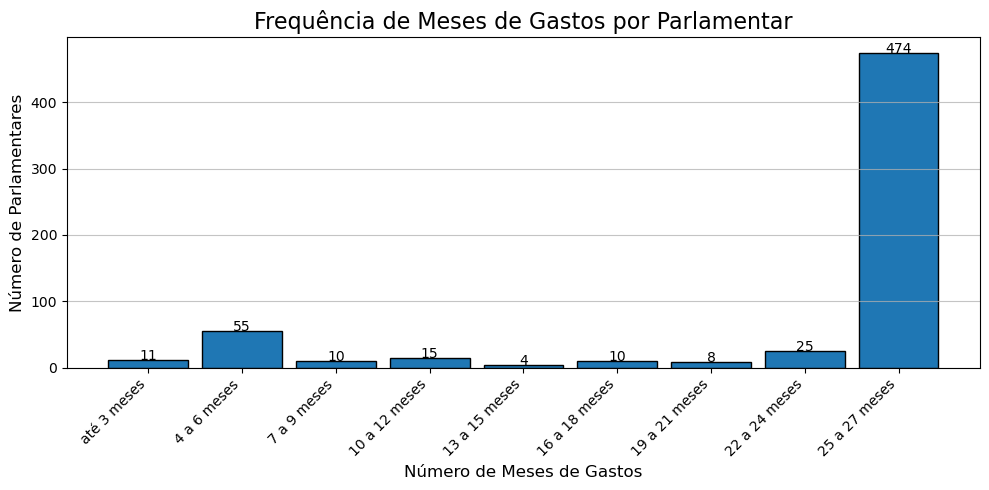

In [104]:
# --- Criação dos bins (faixas) de meses de gastos ---
import matplotlib.pyplot as plt
df_contagem_meses_ordenado = df_contagem_meses.sort_values(
    by='cont_meses_gastos', 
    ascending=False
)
# Definimos os limites dos intervalos
bins = [0, 3, 6, 9, 12, 15, 18, 21, 24, 27]

# Definimos os rótulos para cada barra no histograma
labels = ['até 3 meses', '4 a 6 meses','7 a 9 meses', '10 a 12 meses', '13 a 15 meses', '16 a 18 meses', '19 a 21 meses', '22 a 24 meses', '25 a 27 meses']

# --- Plotando o Histograma ---
plt.figure(figsize=(10, 5))

# A função `hist` plota a distribuição de frequência
n, bins, patches = plt.hist(
    df_contagem_meses_ordenado['cont_meses_gastos'], 
    bins=bins, 
    edgecolor='black', 
    rwidth=0.85
)

# Adicionando rótulos aos eixos e título
plt.title('Frequência de Meses de Gastos por Parlamentar', fontsize=16)
plt.xlabel('Número de Meses de Gastos', fontsize=12)
plt.ylabel('Número de Parlamentares', fontsize=12)

# Adicionando os rótulos personalizados nos ticks do eixo X
plt.xticks(
    [(bins[i] + bins[i+1]) / 2 for i in range(len(bins) - 1)],
    labels,
    rotation=45,
    ha='right'
)

# Adicionando a contagem exata de parlamentares em cima de cada barra
for i in range(len(patches)):
    plt.text(
        patches[i].get_x() + patches[i].get_width()/2,
        patches[i].get_height() + 0.1,
        str(int(n[i])),
        ha='center'
    )

plt.grid(axis='y', alpha=0.75)
plt.tight_layout()
plt.show()

## 2.1 
 <div style="background-color:lightblue; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;">2.1 - Deputados que mais gastaram  e os que menos gastaram </span>
</div>


In [127]:

df_unido = pd.merge(df, 
                    df_contagem_meses[['txNomeParlamentar', 'cont_meses_gastos']], 
                    on='txNomeParlamentar', how='left')

df_unido_2 = df_unido.groupby(
    ['txNomeParlamentar','sgUF', 'sgPartido', 'cat_reeleicao', 'cat_cargo_titusup', 'cont_meses_gastos']
).agg(
    soma_vlrLiquido=('vlrLiquido', 'sum')
).reset_index().sort_values(by='soma_vlrLiquido', ascending=True)


df_unido_2[df_unido_2['soma_vlrLiquido']<=25000]

,txNomeParlamentar,sgUF,sgPartido,cat_reeleicao,cat_cargo_titusup,cont_meses_gastos,soma_vlrLiquido
23,Alexandre Padilha,SP,PT,NA,Titular,1.0,0.03
373,Luiz Marinho,SP,PT,NA,Titular,1.0,0.18
483,Paulo Teixeira,SP,PT,NA,Titular,1.0,0.24
407,Marina Silva,SP,REDE,Nao_reeleito,Titular,1.0,1.13
545,Rosangela Gomes,RJ,REPUBLICANOS,Reeleito,Titular,3.0,1460.57
174,Dr. Gonçalo,MA,PODE,Nao_reeleito,Suplente,4.0,1959.59
263,Guilherme Derrite,SP,PL,Nao_reeleito,Titular,2.0,3031.80
106,Coronel Armando,SC,PP,Nao_reeleito,Suplente,1.0,3897.00
8,Afonso Florence,BA,PT,Reeleito,Titular,4.0,4351.59
339,Leandre,PR,PSD,Reeleito,Titular,3.0,5076.32


In [128]:

df_unido_2['vlr_medio_mensal']  =  df_unido_2['soma_vlrLiquido']/df_unido_2['cont_meses_gastos'] 


In [129]:
"""

DEputados com maior gasto médio menaal

"""
df_unido_2.sort_values(by='vlr_medio_mensal', ascending=False).head(30)

,txNomeParlamentar,sgUF,sgPartido,cat_reeleicao,cat_cargo_titusup,cont_meses_gastos,soma_vlrLiquido,vlr_medio_mensal
454,Osmar Terra,RS,MDB,Reeleito,Titular,4.0,2082360.26,520590.065000
389,Marcelo Queiroz,RJ,PP,Nao_reeleito,Titular,4.0,1875306.56,468826.640000
529,Robinson Faria,RN,PL,Nao_reeleito,Titular,4.0,1763618.10,440904.525000
455,Osmar Terra,RS,MDB,Reeleito,Titular,23.0,2082360.26,90537.402609
390,Marcelo Queiroz,RJ,PP,Nao_reeleito,Titular,23.0,1875306.56,81535.067826
530,Robinson Faria,RN,PL,Nao_reeleito,Titular,23.0,1763618.10,76679.047826
456,Osmar Terra,RS,PL,Reeleito,Titular,4.0,291489.38,72872.345000
391,Marcelo Queiroz,RJ,PSDB,Nao_reeleito,Titular,4.0,255925.22,63981.305000
531,Robinson Faria,RN,PP,Nao_reeleito,Titular,4.0,237042.46,59260.615000
496,Pompeo de Mattos,RS,PDT,Reeleito,Titular,27.0,1508904.65,55885.357407


In [110]:
import plotly.express as px
import plotly.io as pio

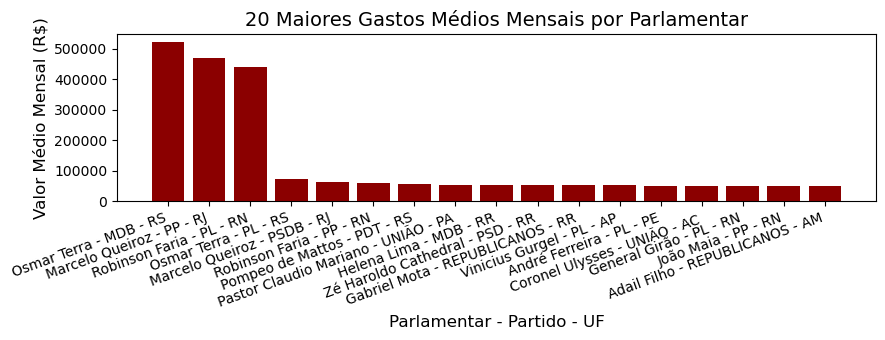

In [118]:
# Passo 1: Criar a coluna combinada para o eixo X
df_unido_2['nome_completo'] = (df_unido_2['txNomeParlamentar'] + ' - ' +
                               df_unido_2['sgPartido'] + ' - ' +
                               df_unido_2['sgUF'])

# Passo 2: Ordenar o DataFrame por 'vlr_medio_mensal' e pegar os 20 maiores
df_top20 = df_unido_2.sort_values(by='vlr_medio_mensal', ascending=False).head(20)

# Passo 3: Criar o gráfico
plt.figure(figsize=(9, 3.5)) # Aumentei o tamanho para melhor visualização

plt.bar(df_top20['nome_completo'], df_top20['vlr_medio_mensal'], color='#8B0000')

# Passo 4: Configurar o gráfico
plt.xlabel("Parlamentar - Partido - UF", fontsize=12)
plt.ylabel("Valor Médio Mensal (R$)", fontsize=12)
plt.title("20 Maiores Gastos Médios Mensais por Parlamentar", fontsize=14)
plt.xticks(rotation=20, ha='right', fontsize=10)
#plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

# Passo 5: Exibir o gráfico
plt.show()

In [ ]:
"""
DEputados com menor gasto médio mensal
"""
df_unido_2.sort_values(by='vlr_medio_mensal', ascending=True).head(30)

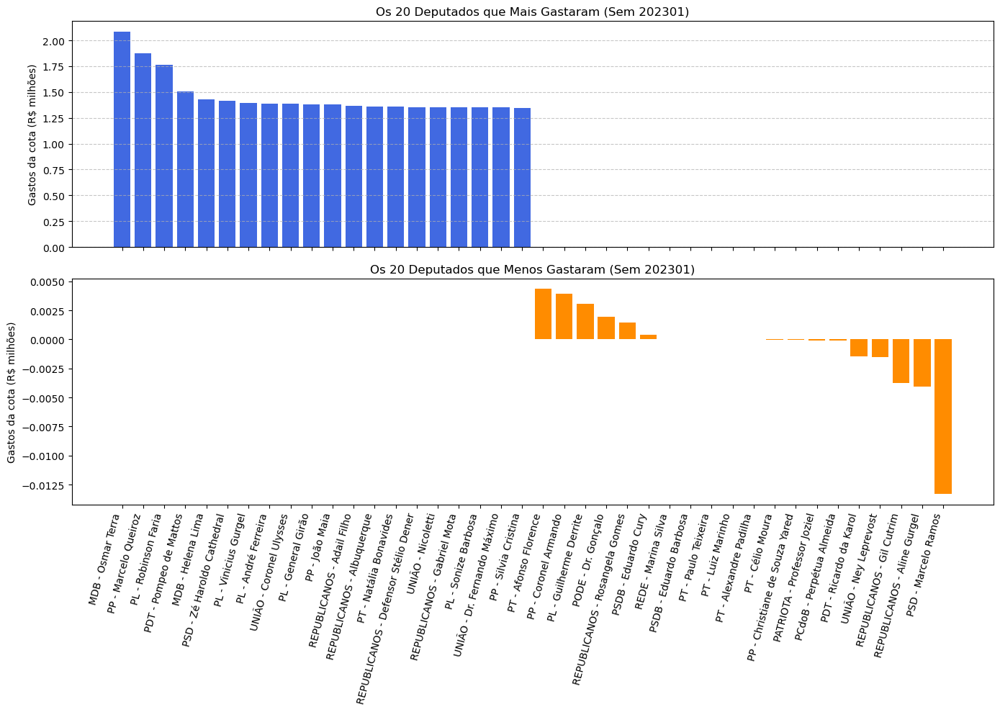

In [119]:
import pandas as pd
import matplotlib.pyplot as plt

# Filtrando os dados para remover o ano-mês 202301
df_filtrado = df[df['numAnoMes_compet'] != 202301]

# Criando a coluna combinada "Partido - Deputado"
df_filtrado['Partido_Deputado'] = df_filtrado['sgPartido'] + " - " + df_filtrado['txNomeParlamentar']

# Agrupando os dados por "Partido - Deputado" e somando os gastos líquidos
df_gastos = df_filtrado.groupby('Partido_Deputado')['vlrLiquido'].sum().reset_index()

# Convertendo valores para milhões de reais
df_gastos['vlrLiquido'] = df_gastos['vlrLiquido'] / 1e6

# Ordenando do maior para o menor gasto
df_gastos = df_gastos.sort_values(by='vlrLiquido', ascending=False)

# Separando os 20 deputados que mais gastaram
df_mais_gastos = df_gastos.head(20)

# Separando os 20 deputados que menos gastaram
df_menos_gastos = df_gastos.tail(20)

# Criando os gráficos
fig, axes = plt.subplots(2, 1, figsize=(14, 10), sharex=True)

# Gráfico dos 20 deputados que mais gastaram
axes[0].bar(df_mais_gastos['Partido_Deputado'], df_mais_gastos['vlrLiquido'], color='royalblue')
axes[0].set_ylabel("Gastos da cota (R$ milhões)")
axes[0].set_title("Os 20 Deputados que Mais Gastaram (Sem 202301)")
axes[0].grid(axis='y', linestyle='--', alpha=0.7)

# Gráfico dos 20 deputados que menos gastaram
axes[1].bar(df_menos_gastos['Partido_Deputado'], df_menos_gastos['vlrLiquido'], color='darkorange')
axes[1].set_ylabel("Gastos da cota (R$ milhões)")
axes[1].set_title("Os 20 Deputados que Menos Gastaram (Sem 202301)")
#axes[1].grid(axis='y', linestyle='--', alpha=0.7)

# Ajustando os rótulos do eixo X
plt.xticks(rotation=75, ha='right')

# Ajustando o layout para melhor visualização
plt.tight_layout()

# Exibindo os gráficos
plt.show()

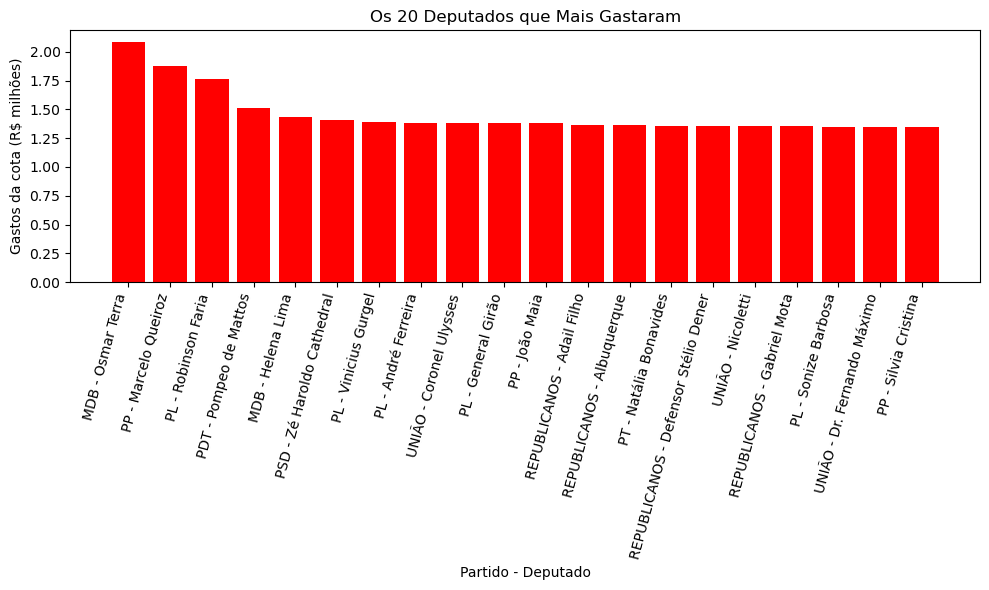

In [121]:
# Filtrando os dados para remover o ano-mês 202301
df_filtrado = df[df['numAnoMes_compet'] != 202301]

# Criando a coluna combinada "Partido - Deputado"
df_filtrado['Partido_Deputado'] = df_filtrado['sgPartido'] + " - " + df_filtrado['txNomeParlamentar']

# Agrupando os dados por "Partido - Deputado" e somando os gastos líquidos
df_gastos = df_filtrado.groupby('Partido_Deputado')['vlrLiquido'].sum().reset_index()

# Convertendo valores para milhões de reais
df_gastos['vlrLiquido'] = df_gastos['vlrLiquido'] / 1e6

# Ordenando do maior para o menor gasto
df_gastos = df_gastos.sort_values(by='vlrLiquido', ascending=False)

# Pegando os 20 deputados que mais gastaram
df_mais_gastos = df_gastos.head(20)

# Criando o gráfico
plt.figure(figsize=(10, 6))
plt.bar(df_mais_gastos['Partido_Deputado'], df_mais_gastos['vlrLiquido'], color='red')

# Configurações do gráfico
plt.xlabel("Partido - Deputado")
plt.ylabel("Gastos da cota (R$ milhões)")
plt.title("Os 20 Deputados que Mais Gastaram")
plt.xticks(rotation=75, ha='right')  # Rotacionando os nomes para melhor leitura
#plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

# Exibindo o gráfico
plt.show()

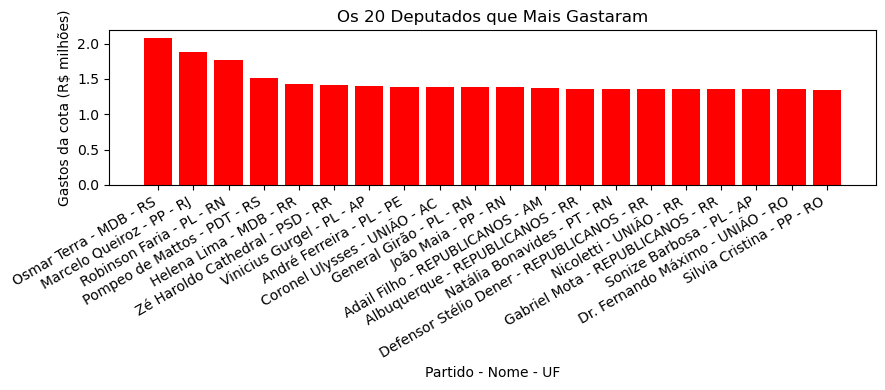

In [126]:
# Criando a coluna combinada "Partido - Nome - UF"
df_filtrado['Partido_Nome_UF'] =  df_filtrado['txNomeParlamentar'] + " - " + df_filtrado['sgPartido'] +  " - " + df_filtrado['sgUF']

# Agrupando os dados por "Partido - Nome - UF" e somando os gastos líquidos
df_gastos = df_filtrado.groupby('Partido_Nome_UF')['vlrLiquido'].sum().reset_index()

# Convertendo valores para milhões de reais
df_gastos['vlrLiquido'] = df_gastos['vlrLiquido'] / 1e6

# Ordenando do maior para o menor gasto e selecionando os 20 mais gastadores
df_gastos = df_gastos.sort_values(by='vlrLiquido', ascending=False).head(20)

# Criando o gráfico de barras
plt.figure(figsize=(9, 4))
plt.bar(df_gastos['Partido_Nome_UF'], df_gastos['vlrLiquido'], color='red')

# Configurações do gráfico
plt.xlabel("Partido - Nome - UF")
plt.ylabel("Gastos da cota (R$ milhões)")
plt.title("Os 20 Deputados que Mais Gastaram")

# Ajustando os rótulos do eixo X para melhor visualização
plt.xticks(rotation=30, ha='right')

# Ajustando espaçamento entre os elementos do gráfico
plt.tight_layout()

# Adicionando linha de grade para melhorar a leitura dos valores
#plt.grid(axis='y', linestyle='--', alpha=0.7)

# Exibindo o gráfico
plt.show()

In [ ]:
# Filtrando os dados para remover o ano-mês 202301
df_filtrado = df[df['numAnoMes_compet'] != 202301]

# Criando a coluna combinada "Partido - Deputado"
df_filtrado['Partido_Deputado'] = df_filtrado['sgPartido'] + " - " + df_filtrado['txNomeParlamentar']

# Agrupando os dados por "Partido - Deputado" e somando os gastos líquidos
df_gastos = df_filtrado.groupby('Partido_Deputado')['vlrLiquido'].sum().reset_index()

# Convertendo valores para milhões de reais
df_gastos['vlrLiquido'] = df_gastos['vlrLiquido'] / 1e3

# Ordenando do maior para o menor gasto
df_gastos = df_gastos.sort_values(by='vlrLiquido', ascending=False)

# Pegando os 20 deputados que menos gastaram
df_menos_gastos = df_gastos.tail(20)

# Criando o gráfico
plt.figure(figsize=(10, 6))
plt.bar(df_menos_gastos['Partido_Deputado'], df_menos_gastos['vlrLiquido'], color='green')

# Configurações do gráfico
plt.xlabel("Partido - Deputado")
plt.ylabel("Gastos da cota (R$ mil)")
plt.title("Os 20 Deputados que Menos Gastaram")
plt.xticks(rotation=75, ha='right')  # Rotacionando os nomes para melhor leitura
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

# Exibindo o gráfico
plt.show()

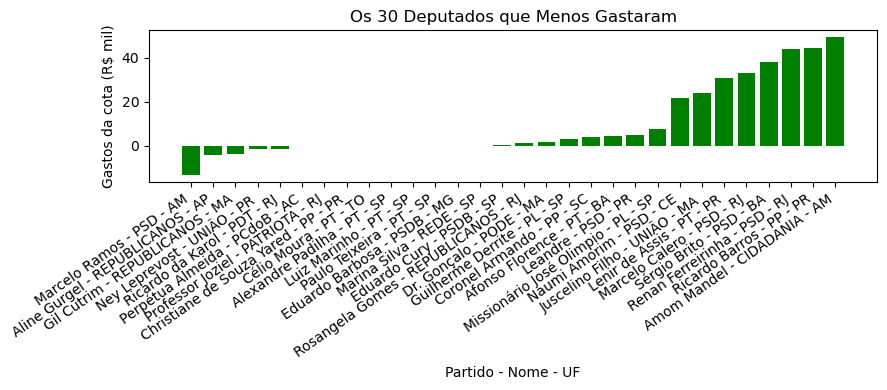

In [134]:

# Criando a coluna combinada "Partido - Nome - UF"
df_filtrado['Partido_Nome_UF'] =  df_filtrado['txNomeParlamentar'] + " - " + df_filtrado['sgPartido'] + " - " + df_filtrado['sgUF']

# Agrupando os dados por "Partido - Nome - UF" e somando os gastos líquidos
df_gastos = df_filtrado.groupby('Partido_Nome_UF')['vlrLiquido'].sum().reset_index()

# Convertendo valores para milhões de reais
df_gastos['vlrLiquido'] = df_gastos['vlrLiquido'] / 1e3

# Ordenando do menor para o maior gasto e selecionando os 20 deputados que menos gastaram
df_menos_gastos = df_gastos.sort_values(by='vlrLiquido', ascending=True).head(30)

# Criando o gráfico de barras
plt.figure(figsize=(9, 4))
plt.bar(df_menos_gastos['Partido_Nome_UF'], df_menos_gastos['vlrLiquido'], color='green')

# Configurações do gráfico
plt.xlabel("Partido - Nome - UF")
plt.ylabel("Gastos da cota (R$ mil)")
plt.title("Os 30 Deputados que Menos Gastaram")

# Ajustando os rótulos do eixo X para melhor visualização
plt.xticks(rotation=35, ha='right')

# Ajustando espaçamento entre os elementos do gráfico
plt.tight_layout()

# Adicionando linha de grade para melhorar a eitura dos valores
#plt.grid(axis='y', linestyle='--', alpha=0.7)

# Exibindo o gráfico
plt.show()

## 2.2
<div style="background-color:lightblue; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;">2.2  Gastos dos deputados ao longo do tempo, desde o início do atual mandato, em fev/2023 até abril/2025  </span>
</div>

In [ ]:
df['numAnoMes_compet']. drop_duplicates().sort_values(ascending=True)

In [177]:
import pandas as pd
import matplotlib.pyplot as plt

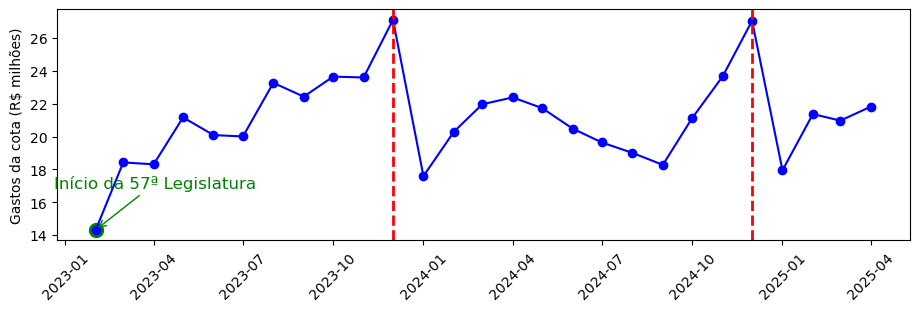

In [179]:
# Agrupando por 'numAnoMes_compet' e somando 'vlrLiquido'
df_agrupado = df.groupby('numAnoMes_compet')['vlrLiquido'].sum().reset_index()

# Convertendo 'numAnoMes_compet' para um formato de data válido (AAAAMM → AAAA-MM-01)
df_agrupado['Data'] = pd.to_datetime(df_agrupado['numAnoMes_compet'].astype(str) + '01', format='%Y%m%d')

# Ordenando pela nova coluna de data
df_agrupado = df_agrupado.sort_values(by='Data')

# Criando o gráfico de linha
plt.figure(figsize=(11, 3))
plt.plot(df_agrupado['Data'], df_agrupado['vlrLiquido'] / 1e6, marker='o', linestyle='-', color='b')

# Adicionando linhas verticais pontilhadas vermelhas nos meses de dezembro de 2023 e dezembro de 2024
plt.axvline(pd.to_datetime("2023-12-01"), color='red', linestyle='dashed', linewidth=2)
plt.axvline(pd.to_datetime("2024-12-01"), color='red', linestyle='dashed', linewidth=2)

# Adicionando um marcador para fevereiro de 2023 (início da 57ª Legislatura)
plt.scatter(pd.to_datetime("2023-02-01"), df_agrupado[df_agrupado['Data'] == pd.to_datetime("2023-02-01")]['vlrLiquido'] / 1e6,
            color='green', s=100)

plt.annotate("Início da 57ª Legislatura", xy=(pd.to_datetime("2023-02-01"), 
            df_agrupado[df_agrupado['Data'] == pd.to_datetime("2023-02-01")]['vlrLiquido'].values[0] / 1e6),
            xytext=(-30, 30), textcoords='offset points',
            arrowprops=dict(arrowstyle="->", color='green'), fontsize=12, color='green')

# Configurações do gráfico
plt.xlabel("")  # Omitindo o nome do eixo X
plt.ylabel("Gastos da cota (R$ milhões)")
plt.xticks(rotation=45)  # Mantendo os labels do eixo X inclinados para melhor leitura
#plt.grid(True, linestyle='--', alpha=0.7)

# Exibindo o gráfico
plt.show()

## 2.3

<div style="background-color:lightblue; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;">2.3 Gastos por UF  </span>
</div>

### Gasto total

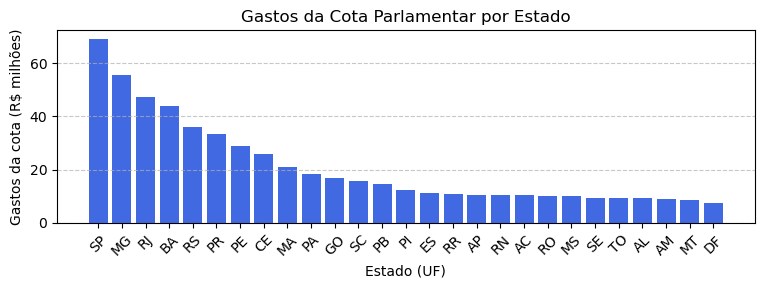

In [136]:
import pandas as pd
import matplotlib.pyplot as plt

# Agrupando os dados por estado (UF) e somando o valor líquido
df_agrupado = df.groupby('sgUF')['vlrLiquido'].sum().reset_index()

# Convertendo para milhões de reais
df_agrupado['vlrLiquido'] = df_agrupado['vlrLiquido'] / 1e6

# Ordenando do maior para o menor valor
df_agrupado = df_agrupado.sort_values(by='vlrLiquido', ascending=False)

# Criando o gráfico de barras
plt.figure(figsize=(9, 2.5))
plt.bar(df_agrupado['sgUF'], df_agrupado['vlrLiquido'], color='royalblue')

# Configurações do gráfico
plt.xlabel("Estado (UF)")
plt.ylabel("Gastos da cota (R$ milhões)")
plt.title("Gastos da Cota Parlamentar por Estado")
plt.xticks(rotation=45)  # Rotacionando os estados para melhor visualização
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Exibindo o gráfico
plt.show()

In [137]:
df_cotas[['sgUF','Numero_Deputados_Gastos']].head()

NameError: name 'df_cotas' is not defined

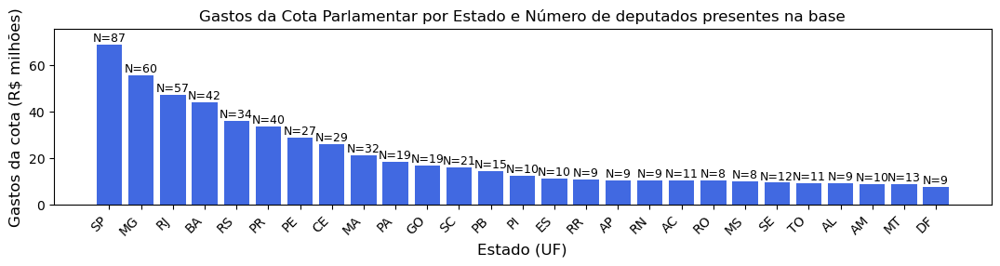

In [182]:

# Agrupando os dados por estado (UF) e somando o valor líquido
df_agrupado = df.groupby('sgUF')['vlrLiquido'].sum().reset_index()

# Convertendo para milhões de reais
df_agrupado['vlrLiquido'] = df_agrupado['vlrLiquido'] / 1e6

# Ordenando do maior para o menor valor
df_agrupado = df_agrupado.sort_values(by='vlrLiquido', ascending=False)

# Mesclando com df_cotas para obter o número de deputados por estado
df_agrupado = df_agrupado.merge(df_cotas[['sgUF', 'Numero_Deputados_Gastos']], on='sgUF', how='left')


# --- AJUSTES CRUCIAIS PARA PLOTAGEM ---

# Passo 1: Aumentar o figsize para um tamanho adequado
plt.figure(figsize=(13, 3))
bars = plt.bar(df_agrupado['sgUF'], df_agrupado['vlrLiquido'], color='royalblue')

# Passo 2: Definir o limite superior do eixo Y
# Pega o valor máximo e adiciona 10% de margem extra para o rótulo caber no topo.
limite_y_max = df_agrupado['vlrLiquido'].max()
plt.ylim(top=limite_y_max * 1.10) 

# Adicionando o número de deputados acima de cada barra
for bar, num_deputados in zip(bars, df_agrupado['Numero_Deputados_Gastos']):
    height = bar.get_height()
    
    # Adicionar um pequeno offset (0.2 é uma boa margem para o eixo em milhões)
    offset = 0.2 
    
    plt.text(bar.get_x() + bar.get_width() / 2, 
             height + offset, # Posição Y com deslocamento
             f"N={str(num_deputados)}",
             ha='center', 
             
             va='bottom', # va='bottom' funciona com o offset
             fontsize=9, 
             color='black') 

# Configurações do gráfico
plt.xlabel("Estado (UF)", fontsize=12)
plt.ylabel("Gastos da cota (R$ milhões)", fontsize=12)
plt.title("Gastos da Cota Parlamentar por Estado e Número de deputados presentes na base", fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=10) 
#plt.grid(axis='y', linestyle='--', alpha=0.7)

# Solução para o erro de layout: garantir espaço para as labels rotacionadas
plt.subplots_adjust(bottom=0.25)

plt.show()

### Média comum

In [ ]:
"""
GASTO MEDIO POR DEPUTADO - MÉDIA SIMPLES
"""
# Agrupando os dados para obter a soma dos gastos por estado (UF)
df_gastos = df.groupby('sgUF')['vlrLiquido'].sum().reset_index()

# Contando o número de deputados por estado
df_deputados = df.groupby('sgUF')['txNomeParlamentar'].nunique().reset_index()

# Juntando os dados de gastos e número de deputados
df_analise = pd.merge(df_gastos, df_deputados, on='sgUF')

# Calculando o gasto médio por deputado em cada estado
df_analise['Gasto_por_Deputado'] = df_analise['vlrLiquido'] / df_analise['txNomeParlamentar']

# Convertendo para milhões de reais
df_analise['Gasto_por_Deputado'] = df_analise['Gasto_por_Deputado'] / 1e6

# Ordenando do maior para o menor gasto médio
df_analise = df_analise.sort_values(by='Gasto_por_Deputado', ascending=False)

# Criando o gráfico de barras
plt.figure(figsize=(12, 6))
plt.bar(df_analise['sgUF'], df_analise['Gasto_por_Deputado'], color='royalblue')

# Configurações do gráfico
plt.xlabel("Estado (UF)")
plt.ylabel("Gasto médio por deputado (R$ milhões)")
plt.title("Gasto Médio por Deputado por Estado")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Exibindo o gráfico
plt.show()

### Media ponderada

In [146]:
"""-----------------------------------------------------------------
GASTO MEDIO POR DEPUTADO - MÉDIA PONDERADA PELO NRO DE MESES QUE DEPUTADO ESTEVE PRESENTE (JA QUE HÁ MUITOS SUPLENTES OU SUBSTITUTOS
-----------------------------------------------------------------"""

# PARTE 1


# 1) Selecionar apenas os itens em que flag_lid = 0
df_nao_lideres = df[df['flag_lid'] == 0].copy()

# 2) Agrupar os dados e calcular as colunas solicitadas
# O agrupamento é feito por Deputado, Partido e UF para obter os totais
df_final_agrup= df_nao_lideres.groupby(['sgUF', 'sgPartido', 'txNomeParlamentar']).agg(
    gasto_total_deputado=('vlrLiquido', 'sum'),
    nro_meses_gastos=('numAnoMes_compet', pd.Series.nunique),
    flag_lid=('flag_lid', 'first')
).reset_index()

# 3) Adicionar a nova coluna e ordenar o DataFrame
# Criar a coluna que é o produto de 'gasto_total_deputado' por 'nro_meses_gastos'
df_final_agrup['multiplicacao_gastos_meses'] = df_final_agrup['gasto_total_deputado'] * df_final_agrup['nro_meses_gastos']

# Ordenar o DataFrame por 'sgUF'
df_final_agrup = df_final_agrup.sort_values(by='sgUF')

# Reordenar as colunas para a visualização final
df_final_agrup = df_final_agrup[[
    'flag_lid', 'sgUF', 'sgPartido', 'txNomeParlamentar', 
    'gasto_total_deputado', 'nro_meses_gastos', 'multiplicacao_gastos_meses'
]]

# 4) Verificar que temos apenas 1 registro por deputado nessa base
print("\n--- Verificação de Registros Únicos ---")
registros_unicos_por_deputado = df_final_agrup['txNomeParlamentar'].value_counts()
print("Número de registros por Deputado:\n", registros_unicos_por_deputado)

# Se todos os valores forem 1, a verificação está correta.
if all(registros_unicos_por_deputado == 1):
    print("\nA verificação confirma que há exatamente um registro por deputado.")
else:
    print("\nA verificação mostra que alguns deputados têm mais de um registro.")
print("-" * 50)
df_final_agrup


--- Verificação de Registros Únicos ---
Número de registros por Deputado:
 txNomeParlamentar
Marcelo Queiroz           2
Robinson Faria            2
Osmar Terra               2
Zezinho Barbary           1
Zé Adriano                1
                         ..
Filipe Martins            1
Eli Borges                1
Ricardo Ayres             1
Júlio Oliveira            1
Carlos Henrique Gaguim    1
Name: count, Length: 620, dtype: int64

A verificação mostra que alguns deputados têm mais de um registro.
--------------------------------------------------


,flag_lid,sgUF,sgPartido,txNomeParlamentar,gasto_total_deputado,nro_meses_gastos,multiplicacao_gastos_meses
0,0,AC,PCdoB,Perpétua Almeida,-129.75,1,-129.75
1,0,AC,PP,Gerlen Diniz,1095708.09,23,25201286.07
2,0,AC,PP,Socorro Neri,1219810.52,27,32934884.04
3,0,AC,PP,Zezinho Barbary,1251667.17,27,33795013.59
4,0,AC,PP,Zé Adriano,128632.61,4,514530.44
...,...,...,...,...,...,...,...
614,0,TO,PL,Filipe Martins,1213154.28,27,32755165.56
613,0,TO,PL,Eli Borges,958570.69,24,23005696.56
621,0,TO,REPUBLICANOS,Ricardo Ayres,1178055.47,27,31807497.69
616,0,TO,PP,Júlio Oliveira,136758.01,6,820548.06


In [147]:
#PARTE 2

#opçao 1 de codigo

df_final_agrup['termo_numerador'] = df_final_agrup['gasto_total_deputado'] * df_final_agrup['nro_meses_gastos']

# Agrupar por 'sgUF' e calcular o numerador e o denominador da média ponderada
df_media_ponderada_uf = df_final_agrup.groupby('sgUF').agg(
    soma_numerador=('termo_numerador', 'sum'),
    soma_denominador=('nro_meses_gastos', 'sum')
).reset_index()

# Calcular a média ponderada e armazená-la em uma nova coluna
df_media_ponderada_uf['gasto_med_pond'] = df_media_ponderada_uf['soma_numerador'] / df_media_ponderada_uf['soma_denominador']

# Selecionar e ordenar as colunas finais
df_media_ponderada_uf = df_media_ponderada_uf[['sgUF', 'gasto_med_pond']]

# Visualizar o resultado
df_media_ponderada_uf

,sgUF,gasto_med_pond
0,AC,1.200043e+06
1,AL,1.031628e+06
2,AM,1.007489e+06
3,AP,1.307226e+06
4,BA,1.111323e+06
5,CE,1.067674e+06
6,DF,8.708185e+05
7,ES,1.100561e+06
8,GO,9.491262e+05
9,MA,9.401885e+05


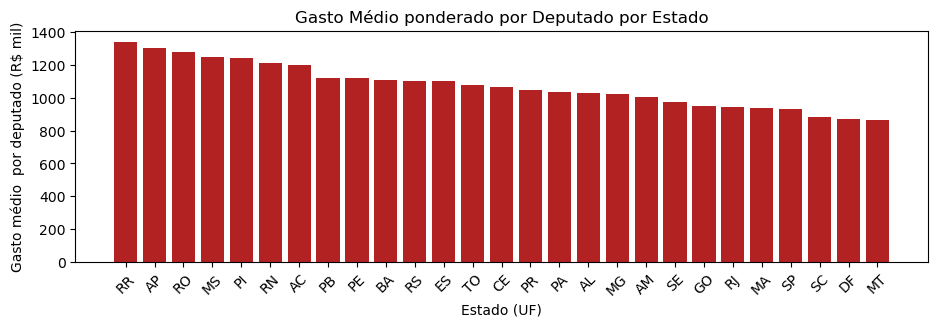

In [149]:
df_media_ponderada_uf['df_media_por_deput_mil_uf'] = df_media_ponderada_uf['gasto_med_pond'] / 1e3
df_media_ponderada_uf = df_media_ponderada_uf.sort_values(by='gasto_med_pond', ascending=False)  ## <<<--------------

# Criando o gráfico de barras
plt.figure(figsize=(11, 3))
plt.bar(df_media_ponderada_uf['sgUF'], df_media_ponderada_uf['df_media_por_deput_mil_uf'], color='firebrick')

# Configurações do gráfico
plt.xlabel("Estado (UF)")
plt.ylabel("Gasto médio  por deputado (R$ mil)")
plt.title("Gasto Médio ponderado por Deputado por Estado")
plt.xticks(rotation=45, ha='center')
#plt.grid(axis='y', linestyle='--', alpha=0.7)

# Exibindo o gráfico
plt.show()

## 2.4
<div style="background-color:lightblue; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;">2.4 Gastos por Partido politico  </span>
</div>

#### preparaao

In [150]:
df[df['flag_lid']==0].head(3)

,txNomeParlamentar,cpf,ideCadastro,nuCarteiraParlamentar,nuLegislatura,sgUF,sgPartido,codLegislatura,numSubCota,txtDescricao,...,datEmissao_AAAAMM,numAnoMes_compet,TipoDocumento,desc_Subcota_Espec,macro_categoria,flag_reeleito,cat_reeleicao,cat_cargo_titusup,genero,flag_lid
832,Danilo Forte,1.213373e+10,62881,91.0,2023,CE,UNIÃO,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,202305,202305,NF,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,Sim,Reeleito,Titular,H,0
833,Danilo Forte,1.213373e+10,62881,91.0,2023,CE,UNIÃO,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,202304,202304,NF,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,Sim,Reeleito,Titular,H,0
834,Danilo Forte,1.213373e+10,62881,91.0,2023,CE,UNIÃO,57,1,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,...,202309,202309,Recibo_outros,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,Sim,Reeleito,Titular,H,0


In [161]:
df_filtrado = df[df['flag_lid'] == 0]

# 2. Agrupa por 'sgPartido' e usa .nunique() em 'txNomeParlamentar' para contar os únicos
df_contagem_parlamentares_unicos = df_filtrado.groupby('sgPartido')['txNomeParlamentar'].nunique().reset_index()

# 3. Renomeia a coluna de contagem para maior clareza
df_contagem_parlamentares_unicos.rename(columns={'txNomeParlamentar': 'Qtde_Parlamentares_Unicos'}, inplace=True)

# Exibe o resultado
print(contagem_parlamentares_unicos)

NameError: name 'contagem_parlamentares_unicos' is not defined

### totais

In [ ]:
# Gastos totais por partido 

# Filtrando os dados para remover o ano-mês 202301
df_filtrado = df[df['numAnoMes_compet'] != 202301]

# Agrupando os dados para obter a soma dos gastos por partido
df_gastos = df_filtrado.groupby('sgPartido')['vlrLiquido'].sum().reset_index()

# Convertendo para milhões de reais
df_gastos['vlrLiquido'] = df_gastos['vlrLiquido'] / 1e6

# Ordenando do maior para o menor gasto líquido
df_gastos = df_gastos.sort_values(by='vlrLiquido', ascending=False)

# Criando o gráfico de barras
plt.figure(figsize=(9, 2.5))
plt.bar(df_gastos['sgPartido'], df_gastos['vlrLiquido'], color='royalblue')

# Configurações do gráfico
plt.xlabel("Partido Político")
plt.ylabel("Gastos da cota (R$ milhões)")
plt.title("Gastos da Cota Parlamentar por Partido Político")
plt.xticks(rotation=40, ha='right')  # Rotacionando os partidos para melhor visualização
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Exibindo o gráfico
plt.show()

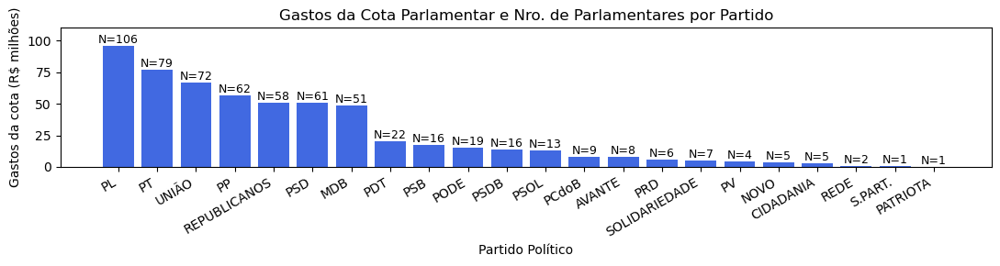

In [165]:
#Agrupando os dados para obter a soma dos gastos por partido
df_gastos = df_filtrado.groupby('sgPartido')['vlrLiquido'].sum().reset_index()

# Convertendo para milhões de reais
df_gastos['vlrLiquido'] = df_gastos['vlrLiquido'] / 1e6

# Ordenando do maior para o menor gasto líquido
df_gastos = df_gastos.sort_values(by='vlrLiquido', ascending=False)

# --- 2. UNIÃO DOS DADOS PARA INCLUIR A CONTAGEM ---

# A chave comum é 'sgPartido'
df_combinado = pd.merge(
    df_gastos,
    df_contagem_parlamentares_unicos,
    on='sgPartido',
    how='left' # Usamos left join para manter todos os partidos que já estão em df_gastos
)

# A coluna de interesse para o texto é 'Qtde_Parlamentares_Unicos'

# --- 3. CRIAÇÃO E CONFIGURAÇÃO DO GRÁFICO ---

plt.figure(figsize=(11, 3)) # Aumentando ligeiramente o tamanho para melhor visualização
bars = plt.bar(df_combinado['sgPartido'], df_combinado['vlrLiquido'], color='royalblue')

# ADICIONANDO O TEXTO DE CONTAGEM DE PARLAMENTARES
for i, bar in enumerate(bars):
    # Obtém a altura da barra (valor do gasto)
    height = bar.get_height()
    # Obtém o valor da contagem de parlamentares para essa barra
    contagem = df_combinado['Qtde_Parlamentares_Unicos'].iloc[i]

    # Adiciona a contagem de parlamentares em cima da barra
    plt.text(
        bar.get_x() + bar.get_width() / 2., # Posição X centralizada
        height, # Posição Y no topo da barra
        f"N={contagem}", # O texto formatado
        ha='center', # Alinhamento horizontal centralizado
        va='bottom', # Alinhamento vertical na parte inferior do texto
        fontsize=9,
        #fontweight='bold',
        color='black'
    )

# Configurações do gráfico
plt.xlabel("Partido Político")
# Ajustando o limite do eixo Y para dar "folga" ao novo texto (adiciona 15% acima da barra mais alta)
plt.ylim(top=df_combinado['vlrLiquido'].max() * 1.15)
plt.ylabel("Gastos da cota (R$ milhões)")
plt.title("Gastos da Cota Parlamentar e Nro. de Parlamentares por Partido")
plt.xticks(rotation=30, ha='right')
#plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

### Media simples

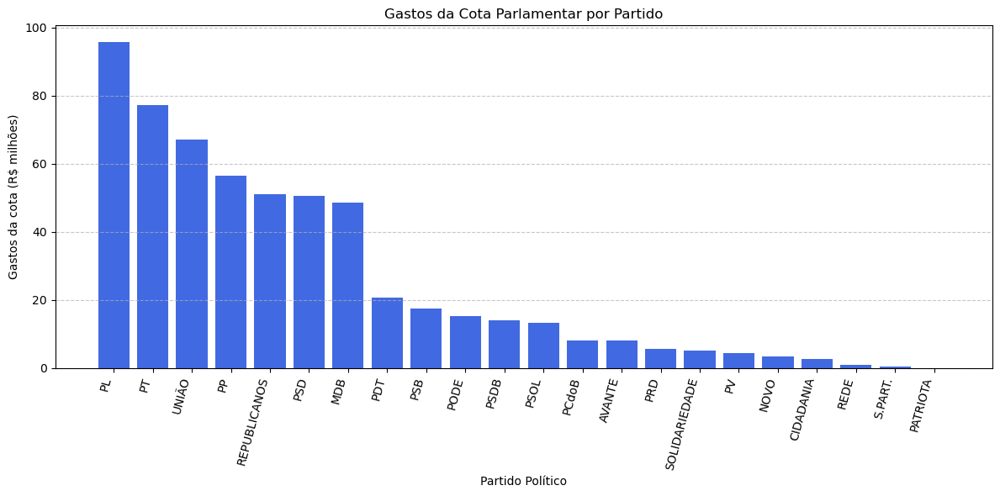

In [152]:
"""
Média simplificada
""" 

# Filtrando os dados para remover o ano-mês 202301
df_filtrado = df[df['numAnoMes_compet'] != 202301]

# Agrupando os dados para obter a soma dos gastos por partido
df_gastos = df_filtrado.groupby('sgPartido')['vlrLiquido'].sum().reset_index()

# Convertendo para milhões de reais
df_gastos['vlrLiquido'] = df_gastos['vlrLiquido'] / 1e6

# Ordenando do maior para o menor gasto líquido
df_gastos = df_gastos.sort_values(by='vlrLiquido', ascending=False)

# Criando o gráfico de barras
plt.figure(figsize=(12, 6))  # Aumentando o tamanho do gráfico
bars = plt.bar(df_gastos['sgPartido'], df_gastos['vlrLiquido'], color='royalblue')

# Configurações do gráfico
plt.xlabel("Partido Político")
plt.ylabel("Gastos da cota (R$ milhões)")
plt.title("Gastos da Cota Parlamentar por Partido")

# Ajustando os rótulos do eixo X para evitar sobreposição
plt.xticks(rotation=75, ha='right')  # Rotacionando e alinhando à direita

# Ajustando espaçamento entre os elementos do gráfico
plt.tight_layout()

# Adicionando linha de grade para melhor visualização
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Exibindo o gráfico
plt.show()

In [153]:
df['numAnoMes_compet'].unique()

array([202302, 202306, 202307, 202308, 202309, 202310, 202303, 202304,
       202305, 202311, 202312, 202402, 202403, 202404, 202405, 202406,
       202407, 202408, 202409, 202410, 202411, 202412, 202401, 202502,
       202503, 202504, 202501])

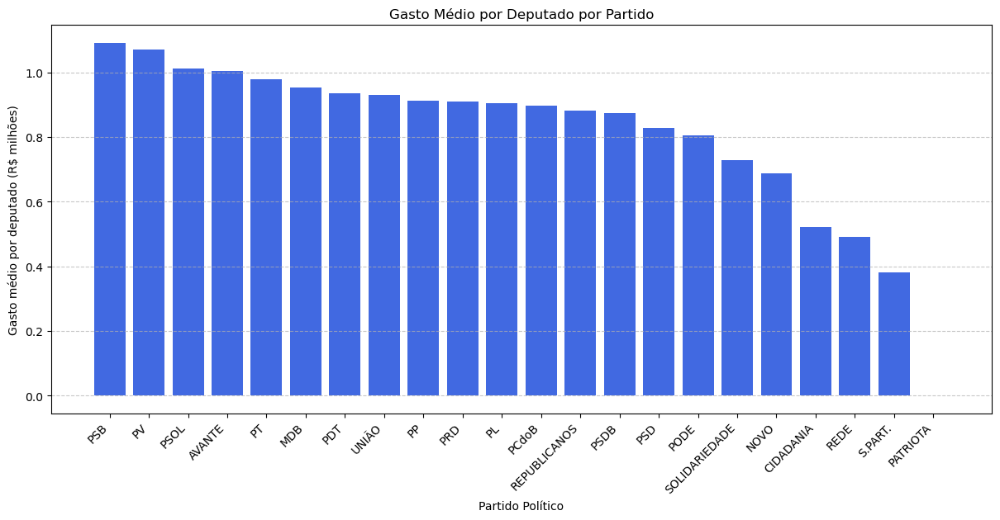

In [154]:

# gastos por deputado
# Filtrando os dados para remover o ano-mês 202301
df_filtrado = df[df['numAnoMes_compet'] != 202301]

# Agrupando os dados para obter a soma dos gastos por partido
df_gastos = df_filtrado.groupby('sgPartido')['vlrLiquido'].sum().reset_index()

# Contando o número de deputados por partido
df_deputados = df_filtrado.groupby('sgPartido')['txNomeParlamentar'].nunique().reset_index()

# Juntando os dados de gastos e número de deputados
df_analise = pd.merge(df_gastos, df_deputados, on='sgPartido')

# Calculando o gasto médio por deputado em cada partido
df_analise['Gasto_por_Deputado'] = df_analise['vlrLiquido'] / df_analise['txNomeParlamentar']

# Convertendo para milhões de reais
df_analise['Gasto_por_Deputado'] = df_analise['Gasto_por_Deputado'] / 1e6

# Ordenando do maior para o menor gasto médio
df_analise = df_analise.sort_values(by='Gasto_por_Deputado', ascending=False)

# Criando o gráfico de barras
plt.figure(figsize=(12, 6))
plt.bar(df_analise['sgPartido'], df_analise['Gasto_por_Deputado'], color='royalblue')
plt.xticks(rotation=45, ha='right')  # Rotaciona os labels e alinha à direita
plt.tight_layout()  # Ajusta o layout automaticamente para evitar sobreposição
# Configurações do gráfico
plt.xlabel("Partido Político")
plt.ylabel("Gasto médio por deputado (R$ milhões)")
plt.title("Gasto Médio por Deputado por Partido")
plt.xticks(rotation=45)  # Rotacionando os partidos para melhor visualização
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Exibindo o gráfico
plt.show()

### Media ponderada

In [155]:
"""
Média ponderada 

"""

'\nMédia ponderada \n\n'

In [156]:
df_final_agrup

,flag_lid,sgUF,sgPartido,txNomeParlamentar,gasto_total_deputado,nro_meses_gastos,multiplicacao_gastos_meses,termo_numerador
0,0,AC,PCdoB,Perpétua Almeida,-129.75,1,-129.75,-129.75
1,0,AC,PP,Gerlen Diniz,1095708.09,23,25201286.07,25201286.07
2,0,AC,PP,Socorro Neri,1219810.52,27,32934884.04,32934884.04
3,0,AC,PP,Zezinho Barbary,1251667.17,27,33795013.59,33795013.59
4,0,AC,PP,Zé Adriano,128632.61,4,514530.44,514530.44
...,...,...,...,...,...,...,...,...
614,0,TO,PL,Filipe Martins,1213154.28,27,32755165.56,32755165.56
613,0,TO,PL,Eli Borges,958570.69,24,23005696.56,23005696.56
621,0,TO,REPUBLICANOS,Ricardo Ayres,1178055.47,27,31807497.69,31807497.69
616,0,TO,PP,Júlio Oliveira,136758.01,6,820548.06,820548.06


In [157]:

# Agrupar por 'sgPartido' e calcular o numerador e o denominador da média ponderada
df_media_ponderada_partido = df_final_agrup.groupby('sgPartido').agg(
    soma_numerador=('termo_numerador', 'sum'),
    soma_denominador=('nro_meses_gastos', 'sum')
).reset_index()

# Calcular a média ponderada e armazená-la em uma nova coluna
df_media_ponderada_partido['gasto_med_pond_part'] = df_media_ponderada_partido['soma_numerador'] / df_media_ponderada_partido['soma_denominador']

# Selecionar as colunas finais
df_media_ponderada_partido = df_media_ponderada_partido[['sgPartido', 'gasto_med_pond_part']]

# Visualizar o resultado
df_media_ponderada_partido

,sgPartido,gasto_med_pond_part
0,AVANTE,1.002882e+06
1,CIDADANIA,5.947531e+05
2,MDB,1.050378e+06
3,NOVO,6.862987e+05
4,PATRIOTA,-1.095600e+02
5,PCdoB,1.117876e+06
6,PDT,1.064896e+06
7,PL,1.011126e+06
8,PODE,9.734616e+05
9,PP,1.070329e+06


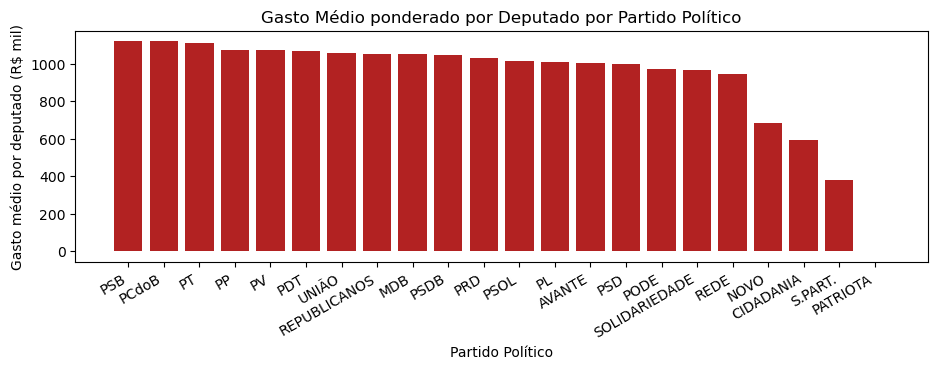

In [160]:
df_media_ponderada_partido['media_por_deput_mil_part'] = df_media_ponderada_partido['gasto_med_pond_part'] / 1e3
df_media_ponderada_partido= df_media_ponderada_partido.sort_values(by='gasto_med_pond_part', ascending=False)  ## <<<--------------

# Criando o gráfico de barras
plt.figure(figsize=(11, 3))
plt.bar(df_media_ponderada_partido['sgPartido'],
        df_media_ponderada_partido['media_por_deput_mil_part'], color='firebrick')

# Configurações do gráfico
plt.xlabel("Partido Político")
plt.ylabel("Gasto médio por deputado (R$ mil)")
plt.title("Gasto Médio ponderado por Deputado por Partido Político")
plt.xticks(rotation=30, ha='right')
#plt.grid(axis='y', linestyle='--', alpha=0.7)

# Exibindo o gráfico
plt.show()

In [ ]:
df.groupby(['sgPartido', 'numAnoMes_compet'])['txNomeParlamentar'].nunique().reset_index()

## 2.5
<div style="background-color:lightblue; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;">2.5 Gastos por Categoria </span>
</div>


#### Tabelas preliminares

In [166]:
soma_por_macrocategoria = df.groupby('macro_categoria')['vlrLiquido'].sum().reset_index()
soma_por_macrocategoria.rename(columns={'vlrLiquido': 'soma_vlrLiquido'}, inplace=True)
soma_por_macrocategoria['soma_vlrLiquido_milhoes'] = soma_por_macrocategoria['soma_vlrLiquido'] / 1_000_000
soma_por_macrocategoria.sort_values(    by='soma_vlrLiquido_milhoes',     ascending=False)

,macro_categoria,soma_vlrLiquido,soma_vlrLiquido_milhoes
3,DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR,2.238836e+08,223.883594
9,PASSAGEM AÉREA,9.985356e+07,99.853564
6,LOCAÇÃO OU FRETAMENTO,9.883665e+07,98.836649
7,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,7.226688e+07,72.266883
2,COMBUSTÍVEIS E LUBRIFICANTES,4.918110e+07,49.181101
5,"HOSPEDAGEM ,EXCETO DO PARLAMENTAR NO DISTRITO ...",7.368239e+06,7.368239
14,TELEFONIA,6.787227e+06,6.787227
11,SERVIÇO DE SEGURANÇA PRESTADO POR EMPRESA ESPE...,3.454570e+06,3.454570
4,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,3.101096e+06,3.101096
12,"SERVIÇO DE TÁXI, PEDÁGIO E ESTACIONAMENTO",2.464537e+06,2.464537


In [167]:
soma_por_categoria = df.groupby('desc_Subcota_Espec')['vlrLiquido'].sum().reset_index()
soma_por_categoria.rename(columns={'vlrLiquido': 'soma_vlrLiquido'}, inplace=True)
soma_por_categoria['soma_vlrLiquido_milhoes'] = soma_por_categoria['soma_vlrLiquido'] / 1_000_000
soma_por_categoria.sort_values(    by='soma_vlrLiquido_milhoes',     ascending=False)

,desc_Subcota_Espec,soma_vlrLiquido,soma_vlrLiquido_milhoes
6,DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR,2.238836e+08,223.883594
16,PASSAGEM AÉREA - SIGEPA,9.423599e+07,94.235994
11,LOCAÇÃO OU FRETAMENTO DE VEÍCULOS AUTOMOTORES,9.360796e+07,93.607965
12,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,7.226688e+07,72.266883
5,COMBUSTÍVEIS E LUBRIFICANTES - Veículos Automo...,4.721854e+07,47.218536
8,"HOSPEDAGEM ,EXCETO DO PARLAMENTAR NO DISTRITO ...",7.368239e+06,7.368239
21,TELEFONIA,6.787227e+06,6.787227
9,LOCAÇÃO OU FRETAMENTO DE AERONAVES,4.667076e+06,4.667076
18,SERVIÇO DE SEGURANÇA PRESTADO POR EMPRESA ESPE...,3.454570e+06,3.454570
7,FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR,3.101096e+06,3.101096


#### desc_Subcota_Espec

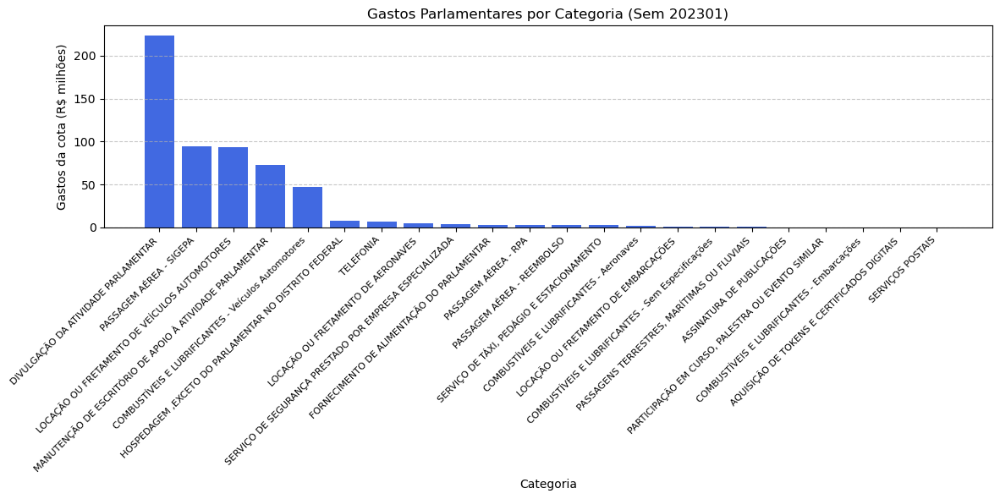

In [168]:

# Filtrando os dados para remover o ano-mês 202301
df_filtrado = df[df['numAnoMes_compet'] != 202301]

# Agrupando os dados para obter a soma dos gastos por categoria
df_gastos = df_filtrado.groupby('desc_Subcota_Espec')['vlrLiquido'].sum().reset_index()

# Convertendo para milhões de reais
df_gastos['vlrLiquido'] = df_gastos['vlrLiquido'] / 1e6

# Ordenando do maior para o menor gasto
df_gastos = df_gastos.sort_values(by='vlrLiquido', ascending=False)

# Criando o gráfico de barras
plt.figure(figsize=(12, 6))
plt.bar(df_gastos['desc_Subcota_Espec'], df_gastos['vlrLiquido'], color='royalblue')

# Configurações do gráfico
plt.xlabel("Categoria")
plt.ylabel("Gastos da cota (R$ milhões)")
plt.title("Gastos Parlamentares por Categoria (Sem 202301)")
plt.xticks(rotation=45, ha='right',fontsize=8)  # Rotacionando os labels para melhor visualização
plt.tight_layout()  # Ajustando o layout para evitar sobreposição
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Exibindo o gráfico
plt.show()

#### Macro categoria

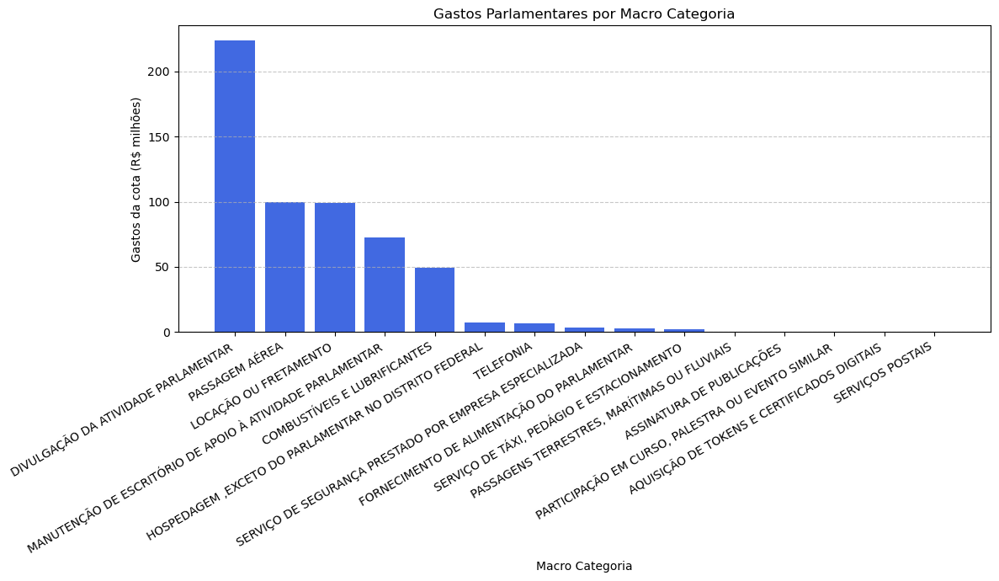

In [169]:
# Filtrando os dados para remover o ano-mês 202301
df_filtrado = df[df['numAnoMes_compet'] != 202301]

# Agrupando os dados para obter a soma dos gastos por macro categoria
df_gastos = df_filtrado.groupby('macro_categoria')['vlrLiquido'].sum().reset_index()

# Convertendo para milhões de reais
df_gastos['vlrLiquido'] = df_gastos['vlrLiquido'] / 1e6

# Ordenando do maior para o menor gasto
df_gastos = df_gastos.sort_values(by='vlrLiquido', ascending=False)

# Criando o gráfico de barras
plt.figure(figsize=(12, 7))
plt.bar(df_gastos['macro_categoria'], df_gastos['vlrLiquido'], color='royalblue')

# Configurações do gráfico
plt.xlabel("Macro Categoria")
plt.ylabel("Gastos da cota (R$ milhões)")
plt.title("Gastos Parlamentares por Macro Categoria")
plt.xticks(rotation=30, ha='right',fontsize=10)  # Rotacionando os labels para melhor visualização
plt.tight_layout()  # Ajustando o layout para evitar sobreposição
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Exibindo o gráfico
plt.show()

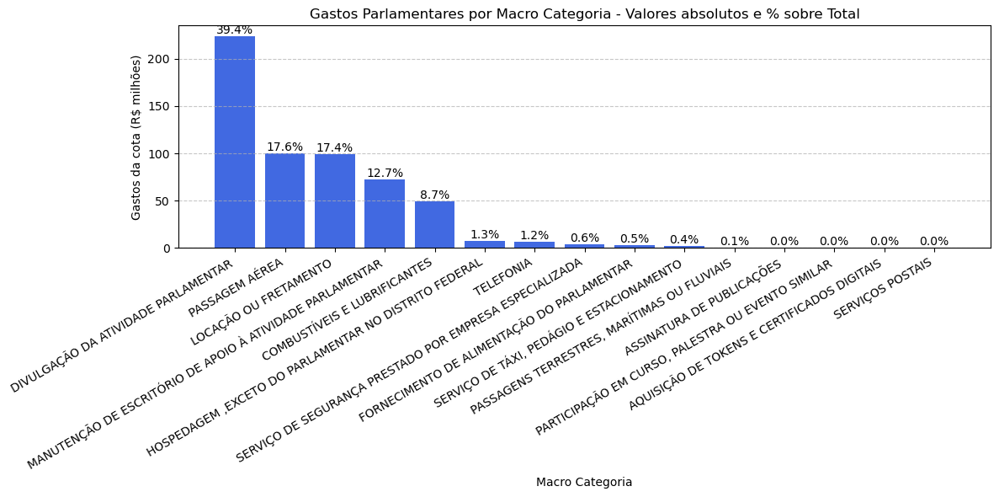

In [170]:
import pandas as pd
import matplotlib.pyplot as plt

# Filtrando os dados para remover o ano-mês 202301
df_filtrado = df[df['numAnoMes_compet'] != 202301]

# Agrupando os dados para obter a soma dos gastos por macro categoria
df_gastos = df_filtrado.groupby('macro_categoria')['vlrLiquido'].sum().reset_index()

# Convertendo para milhões de reais
df_gastos['vlrLiquido'] = df_gastos['vlrLiquido'] / 1e6

# Calculando a porcentagem de cada categoria em relação ao total
df_gastos['Porcentagem'] = (df_gastos['vlrLiquido'] / df_gastos['vlrLiquido'].sum()) * 100

# Ordenando do maior para o menor gasto
df_gastos = df_gastos.sort_values(by='vlrLiquido', ascending=False)

# Criando o gráfico de barras
plt.figure(figsize=(12, 6))
bars = plt.bar(df_gastos['macro_categoria'], df_gastos['vlrLiquido'], color='royalblue')

#------------------------------------------
# Cria a lista de rótulos formatados em 2 linhas
#labels_wrapped = df_gastos['macro_categoria'].str.wrap(width=50)

# Adicionando os valores de porcentagem em cada barra
for bar, pct in zip(bars, df_gastos['Porcentagem']):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height(), f"{pct:.1f}%", 
             ha='center', va='bottom', fontsize=10, color="black")

# Configurações do gráfico
plt.xlabel("Macro Categoria")
plt.ylabel("Gastos da cota (R$ milhões)")
plt.title("Gastos Parlamentares por Macro Categoria - Valores absolutos e % sobre Total")

plt.xticks(rotation=30, ha='right', fontsize=10)  # Melhorando a visualização dos labels
#plt.xticks(ticks=df_gastos['macro_categoria'], labels=labels_wrapped, rotation=60, ha='center')
# O parâmetro 'ticks' recebe os valores originais para as posições
# O parâmetro 'labels' recebe os novos textos com a quebra de linha

plt.tight_layout()  # Ajustando para evitar sobreposição
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Exibindo o gráfico
plt.show()

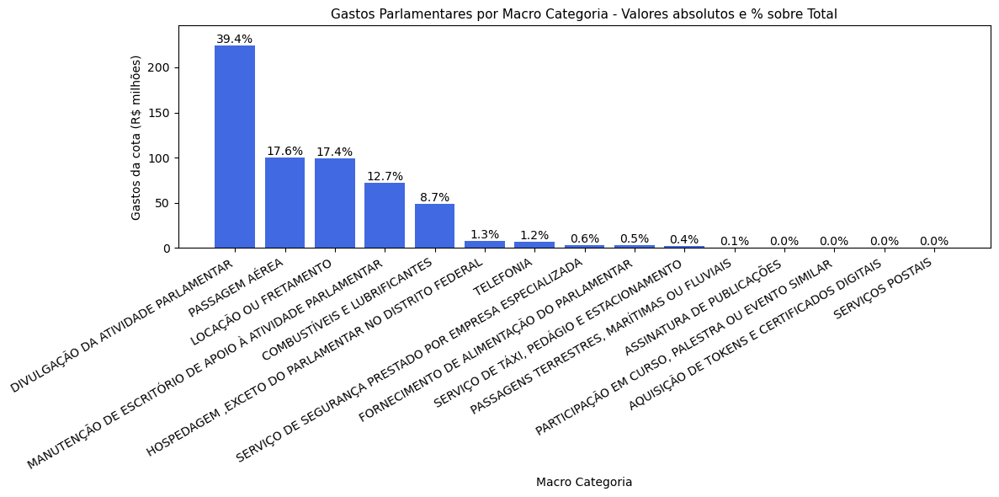

In [176]:
# Filtrando os dados para remover o ano-mês 202301
df_filtrado = df[df['numAnoMes_compet'] != '202301'] # Garantindo que o valor seja tratado como string/objeto

# Agrupando os dados para obter a soma dos gastos por macro categoria
df_gastos = df_filtrado.groupby('macro_categoria')['vlrLiquido'].sum().reset_index()

# Convertendo para milhões de reais
df_gastos['vlrLiquido'] = df_gastos['vlrLiquido'] / 1e6

# Calculando a porcentagem de cada categoria em relação ao total
df_gastos['Porcentagem'] = (df_gastos['vlrLiquido'] / df_gastos['vlrLiquido'].sum()) * 100

# Ordenando do maior para o menor gasto
df_gastos = df_gastos.sort_values(by='vlrLiquido', ascending=False)

# --- CRIAÇÃO E CONFIGURAÇÃO DO GRÁFICO ---
plt.figure(figsize=(12, 6))
bars = plt.bar(df_gastos['macro_categoria'], df_gastos['vlrLiquido'], color='royalblue')

# 1. Adicionando os valores de porcentagem em cada barra
for bar, pct in zip(bars, df_gastos['Porcentagem']):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height(), f"{pct:.1f}%",
             ha='center', va='bottom', fontsize=10, color="black")

# 2. Configurações da fonte do gráfico e dos eixos
plt.xlabel("Macro Categoria", fontsize=10)

# MUDANDO A FONTE DO RÓTULO DO EIXO Y
plt.ylabel("Gastos da cota (R$ milhões)", fontsize=10) # fontweight='bold'

plt.title("Gastos Parlamentares por Macro Categoria - Valores absolutos e % sobre Total", fontsize=11)

# Melhorando a visualização dos labels do eixo X
plt.xticks(rotation=30, ha='right', fontsize=10)
#plt.grid(axis='y', linestyle='--', alpha=0.7)


# 3. AJUSTANDO O LIMITE DO EIXO Y (A "FOLGUINHA")
# Calcula o valor máximo das barras
max_height = df_gastos['vlrLiquido'].max()
# Adiciona 10% de margem no topo para a folguinha
plt.ylim(top=max_height * 1.10) # 1.10 significa 10% a mais no limite superior


plt.tight_layout()
plt.show()

In [172]:
!pip install textwrap

ERROR: Could not find a version that satisfies the requirement textwrap (from versions: none)
ERROR: No matching distribution found for textwrap


#### Macro categorias ao  longo do tempo

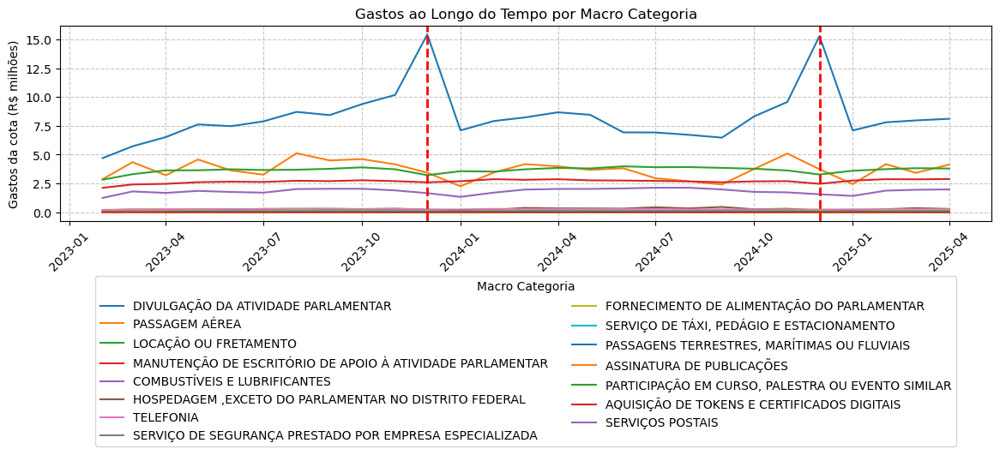

In [173]:


# Filtrando os dados para remover o ano-mês 202301
df_filtrado = df[df['numAnoMes_compet'] != 202301]

# Agrupando os dados por tempo (numAnoMes_compet) e Macro Categoria (macro_categoria)
df_agrupado = df_filtrado.groupby(['numAnoMes_compet', 'macro_categoria'])['vlrLiquido'].sum().reset_index()

# Convertendo numAnoMes_compet para um formato de data válido (AAAAMM → AAAA-MM-01)
df_agrupado['Data'] = pd.to_datetime(df_agrupado['numAnoMes_compet'].astype(str) + '01', format='%Y%m%d')

# Convertendo os valores para milhões de reais
df_agrupado['vlrLiquido'] = df_agrupado['vlrLiquido'] / 1e6

# Ordenando categorias pela soma total dos gastos
categorias_ordenadas = df_agrupado.groupby('macro_categoria')['vlrLiquido'].sum().sort_values(ascending=False).index

# Criando o gráfico
plt.figure(figsize=(12, 6))

# Plotando uma linha para cada macro categoria, na ordem decrescente de gasto
for categoria in categorias_ordenadas:
    dados_categoria = df_agrupado[df_agrupado['macro_categoria'] == categoria]
    plt.plot(dados_categoria['Data'], dados_categoria['vlrLiquido'], label=categoria)

# Adicionando linhas verticais pontilhadas nos meses de dezembro de 2023 e dezembro de 2024
plt.axvline(pd.to_datetime("2023-12-01"), color='red', linestyle='dashed', linewidth=2)
plt.axvline(pd.to_datetime("2024-12-01"), color='red', linestyle='dashed', linewidth=2)

# Configurações do gráfico
plt.xlabel("")  # Omitindo o nome do eixo X
plt.ylabel("Gastos da cota (R$ milhões)")
plt.title("Gastos ao Longo do Tempo por Macro Categoria")
plt.xticks(rotation=45)  # Melhorando a legibilidade das datas
plt.grid(True, linestyle='--', alpha=0.7)

# Configurando a legenda abaixo do gráfico e ordenando por relevância

plt.legend(title="Macro Categoria", bbox_to_anchor=(0.5, -0.25), loc='upper center', ncol=2, fontsize=10)
# Ajustando layout
plt.tight_layout()

# Exibindo o gráfico
plt.show()

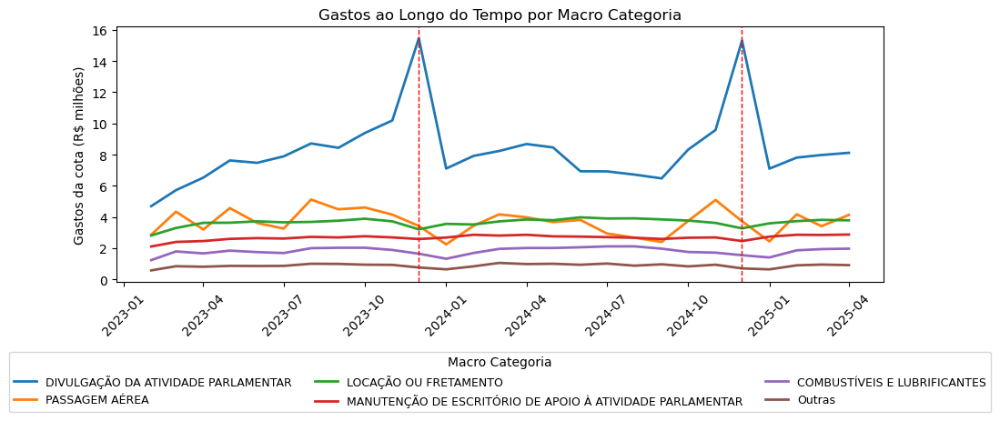

In [175]:
# --- PREPARAÇÃO DOS DADOS ---
# O seu código de preparação dos dados está correto
df_filtrado = df[df['numAnoMes_compet'].astype(str) != '202301'].copy()
gastos_totais_por_categoria = df_filtrado.groupby('macro_categoria')['vlrLiquido'].sum()
gasto_total_geral = gastos_totais_por_categoria.sum()
LIMITE_PCT = 0.05
limite_valor = gasto_total_geral * LIMITE_PCT
categorias_pequenas = gastos_totais_por_categoria[gastos_totais_por_categoria < limite_valor].index.tolist()
df_filtrado['macro_categoria_agrupada'] = np.where(
    df_filtrado['macro_categoria'].isin(categorias_pequenas),
    'Outras',
    df_filtrado['macro_categoria']
)
df_agrupado = df_filtrado.groupby(['numAnoMes_compet', 'macro_categoria_agrupada'])['vlrLiquido'].sum().reset_index()
df_agrupado.rename(columns={'macro_categoria_agrupada': 'macro_categoria'}, inplace=True)
df_agrupado['Data'] = pd.to_datetime(df_agrupado['numAnoMes_compet'].astype(str) + '01', format='%Y%m%d')
df_agrupado['vlrLiquido'] = df_agrupado['vlrLiquido'] / 1e6
categorias_ordenadas = df_agrupado.groupby('macro_categoria')['vlrLiquido'].sum().sort_values(ascending=False).index

# --- CRIAÇÃO DO GRÁFICO ---
# AQUI ESTÁ A CORREÇÃO: AUMENTANDO A LARGURA (O PRIMEIRO VALOR)
plt.figure(figsize=(11, 5))

for categoria in categorias_ordenadas:
    dados_categoria = df_agrupado[df_agrupado['macro_categoria'] == categoria]
    plt.plot(dados_categoria['Data'], dados_categoria['vlrLiquido'], label=categoria, linewidth=2)

# Adicionando linhas verticais pontilhadas
plt.axvline(pd.to_datetime("2023-12-01"), color='red', linestyle='dashed', linewidth=1)
plt.axvline(pd.to_datetime("2024-12-01"), color='red', linestyle='dashed', linewidth=1)

# Configurações do gráfico
plt.xlabel("")
plt.ylabel("Gastos da cota (R$ milhões)")
plt.title("Gastos ao Longo do Tempo por Macro Categoria")
plt.xticks(rotation=45)
#plt.grid(True, linestyle='--', alpha=0.7)

# Configurando a legenda abaixo do gráfico (manter)
plt.legend(title="Macro Categoria", bbox_to_anchor=(0.5, -0.25), loc='upper center', ncol=3, fontsize=9)

# Ajustando layout
plt.tight_layout()

plt.show()

## 2.6
 <div style="background-color:lightblue; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;">2.6 Exploração das categorias </span>
</div>


### 2.6.1 Alimentação

In [ ]:
df['macro_categoria'].unique()

In [ ]:
cols=['txNomeParlamentar',
         'sgUF',
         'sgPartido',
         'flag_reeleito',
         'flag_lid', 
         'numAnoMes_compet',
         'macro_categoria',
         'desc_Subcota_Espec', 
         'txtFornecedor',
          'txtCNPJCPF',
          'vlrLiquido']


In [ ]:
df_alimentacao = df[df['macro_categoria'] == 'FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR'][cols]
df_alimentacao.head()

In [ ]:
# Agrupando e somando os valores de vlrLiquido
df_alimentacao_agrupados = df_alimentacao.groupby([
    'txNomeParlamentar',
    'sgUF',
    'sgPartido',
    'flag_reeleito',
    'flag_lid',
    'numAnoMes_compet'
], as_index=False)['vlrLiquido'].sum()
df_alimentacao_agrupados.rename(columns={'vlrLiquido': 'vlrLiquido_soma'}, inplace=True)
df_alimentacao_agrupados

In [ ]:
# Definindo os limites e rótulos das faixas
bins = [0, 249.99, 499.99, 749.99, 999.99, 1249.99, 1499.99, 1749.99, 1999.99, 2499.99, 2999.00, float('inf')]
labels = [
    "1. Até R$ 250",
    "2. de R$ 250 - 500",
    "3. de R$ 500 -750",
    "4. de R$ 750 - 1000",
    "5. de R$ 1000 - 1250",
    "6. de R$ 1250 - 1500",
    "7. de R$ 1500 - 1750",
    "8. de R$ 1750 - 2000",
    "9. de R$ 2000 - 2500",
    "10. de R$ 2500 - 3000",
    "11. Acima de R$3000"
]

# Criando a coluna de faixa
df_alimentacao_agrupados['vlrLiquido_soma_faixa'] = pd.cut(
    df_alimentacao_agrupados['vlrLiquido_soma'],
    bins=bins,
    labels=labels,
    include_lowest=True
)

In [ ]:
df_alimentacao_agrupados['vlrLiquido_soma_faixa'] = pd.cut(
    df_alimentacao_agrupados['vlrLiquido_soma'],
    bins=bins,
    labels=labels,
    include_lowest=True
)

In [ ]:
# Frequência absoluta
frequencias = df_alimentacao_agrupados['vlrLiquido_soma_faixa'].value_counts().sort_index()

# Frequência relativa (em %)
frequencias_percentual = (frequencias / frequencias.sum()) * 100

# Plotando o gráfico
plt.figure(figsize=(10, 6))
bars = plt.bar(frequencias.index, frequencias.values, color='cornflowerblue', edgecolor='black')

plt.title('Frequência de Gastos por Faixa de vlrLiquido_soma')
plt.xlabel('Faixa de Gastos')
plt.ylabel('Número de Ocorrências')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

# Adicionando porcentagens no topo de cada barra
for bar, pct in zip(bars, frequencias_percentual):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 0.5, f'{pct:.1f}%', ha='center', va='bottom', fontsize=9)


In [ ]:
# Média dos valores mensais
media_vlrLiquido = df_alimentacao_agrupados['vlrLiquido_soma'].mean()
print(f"Média de vlrLiquido_soma: R$ {media_vlrLiquido:,.2f}")

In [ ]:
#Média por parlamentar 
df_alimentacao_media = df_alimentacao_agrupados.groupby([
    'txNomeParlamentar',
    'sgUF',
    'sgPartido',
    'flag_reeleito',
    'flag_lid'
], as_index=False)['vlrLiquido_soma'].mean()

df_alimentacao_media=df_alimentacao_media.rename(columns={'vlrLiquido': 'vlrLiquido_media_mensal'}, inplace=True)
df_alimentacao_media.sort_values(by='vlrLiquido_media_mensal', ascending=False)



### 2.6.2 divulgaçao de atividade parlamentar

In [ ]:
df['macro_categoria'].unique()

In [ ]:
df[df['txtDescricao'] == 'DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR']['vlrLiquido'].min()

In [ ]:
df[df['txtDescricao'] == 'DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR']['vlrLiquido'].max()

In [ ]:
gastos_filtrados_atividade = df[df['txtDescricao'] == 'DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR']

# Criar o histograma
plt.figure(figsize=(10, 6)) # Define o tamanho da figura para melhor visualização
plt.hist(gastos_filtrados_atividade['vlrLiquido'], bins=40, edgecolor='black', alpha=0.7)

# Adicionar títulos e rótulos
plt.title('Distribuição de Registros de Gastos com Divulgação da Atividade Parlamentar')
plt.xlabel('Valor do Gasto (R$)')
plt.ylabel('Frequência (Número de Ocorrências)')
plt.grid(axis='y', linestyle='--', alpha=0.6) # Adiciona uma grade horizontal

# Exibir o histograma
plt.show()

In [ ]:
"""

df_filtrado = df[df['macro_categoria'] == 'DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR']
colunas_selecionadas = [
    'txNomeParlamentar', 'sgPartido', 'sgUF', 'vlrLiquido', 'numAnoMes_compet', 'macro_categoria'
]
df_final = df_filtrado[colunas_selecionadas].copy()

# --- Adaptando o código para incluir as novas faixas ---

# 2) Criar a coluna 'vlrLiquid_faixa' com as novas faixas
# Define os novos limites das faixas e os rótulos
bins = [0, 5000, 10000, 20000, 30000, 40000, float('inf')]
labels = ['0 a 5000', '5001 a 10000', '10001 a 20000', '20001 a 30000', '30001 a 40000', 'Mais de 40000']

# Usa pd.cut para criar as faixas de valor
df_final['vlrLiquid_faixa'] = pd.cut(df_final['vlrLiquido'], bins=bins, labels=labels, right=True)
df_final
""""

In [ ]:
df.head()

In [ ]:
numAnoMes_compet

In [ ]:
df_divulgacao = df[df['txtDescricao'] == 'DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR'].copy()

df_resumo_fornec_divulgacao = df_divulgacao.groupby(['txtFornecedor', 'txtCNPJCPF']).agg(
    total_gasto=('vlrLiquido', 'sum'),
    numero_eventos=('txtFornecedor', 'size')
).reset_index()

df_resumo_fornec_divulgacao.sort_values(by='total_gasto', ascending=False)


<div style="background-color:lightblue; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;">2.8  - Verificaçao de inconsistencias diversas</span>
</div>


In [ ]:
## 
#.fillna(0)
df['datEmissao_AAAAMM'] = df['datEmissao_AAAAMM'].astype('Int64')
df['comparacao'] = df['datEmissao_AAAAMM'] < df['numAnoMes_compet']
total_iguais = df['comparacao'].sum()  # 'True' é tratado como 1 em somas
total_diferentes = len(df) - total_iguais
print(f"Total de valores iguais: {total_iguais}")
print(f"Total de valores diferentes: {total_diferentes}")

# 3.

<div style="background-color:lightcoral; padding: 20px;">
  <span style="font-size:20px; font-weight:bold;"> 3. Técnicas exploratórias Não supevisionadas</span>
</div>

As técnicas de clusterização como K-means e aglomeração hierárquica (agglomerative clustering) são usadas para agrupar dados semelhantes sem a necessidade de rótulos pré-definidos.   
Elas são fundamentais em tarefas de análise exploratória, segmentação de mercado, reconhecimento de padrões, entre outras.

In [ ]:
df.info()

In [ ]:
#df_quali = df[['sgUF', 'sgPartido','cat_reeleicao','cat_cargo_titusup' , 'flag_lid', TipoDocumento','desc_Subcota_Espec', 'macro_categoria', 'numAnoMes_compet']]

#df_quali = df[['sgUF', 'sgPartido','flag_reeleito','flag_lid','TipoDocumento','desc_Subcota_Espec', 'macro_categoria','numAnoMes_compet']]

## 3.0  - Ajuste da base para valores negativos, se definido esse tratamento

In [183]:
# df['vlrLiquido'] = df['vlrLiquido'].clip(lower=0)

In [184]:
# Para reverter 
#df['vlrLiquido'] = df['vlrLiquido_original']

In [185]:
# df[df['vlrLiquido_original']<0]

In [186]:
#df[df['vlrLiquido']<0]

## 3.1

<div style="background-color:lightblue; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;">3.1. Preparação da base  para clusterização - para variáveis métricas</span>
</div>


O objetivo é aplicarmos clusterizaçao para verificarmso se existe alguma segmentação o visível nos padrões de gastos entre os parlamentares. 

A clusterizaçào exige variáveis métricas. No entanto, nessa base, temos apenas 1 variavel métrica para o gasto propriamente dito, a vlrLiquido 

Com apenas essa variávl, não é possível realziar clusterizaçao. No entanto, temos varias categorias de gastos ao longo dos registros. 
Vamos transformar a base, pivotando os valores de categorias como gastos de cada uma dessas categorias.



### 3.1.0.

In [187]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.cluster.hierarchy as sch
import scipy.stats as stats
from scipy.stats import zscore
from scipy.spatial.distance import pdist
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
import pingouin as pg
import plotly.express as px 
import plotly.io as pio
#pio.renderers.default='browser'
import prince
from scipy.stats import chi2_contingency
import statsmodels.api as sm
from sklearn.metrics import silhouette_score


In [188]:
import os 
omp_num_threads_value = os.environ.get('OMP_NUM_THREADS')
omp_num_threads_value 
#Se não estiver definida, ele retornará None.


In [189]:
os.environ['OMP_NUM_THREADS'] = '3' 


df_categorias

#### graficos apoio - distribuição de gastos por categoria





**desc_Subcota_Espec**

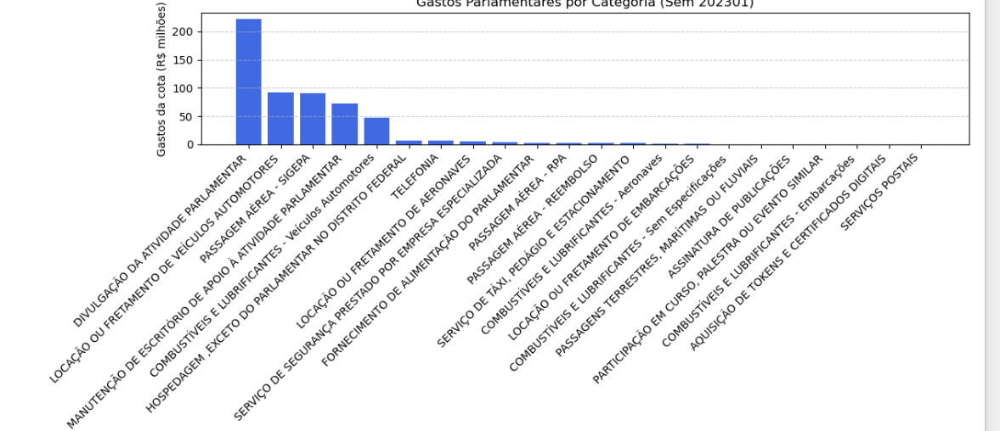

**macro_categoria**
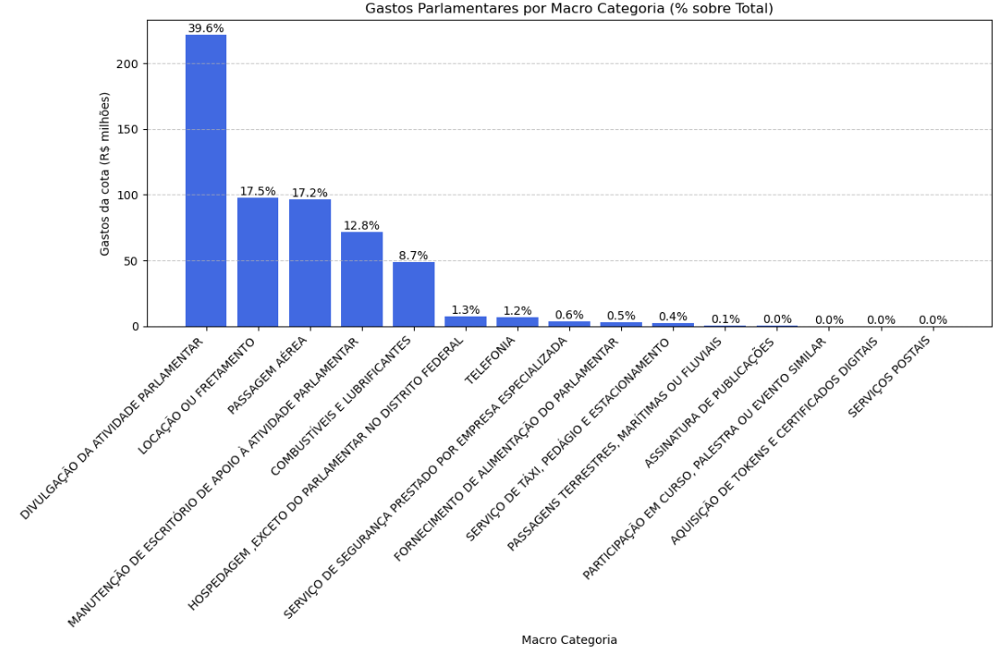

### 3.1.1
<div style="background-color:rgb(255, 219, 88); padding: 10px;">
  <span style="font-size:14px; font-weight:bold;">3.1.1 -  Preparação - com variáveis totais de cada categoria (Opção 1) </span>
</div>


#### Parte 1 e 2

In [190]:
from scipy.stats import zscore
import numpy as np

In [262]:
# --- 1) e 2) Seleção de variáveis e agrupamento ---
# Agrupamos pelas colunas solicitadas e somamos o 'vlrliquido'
# Usamos 'reset_index()' para transformar as colunas do agrupamento em colunas normais novamente.


df_agrupado = df.groupby(['txNomeParlamentar', 'sgUF', 'sgPartido', 
                          'cat_reeleicao','cat_cargo_titusup' , 'flag_lid', 'genero','desc_Subcota_Espec'])['vlrLiquido'].sum().reset_index()
df_agrupado.head()



,txNomeParlamentar,sgUF,sgPartido,cat_reeleicao,cat_cargo_titusup,flag_lid,genero,desc_Subcota_Espec,vlrLiquido
0,AJ Albuquerque,CE,PP,Reeleito,Titular,0,H,COMBUSTÍVEIS E LUBRIFICANTES - Veículos Automo...,83607.29
1,AJ Albuquerque,CE,PP,Reeleito,Titular,0,H,DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR,155300.00
2,AJ Albuquerque,CE,PP,Reeleito,Titular,0,H,"HOSPEDAGEM ,EXCETO DO PARLAMENTAR NO DISTRITO ...",40046.00
3,AJ Albuquerque,CE,PP,Reeleito,Titular,0,H,LOCAÇÃO OU FRETAMENTO DE AERONAVES,30000.00
4,AJ Albuquerque,CE,PP,Reeleito,Titular,0,H,LOCAÇÃO OU FRETAMENTO DE VEÍCULOS AUTOMOTORES,258713.00


#### Parte 3 e 4

In [263]:
# --- ETAPA 3: Adicionar a nova coluna 'nome_var_categoria_espec' ---
# Mapeamento fornecido para criar a nova coluna

mapeamento_categorias = {
    'AQUISIÇÃO DE TOKENS E CERTIFICADOS DIGITAIS': 'vl_tokens',
    'ASSINATURA DE PUBLICAÇÕES': 'vl_assinaturas',
    'COMBUSTÍVEIS E LUBRIFICANTES - Veículos Automotores': 'vl_comb_autom',
    'COMBUSTÍVEIS E LUBRIFICANTES - Embarcações': 'vl_comb_embarc',
    'COMBUSTÍVEIS E LUBRIFICANTES - Aeronaves': 'vl_comb_aeronaves',
    'COMBUSTÍVEIS E LUBRIFICANTES - Sem Especificações': 'vl_comb_semespec',
    'DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR': 'vl_divulg_ativ',
    'FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR': 'vl_alimentacao',
    'HOSPEDAGEM ,EXCETO DO PARLAMENTAR NO DISTRITO FEDERAL': 'vl_hospedagem',
    'LOCAÇÃO OU FRETAMENTO DE AERONAVES': 'vl_locfret_aeronave',
    'LOCAÇÃO OU FRETAMENTO DE VEÍCULOS AUTOMOTORES': 'vl_locfret_autom',
    'LOCAÇÃO OU FRETAMENTO DE EMBARCAÇÕES': 'vl_locfret_embarc',
    'MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE PARLAMENTAR': 'vl_manut_escritorio',
    'PARTICIPAÇÃO EM CURSO, PALESTRA OU EVENTO SIMILAR': 'vl_cursos_eventos',
    'PASSAGEM AÉREA - REEMBOLSO': 'vl_pass_aerea_reembolso',
    'PASSAGEM AÉREA - SIGEPA': 'vl_pass_aerea_sigepa',
    'PASSAGEM AÉREA - RPA': 'vl_pass_aerea_rpa',
    'PASSAGENS TERRESTRES, MARÍTIMAS OU FLUVIAIS': 'vl_pass_ter_mar_flu',
    'SERVIÇO DE SEGURANÇA PRESTADO POR EMPRESA ESPECIALIZADA': 'vl_servseguranca',
    'SERVIÇO DE TÁXI, PEDÁGIO E ESTACIONAMENTO': 'vl_taxi_ped_estac',
    'SERVIÇOS POSTAIS': 'vl_serv_postais',
    'TELEFONIA': 'vl_telefonia'
}

df_agrupado['nome_var_categoria_espec'] = df_agrupado['desc_Subcota_Espec'].map(mapeamento_categorias)



In [264]:
df_agrupado[['desc_Subcota_Espec', 'nome_var_categoria_espec']].drop_duplicates()

,desc_Subcota_Espec,nome_var_categoria_espec
0,COMBUSTÍVEIS E LUBRIFICANTES - Veículos Automo...,vl_comb_autom
1,DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR,vl_divulg_ativ
2,"HOSPEDAGEM ,EXCETO DO PARLAMENTAR NO DISTRITO ...",vl_hospedagem
3,LOCAÇÃO OU FRETAMENTO DE AERONAVES,vl_locfret_aeronave
4,LOCAÇÃO OU FRETAMENTO DE VEÍCULOS AUTOMOTORES,vl_locfret_autom
5,MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE ...,vl_manut_escritorio
6,PASSAGEM AÉREA - REEMBOLSO,vl_pass_aerea_reembolso
7,PASSAGEM AÉREA - SIGEPA,vl_pass_aerea_sigepa
8,TELEFONIA,vl_telefonia
9,COMBUSTÍVEIS E LUBRIFICANTES - Embarcações,vl_comb_embarc


In [289]:
# --- ETAPA 4: Pivotar a coluna 'nome_var_categoria_espec' ---
# Define o índice para o pivot
indices_pivot = [
    'txNomeParlamentar', 
    'sgUF', 
    'sgPartido', 
    'cat_reeleicao',
    'cat_cargo_titusup' ,
    'flag_lid',
    'genero',

]

# Pivota o dataframe. fillna(0) preenche os valores ausentes com 0.
df_agrup_preliminar = df_agrupado.pivot_table(
    index=indices_pivot, 
    columns='nome_var_categoria_espec', 
    values='vlrLiquido', 
    aggfunc='sum'
).reset_index().fillna(0)

df_agrup_preliminar

nome_var_categoria_espec,txNomeParlamentar,sgUF,sgPartido,cat_reeleicao,cat_cargo_titusup,flag_lid,genero,vl_alimentacao,vl_assinaturas,vl_comb_aeronaves,...,vl_locfret_embarc,vl_manut_escritorio,vl_pass_aerea_reembolso,vl_pass_aerea_rpa,vl_pass_aerea_sigepa,vl_pass_ter_mar_flu,vl_servseguranca,vl_taxi_ped_estac,vl_telefonia,vl_tokens
0,AJ Albuquerque,CE,PP,Reeleito,Titular,0,H,0.00,0.0,0.00,...,0.0,18086.25,29291.60,0.00,108188.97,0.0,0.00,0.00,8289.98,0.00
1,Abilio Brunini,MT,PL,Nao_reeleito,Titular,0,H,423.56,0.0,0.00,...,0.0,216736.82,0.00,0.00,128132.75,498.0,0.00,30.00,871.69,0.00
2,Acácio Favacho,AP,MDB,Reeleito,Titular,0,H,0.00,0.0,0.00,...,0.0,8683.10,24170.96,0.00,300021.66,0.0,0.00,0.00,15527.42,0.00
3,Adail Filho,AM,REPUBLICANOS,Nao_reeleito,Titular,0,H,0.00,0.0,0.00,...,0.0,945.20,0.00,0.00,98508.09,0.0,0.00,0.00,2586.29,0.00
4,Adilson Barroso,SP,PL,Nao_reeleito,Suplente,0,H,12068.16,0.0,0.00,...,0.0,128140.36,2823.90,37225.49,106966.48,0.0,0.00,21802.10,4743.73,120.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
607,Zé Silva,MG,SOLIDARIEDADE,Reeleito,Titular,0,H,4663.91,0.0,69061.23,...,0.0,90386.03,0.00,0.00,156282.78,0.0,0.00,507.00,23148.51,0.00
608,Zé Trovão,SC,PL,Nao_reeleito,Titular,0,H,11577.68,0.0,0.00,...,0.0,485675.48,0.00,0.00,113494.52,0.0,14273.93,6097.11,10607.66,0.00
609,Zé Vitor,MG,PL,Reeleito,Titular,0,H,0.00,0.0,11160.60,...,0.0,2026.05,0.00,4335.89,78964.45,0.0,0.00,3996.98,299.93,161.66
610,Átila Lins,AM,PSD,Reeleito,Titular,0,H,0.00,0.0,0.00,...,0.0,5350.50,104420.56,335611.56,41731.61,0.0,0.00,0.00,49178.19,0.00


In [291]:
#df[df['vlrLiquido']<0]

df_agrup_preliminar.drop(
    columns=indices_pivot,
    axis=1,
    inplace=False # Recomendado: cria uma cópia sem as colunas
)

nome_var_categoria_espec,vl_alimentacao,vl_assinaturas,vl_comb_aeronaves,vl_comb_autom,vl_comb_embarc,vl_comb_semespec,vl_cursos_eventos,vl_divulg_ativ,vl_hospedagem,vl_locfret_aeronave,...,vl_locfret_embarc,vl_manut_escritorio,vl_pass_aerea_reembolso,vl_pass_aerea_rpa,vl_pass_aerea_sigepa,vl_pass_ter_mar_flu,vl_servseguranca,vl_taxi_ped_estac,vl_telefonia,vl_tokens
0,0.00,0.0,0.00,83607.29,0.00,0.0,0.0,155300.00,40046.00,30000.0,...,0.0,18086.25,29291.60,0.00,108188.97,0.0,0.00,0.00,8289.98,0.00
1,423.56,0.0,0.00,115139.89,780.80,0.0,0.0,151942.00,22305.40,0.0,...,0.0,216736.82,0.00,0.00,128132.75,498.0,0.00,30.00,871.69,0.00
2,0.00,0.0,0.00,97259.19,0.00,0.0,0.0,656928.70,0.00,0.0,...,0.0,8683.10,24170.96,0.00,300021.66,0.0,0.00,0.00,15527.42,0.00
3,0.00,0.0,0.00,63038.98,18681.09,0.0,0.0,942950.00,0.00,43000.0,...,0.0,945.20,0.00,0.00,98508.09,0.0,0.00,0.00,2586.29,0.00
4,12068.16,0.0,0.00,110208.29,0.00,0.0,0.0,389633.34,15963.63,0.0,...,0.0,128140.36,2823.90,37225.49,106966.48,0.0,0.00,21802.10,4743.73,120.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
607,4663.91,0.0,69061.23,72169.41,1832.66,0.0,0.0,563409.55,11545.23,0.0,...,0.0,90386.03,0.00,0.00,156282.78,0.0,0.00,507.00,23148.51,0.00
608,11577.68,0.0,0.00,137170.84,0.00,0.0,0.0,295154.00,18500.75,0.0,...,0.0,485675.48,0.00,0.00,113494.52,0.0,14273.93,6097.11,10607.66,0.00
609,0.00,0.0,11160.60,135198.50,2072.00,0.0,0.0,870619.70,4319.71,0.0,...,0.0,2026.05,0.00,4335.89,78964.45,0.0,0.00,3996.98,299.93,161.66
610,0.00,0.0,0.00,0.00,0.00,0.0,0.0,159000.00,0.00,579060.0,...,0.0,5350.50,104420.56,335611.56,41731.61,0.0,0.00,0.00,49178.19,0.00


#### Parte 5 (facultativa) -zerar valores negativos

In [267]:
# ----ETAPA 5 - zerar valores snegativos

condicao_negativa = (
    (df_agrup_preliminar['vl_pass_aerea_sigepa'] < 0) |
    (df_agrup_preliminar['vl_pass_aerea_reembolso'] < 0) |
    (df_agrup_preliminar['vl_pass_aerea_rpa'] < 0)
)

df_negativos = df_agrup_preliminar[condicao_negativa]

df_negativos

nome_var_categoria_espec,txNomeParlamentar,sgUF,sgPartido,cat_reeleicao,cat_cargo_titusup,flag_lid,genero,vl_alimentacao,vl_assinaturas,vl_comb_aeronaves,...,vl_locfret_embarc,vl_manut_escritorio,vl_pass_aerea_reembolso,vl_pass_aerea_rpa,vl_pass_aerea_sigepa,vl_pass_ter_mar_flu,vl_servseguranca,vl_taxi_ped_estac,vl_telefonia,vl_tokens
393,Marco Bertaiolli,SP,PSD,Reeleito,Titular,0,H,0.0,0.0,0.0,...,0.0,13682.78,0.0,-39.17,16834.1,0.0,0.0,0.0,2065.95,0.0


In [268]:
"""

colunas_a_corrigir = [
    'vl_pass_aerea_sigepa',
    'vl_pass_aerea_reembolso',
    'vl_pass_aerea_rpa'
]
df_agrup_preliminar[colunas_a_corrigir]=df_agrup_preliminar[colunas_a_corrigir].clip(lower=0)

df_agrup_preliminar[condicao_negativa]
"""

"\n\ncolunas_a_corrigir = [\n    'vl_pass_aerea_sigepa',\n    'vl_pass_aerea_reembolso',\n    'vl_pass_aerea_rpa'\n]\ndf_agrup_preliminar[colunas_a_corrigir]=df_agrup_preliminar[colunas_a_corrigir].clip(lower=0)\n\ndf_agrup_preliminar[condicao_negativa]\n"

#### verificações de variaveis de montante menor

In [269]:
#Vamos avaliar os registros das categorias com menos valores

#Serviços postais
df_agrup_preliminar[df_agrup_preliminar['vl_serv_postais']>0] 

KeyError: 'vl_serv_postais'

In [270]:
#Tokens
print( df_agrup_preliminar[df_agrup_preliminar['vl_tokens']>0][['txNomeParlamentar','vl_tokens']] .sum())
df_agrup_preliminar[df_agrup_preliminar['vl_tokens']>0][['txNomeParlamentar','vl_tokens']] 

nome_var_categoria_espec
txNomeParlamentar    Adilson BarrosoAdriana VenturaAna PimentelAnto...
vl_tokens                                                     20795.79
dtype: object


nome_var_categoria_espec,txNomeParlamentar,vl_tokens
4,Adilson Barroso,120.00
6,Adriana Ventura,275.00
37,Ana Pimentel,218.00
44,Antonio Andrade,490.00
50,Arlindo Chinaglia,165.00
66,Beto Richa,380.00
83,Carlos Chiodini,610.31
91,Carol Dartora,374.90
94,Celso Russomanno,124.90
106,Coronel Armando,130.00


In [271]:
#Curso e eventos
print(df_agrup_preliminar[df_agrup_preliminar['vl_cursos_eventos']>0][['txNomeParlamentar','vl_cursos_eventos']].sum() )
df_agrup_preliminar[df_agrup_preliminar['vl_cursos_eventos']>0][['txNomeParlamentar','vl_cursos_eventos']] 

nome_var_categoria_espec
txNomeParlamentar    Ana Paula LimaCastro NetoCoronel FernandaCoron...
vl_cursos_eventos                                            124891.58
dtype: object


nome_var_categoria_espec,txNomeParlamentar,vl_cursos_eventos
36,Ana Paula Lima,9100.00
93,Castro Neto,8500.00
109,Coronel Fernanda,5000.00
110,Coronel Meira,19000.00
178,Dr. Remy Soares,14000.00
182,Dra. Mayra Pinheiro,9145.61
303,Josenildo,9145.61
319,Julia Zanatta,9145.61
353,Luciano Amaral,3600.00
540,Rosangela Moro,20451.61


In [272]:
#vl_assinaturas
print(df_agrup_preliminar[df_agrup_preliminar['vl_assinaturas']>0][['txNomeParlamentar','vl_assinaturas']].sum())
df_agrup_preliminar[df_agrup_preliminar['vl_assinaturas']>0][['txNomeParlamentar','vl_assinaturas']] 

nome_var_categoria_espec
txNomeParlamentar    Adriana VenturaAlceu MoreiraAlexandre LeiteAna...
vl_assinaturas                                               178800.27
dtype: object


nome_var_categoria_espec,txNomeParlamentar,vl_assinaturas
6,Adriana Ventura,2939.40
16,Alceu Moreira,5976.50
21,Alexandre Leite,340.00
35,Ana Paula Leão,208.30
37,Ana Pimentel,2011.21
...,...,...
584,Vander Loubet,309.00
590,Vitor Lippi,5752.40
596,Welter,300.00
601,Zeca Dirceu,65.90


#### 

<div style="background-color:yellow; padding: 10px;">
  <span style="font-size:14px; font-weight:bold;"> ----- selecao das colunas </span>
</div>


In [273]:
colunas_quantitativas_completa=['vl_alimentacao',
 'vl_assinaturas',
 'vl_comb_aeronaves',
 'vl_comb_autom',
 'vl_comb_embarc',
 'vl_comb_semespec',
 'vl_cursos_eventos',
 'vl_divulg_ativ',
 'vl_hospedagem',
 'vl_locfret_aeronave',
 'vl_locfret_autom',
 'vl_locfret_embarc',
 'vl_manut_escritorio',
 'vl_pass_aerea_reembolso',
 'vl_pass_aerea_rpa',
 'vl_pass_aerea_sigepa',
 'vl_pass_ter_mar_flu',
 'vl_servseguranca',
 'vl_taxi_ped_estac',
 'vl_telefonia',
 'vl_tokens']

In [274]:
#colunas_quantitativas_reduzida=  ['vl_comb_semespec','vl_comb_embarc','vl_comb_autom','vl_divulg_ativ','vl_locfret_autom','vl_pass_aerea_sigepa', 'vl_manut_escritorio']

In [275]:
# colunas_quantitativas =  colunas_quantitativas_reduzida.copy()

colunas_quantitativas =  colunas_quantitativas_completa.copy()

#### 

<div style="background-color:yellow; padding: 10px;">
  <span style="font-size:14px; font-weight:bold;"> ----- 
  </span>
</div>


In [292]:
df_agrup_preliminar.columns

Index(['txNomeParlamentar', 'sgUF', 'sgPartido', 'cat_reeleicao',
       'cat_cargo_titusup', 'flag_lid', 'genero', 'vl_alimentacao',
       'vl_assinaturas', 'vl_comb_aeronaves', 'vl_comb_autom',
       'vl_comb_embarc', 'vl_comb_semespec', 'vl_cursos_eventos',
       'vl_divulg_ativ', 'vl_hospedagem', 'vl_locfret_aeronave',
       'vl_locfret_autom', 'vl_locfret_embarc', 'vl_manut_escritorio',
       'vl_pass_aerea_reembolso', 'vl_pass_aerea_rpa', 'vl_pass_aerea_sigepa',
       'vl_pass_ter_mar_flu', 'vl_servseguranca', 'vl_taxi_ped_estac',
       'vl_telefonia', 'vl_tokens'],
      dtype='object', name='nome_var_categoria_espec')

In [293]:
""" --------------------------------------
BACKUP 
-------------------------------------"""
df_agrup_preliminar_totais = df_agrup_preliminar.copy() 

#### ------

In [294]:
"""
#Encontre dinamicamente todas as colunas que começam com 'vl_'
colunas_quantitativas = [col for col in df_agrup_preliminar.columns if col.startswith('vl_')]
#colunas_quantitativas = colunas_quantitativas.remove('vl_serv_postais')
colunas_quantitativas  = [var for var in colunas_quantitativas if var != 'vl_serv_postais']
#print(f"Colunas para padronização: {colunas_quantitativas}")
"""

'\n#Encontre dinamicamente todas as colunas que começam com \'vl_\'\ncolunas_quantitativas = [col for col in df_agrup_preliminar.columns if col.startswith(\'vl_\')]\n#colunas_quantitativas = colunas_quantitativas.remove(\'vl_serv_postais\')\ncolunas_quantitativas  = [var for var in colunas_quantitativas if var != \'vl_serv_postais\']\n#print(f"Colunas para padronização: {colunas_quantitativas}")\n'

In [295]:

df_agrup_preliminar.to_csv(
    'df_agrup_preliminar',
    sep=';',         # Define o ponto e vírgula como separador
    encoding='utf-8', # Define a codificação UTF-8
    index=False      # Opcional: Remove o índice do DataFrame do arquivo CSV
)


#### Padronização

In [296]:
colunas_quantitativas

['vl_alimentacao',
 'vl_assinaturas',
 'vl_comb_aeronaves',
 'vl_comb_autom',
 'vl_comb_embarc',
 'vl_comb_semespec',
 'vl_cursos_eventos',
 'vl_divulg_ativ',
 'vl_hospedagem',
 'vl_locfret_aeronave',
 'vl_locfret_autom',
 'vl_locfret_embarc',
 'vl_manut_escritorio',
 'vl_pass_aerea_reembolso',
 'vl_pass_aerea_rpa',
 'vl_pass_aerea_sigepa',
 'vl_pass_ter_mar_flu',
 'vl_servseguranca',
 'vl_taxi_ped_estac',
 'vl_telefonia',
 'vl_tokens']

In [297]:
df_quanti=df_agrup_preliminar[colunas_quantitativas]
df_quanti

nome_var_categoria_espec,vl_alimentacao,vl_assinaturas,vl_comb_aeronaves,vl_comb_autom,vl_comb_embarc,vl_comb_semespec,vl_cursos_eventos,vl_divulg_ativ,vl_hospedagem,vl_locfret_aeronave,...,vl_locfret_embarc,vl_manut_escritorio,vl_pass_aerea_reembolso,vl_pass_aerea_rpa,vl_pass_aerea_sigepa,vl_pass_ter_mar_flu,vl_servseguranca,vl_taxi_ped_estac,vl_telefonia,vl_tokens
0,0.00,0.0,0.00,83607.29,0.00,0.0,0.0,155300.00,40046.00,30000.0,...,0.0,18086.25,29291.60,0.00,108188.97,0.0,0.00,0.00,8289.98,0.00
1,423.56,0.0,0.00,115139.89,780.80,0.0,0.0,151942.00,22305.40,0.0,...,0.0,216736.82,0.00,0.00,128132.75,498.0,0.00,30.00,871.69,0.00
2,0.00,0.0,0.00,97259.19,0.00,0.0,0.0,656928.70,0.00,0.0,...,0.0,8683.10,24170.96,0.00,300021.66,0.0,0.00,0.00,15527.42,0.00
3,0.00,0.0,0.00,63038.98,18681.09,0.0,0.0,942950.00,0.00,43000.0,...,0.0,945.20,0.00,0.00,98508.09,0.0,0.00,0.00,2586.29,0.00
4,12068.16,0.0,0.00,110208.29,0.00,0.0,0.0,389633.34,15963.63,0.0,...,0.0,128140.36,2823.90,37225.49,106966.48,0.0,0.00,21802.10,4743.73,120.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
607,4663.91,0.0,69061.23,72169.41,1832.66,0.0,0.0,563409.55,11545.23,0.0,...,0.0,90386.03,0.00,0.00,156282.78,0.0,0.00,507.00,23148.51,0.00
608,11577.68,0.0,0.00,137170.84,0.00,0.0,0.0,295154.00,18500.75,0.0,...,0.0,485675.48,0.00,0.00,113494.52,0.0,14273.93,6097.11,10607.66,0.00
609,0.00,0.0,11160.60,135198.50,2072.00,0.0,0.0,870619.70,4319.71,0.0,...,0.0,2026.05,0.00,4335.89,78964.45,0.0,0.00,3996.98,299.93,161.66
610,0.00,0.0,0.00,0.00,0.00,0.0,0.0,159000.00,0.00,579060.0,...,0.0,5350.50,104420.56,335611.56,41731.61,0.0,0.00,0.00,49178.19,0.00


In [298]:
# Copie o DataFrame para não alterar o original
df_quanti_pad = df_quanti.copy()

In [299]:
#Aplicar a padronização Z-score a essas colunas dinâmicas
df_quanti_pad[colunas_quantitativas] = df_quanti_pad[colunas_quantitativas].apply(zscore, ddof=1)
df_quanti_pad

nome_var_categoria_espec,vl_alimentacao,vl_assinaturas,vl_comb_aeronaves,vl_comb_autom,vl_comb_embarc,vl_comb_semespec,vl_cursos_eventos,vl_divulg_ativ,vl_hospedagem,vl_locfret_aeronave,...,vl_locfret_embarc,vl_manut_escritorio,vl_pass_aerea_reembolso,vl_pass_aerea_rpa,vl_pass_aerea_sigepa,vl_pass_ter_mar_flu,vl_servseguranca,vl_taxi_ped_estac,vl_telefonia,vl_tokens
0,-0.439038,-0.238034,-0.173957,0.111822,-0.095905,-0.056093,-0.129883,-0.842770,1.507932,0.489167,...,-0.052535,-0.848942,2.437387,-0.254764,-0.412943,-0.211377,-0.216774,-0.459264,-0.204996,-0.095439
1,-0.372131,-0.238034,-0.173957,0.641948,0.739081,-0.056093,-0.129883,-0.856257,0.552892,-0.166727,...,-0.052535,0.841843,-0.406198,-0.254764,-0.233248,0.014871,-0.216774,-0.455842,-0.748181,-0.095439
2,-0.439038,-0.238034,-0.173957,0.341338,-0.095905,-0.056093,-0.129883,1.171869,-0.647887,-0.166727,...,-0.052535,-0.928976,1.940283,-0.254764,1.315485,-0.211377,-0.216774,-0.459264,0.324947,-0.095439
3,-0.439038,-0.238034,-0.173957,-0.233972,19.881616,-0.056093,-0.129883,2.320586,-0.647887,0.773388,...,-0.052535,-0.994836,-0.406198,-0.254764,-0.500168,-0.211377,-0.216774,-0.459264,-0.622634,-0.095439
4,1.467292,-0.238034,-0.173957,0.559038,-0.095905,-0.056093,-0.129883,0.098358,0.211492,-0.166727,...,-0.052535,0.087767,-0.132058,1.654358,-0.423958,-0.211377,-0.216774,2.027765,-0.464661,0.241603
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
607,0.297690,-0.238034,4.408962,-0.080472,1.863938,-0.056093,-0.129883,0.796278,-0.026366,-0.166727,...,-0.052535,-0.233573,-0.406198,-0.254764,0.020386,-0.211377,-0.216774,-0.401429,0.882982,-0.095439
608,1.389814,-0.238034,-0.173957,1.012332,-0.095905,-0.056093,-0.129883,-0.281089,0.348075,-0.166727,...,-0.052535,3.130875,-0.406198,-0.254764,-0.365139,-0.211377,0.331386,0.236251,-0.035290,-0.095439
609,-0.439038,-0.238034,0.566663,0.979173,2.119888,-0.056093,-0.129883,2.030094,-0.415341,-0.166727,...,-0.052535,-0.985636,-0.406198,-0.032396,-0.676258,-0.211377,-0.216774,-0.003317,-0.790047,0.358612
610,-0.439038,-0.238034,-0.173957,-1.293784,-0.095905,-0.056093,-0.129883,-0.827911,-0.647887,12.493345,...,-0.052535,-0.957341,9.730795,16.957194,-1.011729,-0.211377,-0.216774,-0.459264,2.788940,-0.095439


In [300]:
#pip install --upgrade plotly jupyterlab "ipywidgets>=7.6"

In [301]:
#Vamos remover essa coluna por ter apenas 1 registro
#df_quanti_pad = df_quanti_pad.drop('vl_serv_postais', axis=1)
#df_quanti = df_quanti.drop('vl_serv_postais', axis=1)

In [302]:
"""
Em termos de quantidades totais de gastos, as variaveis que teria mais relevancia seriam essas:
 vl_divulg_ativ,
 vl_locfret_autom ,
vl_pass_aerea_sigepa,
vl_manut_escritorio,
vl_comb_autom ,
vl_hospedagem
"""

'\nEm termos de quantidades totais de gastos, as variaveis que teria mais relevancia seriam essas:\n vl_divulg_ativ,\n vl_locfret_autom ,\nvl_pass_aerea_sigepa,\nvl_manut_escritorio,\nvl_comb_autom ,\nvl_hospedagem\n'

In [303]:
#%% Gráfico 2D das observações
pio.renderers.default = "notebook"
fig = px.scatter(df_quanti_pad, 
                    x='vl_divulg_ativ', 
                    y='vl_locfret_autom')
fig.show()

In [221]:
#%% Gráfico 2D das observações
pio.renderers.default = "notebook"
fig = px.scatter(df_quanti_pad, 
                    x='vl_comb_autom', 
                    y='vl_locfret_autom')
fig.show()

In [222]:
#%% Gráfico 3D das observações
pio.renderers.default = 'browser'
fig = px.scatter_3d(df_quanti_pad, 
                    x='vl_divulg_ativ', 
                    y='vl_locfret_autom', 
                    z='vl_pass_aerea_sigepa')
fig.show()

In [ ]:
"""



import plotly.express as px
pio.renderers.default =  'browser'
from itertools import combinations

#Vamos selecionar algumas variáveis para gerar os graficos scatter 
var_scatter = [
    'vl_divulg_ativ',
    'vl_locfret_autom',
    'vl_pass_aerea_sigepa',
    'vl_manut_escritorio',
    'vl_comb_autom',
    'vl_hospedagem'
]

# Gerar todas as combinações únicas de 3 variáveis
comb_scatter = list(combinations(var_scatter, 3))

for i, combo in enumerate(comb_scatter):
    x_var, y_var, z_var = combo
    
    # Criar o gráfico 3D
    fig = px.scatter_3d(df_quanti_pad,
                        x=x_var,
                        y=y_var,
                        z=z_var,
                        title=f"Gráfico {i+1}: {x_var} vs {y_var} vs {z_var}")
    
    # Mostrar o gráfico diretamente na célula do notebook
    fig.show("notebook")



    
"""

## Atenção 

<div style="background-color:rgb(255, 100, 100); padding: 10px;">
  <span style="font-size:18px; font-weight:bold;"> Daqui pra frente só roda com a opção escolhida e rodada anterioremente na etapa 3.1 </span>
</div>

## 3.2
<div style="background-color:lightblue; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;">3.2 Análise de correlaçao e  colinearidade</span>
</div>



A diferença é que correlação é a medida da relação linear entre duas variáveis (se elas se movem juntas e com que força, de -1 a 1). Já a colinearidade é um tipo específico de problema em modelos de regressão onde duas ou mais variáveis independentes são altamente correlacionadas entre si, o que pode dificultar a identificação do impacto individual de cada variável no desfecho. Em suma, a correlação é a relação em si, enquanto a colinearidade é um problema causado por essa relação entre as variáveis preditoras. 

Colinearidade é um termo utilizado na estatística para descrever uma alta correlação entre duas variáveis, indicando que ambas têm uma trajetória linear .



A correlação como qualquer cientista de dados sabe, é a medida de força da relação entre duas variáveis e pode ser calculada usando uma grande variedade de métodos mas o método que é mais comumente utilizado é o “coeficiente de correlação de Pearson” que varia entre -1 a 1 onde -1 indica uma correlação perfeita negativa e +1 uma correlação perfeita positiva e quando mais próximo de 0 menor é a correlação.

Já a colinearidade refere-se à relação linear entre duas ou mais variáveis independentes em um modelo estatístico em que uma ou mais variáveis são capazes de predizer outra e pode ser calculada através do variance inflation factor (VIF):
![image.png](attachment:8a34f148-a645-4b1a-8373-eeda84c51bd0.png)

onde:
VIF é o Fator de Inflação da Variância
Rₖ² é o coeficiente de determinação da preditora ( ₖ ) em relação a outras preditoras do modelo.

A colinearidade tem frequentemente um valor de referência onde VIF > 10 (em alguns casos, maior que 5) há indicativos de alta colinearidade.

Certo, sabendo que a colinearidade pode causar problemas em modelos de regressão porque as variáveis em questão compartilham muita informação. O que podemos fazer pra lidar com a colinearidade?

Bom, pra isso eu trouxe 3 dicas que são podem em algum momento ser de alta ajuda pra você que está lendo:

1 — Excluir uma das variáveis independentes do modelo (essa é a solução mais simples mas pode não ser a melhor se essas variáveis forem importantes para o modelo).

2 — Utilizar técnicas de regressão que são menos sensíveis a colinearidade (ridge, LASSO, Net Regression, Gradient Boosting…).

3 — Utilizar métodos de estatística robusta para estimar os coeficientes de regressão porque eles são menos afetados pela presença de colinearidade (e também a presença de outliers).


-------

No caso desse problema, iremos escolher as vriáveis

### 3.2.1 -Analise de Correlação



In [251]:
import pingouin as pg
import plotly.express as px 
import plotly.graph_objects as go
import plotly.io as pio

In [252]:
# Gerando a matriz de correlações de Pearson
matriz_corr = pg.rcorr(df_quanti,
                       method = 'pearson', 
                       upper = 'pval', 
                       decimals = 4, 
                       pval_stars = {0.01: '***',
                                     0.05: '**', 
                                     0.10: '*'})

matriz_corr

nome_var_categoria_espec,vl_alimentacao,vl_assinaturas,vl_comb_aeronaves,vl_comb_autom,vl_comb_embarc,vl_comb_semespec,vl_cursos_eventos,vl_divulg_ativ,vl_hospedagem,vl_locfret_aeronave,...,vl_locfret_embarc,vl_manut_escritorio,vl_pass_aerea_reembolso,vl_pass_aerea_rpa,vl_pass_aerea_sigepa,vl_pass_ter_mar_flu,vl_servseguranca,vl_taxi_ped_estac,vl_telefonia,vl_tokens
nome_var_categoria_espec,,,,,,,,,,,,,,,,,,,,,
vl_alimentacao,-,***,,***,,,,,***,,...,,**,***,,,***,,***,***,
vl_assinaturas,0.1626,-,,,,,,,,,...,,***,,*,**,***,,***,***,
vl_comb_aeronaves,-0.0072,-0.0318,-,,***,,,,,,...,,,,*,,,,,*,
vl_comb_autom,0.2094,0.0423,-0.0314,-,,,,***,***,**,...,,***,,,***,***,*,***,***,
vl_comb_embarc,0.0265,-0.0093,0.284,-0.0126,-,,,**,,,...,,,,,,,,,,
vl_comb_semespec,-0.0229,-0.0134,-0.0084,-0.052,-0.0054,-,,,,,...,,,,,,,,,,
vl_cursos_eventos,0.0383,0.0492,-0.0226,-0.0308,-0.0125,-0.0073,-,,***,,...,,,,,,,,**,,
vl_divulg_ativ,-0.0139,-0.023,0.0263,0.154,0.0845,-0.0399,0.0118,-,,,...,,***,,,**,,,*,,
vl_hospedagem,0.2747,0.0639,-0.0211,0.3443,-0.0281,0.0329,0.127,-0.0476,-,,...,,***,***,,***,***,,***,***,


In [253]:
#Mapa de calor indicando a correlação entre os atributos

# Matriz de correlações básica
corr = df_quanti.corr()
# Gráfico de calor (heatmap)
fig = go.Figure()
fig.add_trace(
                go.Heatmap(
                    x = corr.columns,
                    y = corr.index,
                    z = np.array(corr),
                    zmin=-1,
                    zmax=1,
                    text=corr.values,
                    texttemplate='%{text:.2f}',
                    colorscale='Viridis',
                    textfont=dict(size=8))   
                )

fig.update_layout(
    xaxis=dict(
        tickangle=-30,
        tickfont=dict(size=10) # Adjust the font size for the x-axis labels
    ),
    yaxis=dict(
        tickfont=dict(size=10) # Adjust the font size for the y-axis labels
    ),
    title='Correlation Heatmap',
   width=800 
            )
fig.show()


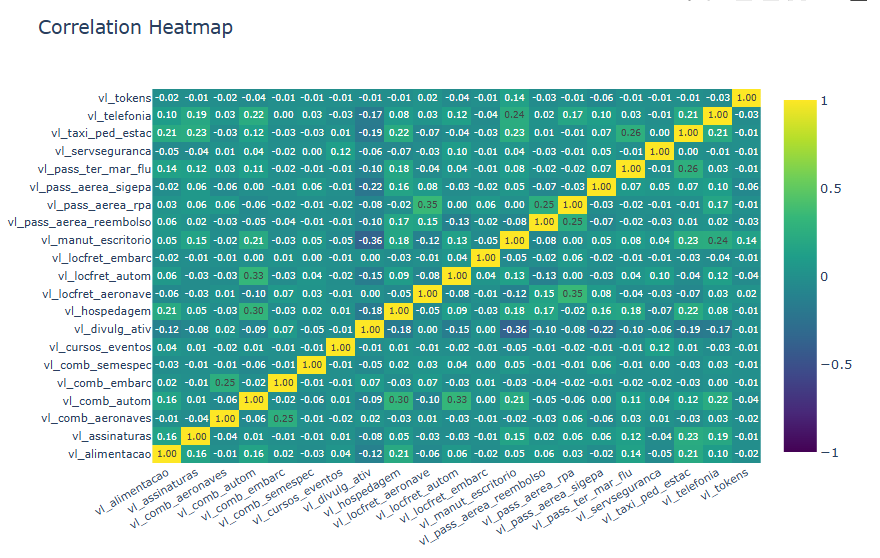

Para o caso opção 1 - valores integrais de 2/2023 a 4/2025 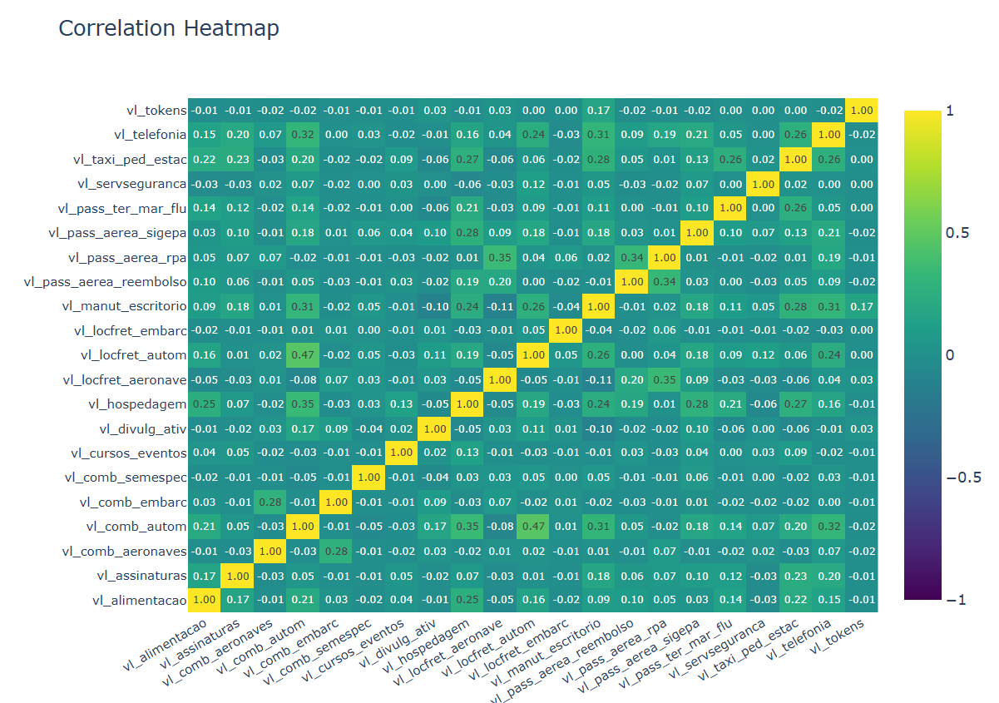

Para o caso opção 3 - valores integrais de 10/2023 a 12/2023 + 10/24 a 12/24

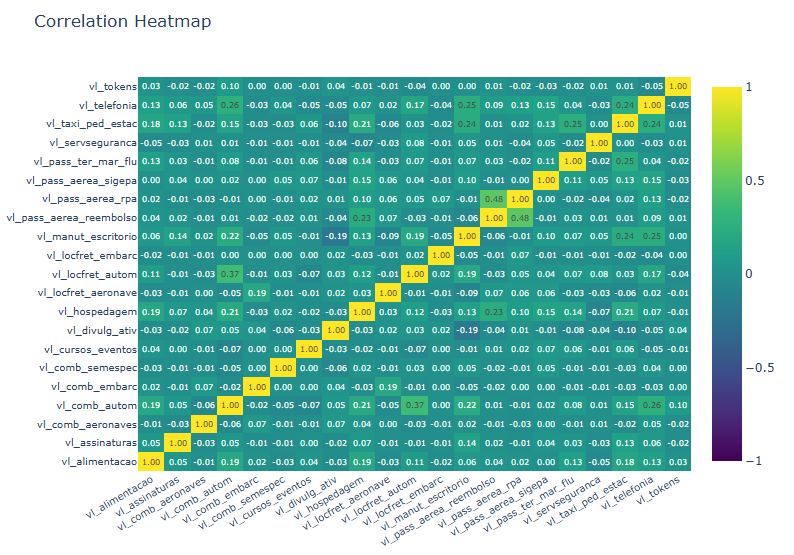

In [ ]:
 # We can reduce multicollinearity by calculating the Variance Inflation Factor, or just VIF, ensuring your model stays interpretable and robust.

### 3.2.2 Analise de Colinearidade

Se os preditores numa regressão são altamente correlacionados, a gente chama isso de colinearidade.

 Se VIF > 10 (em alguns casos, maior que 5) há indicativos de alta colinearidade.


 
colinearidade se refere a quando uma variável é EXATAMENTE uma combinação linear de outras no conjunto, tipo, se Y = 2X ou Y = 2X - Z. No dia a dia (principalmente em ciências sociais/psicologia/economia), colinearidade ou multicolinearidade se refere a qualquer situação onde a correlação entre os preditores é “alta”.


What should we do about highly correlated features in your dataset?

That is a problem that can reduce the effectiveness of a linear model. When more than one variable explains the same behavior of the y variable, we say that they are colinear


In [ ]:
df_vif = 1 / (1 - corr)

In [ ]:
def colorir_celulas(valor):
    """
    Retorna a cor de fundo com base no valor.
    Vermelho se >= 10, Branco caso contrário.
    """
    if valor >= 10:
        return 'background-color: red'
    else:
        return 'background-color: white'

# Aplica a função de estilo a cada elemento do DataFrame
df_vif_estilizado = df_vif.style.applymap(colorir_celulas)

# Exibe o DataFrame estilizado
# Em ambientes como Jupyter Notebook, o resultado será uma tabela HTML colorida
df_vif_estilizado

In [ ]:
Visto que apenas as diagonais , vamos

In [ ]:
colunas_quantitativas

In [ ]:
pd.options.display.float_format = '{:,.2f}'.format
df_quanti.sum().sort_values(ascending=False)

In [ ]:
colunas_a_remover = [
    'vl_tokens',
    'vl_cursos_eventos',
    'vl_assinaturas'
]



In [ ]:
colunas_quantitativas = [
    coluna for coluna in colunas_quantitativas 
    if coluna not in colunas_a_remover
]

df_quanti = df_quanti.drop(columns=colunas_a_remover, inplace=True)
df_quanti_pad = df_quanti_pad.drop(columns=colunas_a_remover, inplace=True)

## 3.3.
<div style="background-color:lightblue; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;">3.3 Clusterizaçao hierarquica - aglomerativa</span>
</div>



Aglomerativa (Hierarchical Clustering)
Objetivo: Criar uma hierarquia de agrupamentos, formando uma árvore (dendrograma) que mostra como os dados se agrupam em diferentes níveis.

Como funciona:
- Cada ponto começa como um cluster individual.
- Os clusters mais próximos são fundidos passo a passo.
- O processo continua até todos os pontos estarem em um único cluster ou até atingir um número desejado.

Aplicações comuns:
- Análise genética (agrupamento de espécies).
- Agrupamento de textos ou documentos.
- Segmentação de imagens.

Vantagens:
- Não precisa definir o número de clusters inicialmente.
- Produz uma visualização rica (dendrograma).

Limitações:
- Mais lento em grandes conjuntos de dados.
- Difícil de ajustar se os dados forem muito ruidosos.

In [304]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.cluster.hierarchy as sch
import scipy.stats as stats
from scipy.stats import zscore
from scipy.spatial.distance import pdist
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
import pingouin as pg
import plotly.express as px 
import plotly.io as pio
pio.renderers.default='browser'

In [305]:
# Box-plot de plt.figure(figsize=(10,7))
sns.boxplot(x='variable', y='value', data=pd.melt(df_quanti_pad) )
plt.ylabel('Valores', fontsize=16)
plt.xlabel('Variáveis', fontsize=16)
plt.show()

ValueError: Could not interpret value `variable` for `x`. An entry with this name does not appear in `data`.

### 3.3.1
<div style="background-color:rgb(255, 219, 88); padding: 10px;">
  <span style="font-size:14px; font-weight:bold;">3.3.1 -  Clusterizaçao hierarquica  aglomerativa  - Distancia euclidiana</span>
</div>


In [ ]:
df_quanti_pad.head()

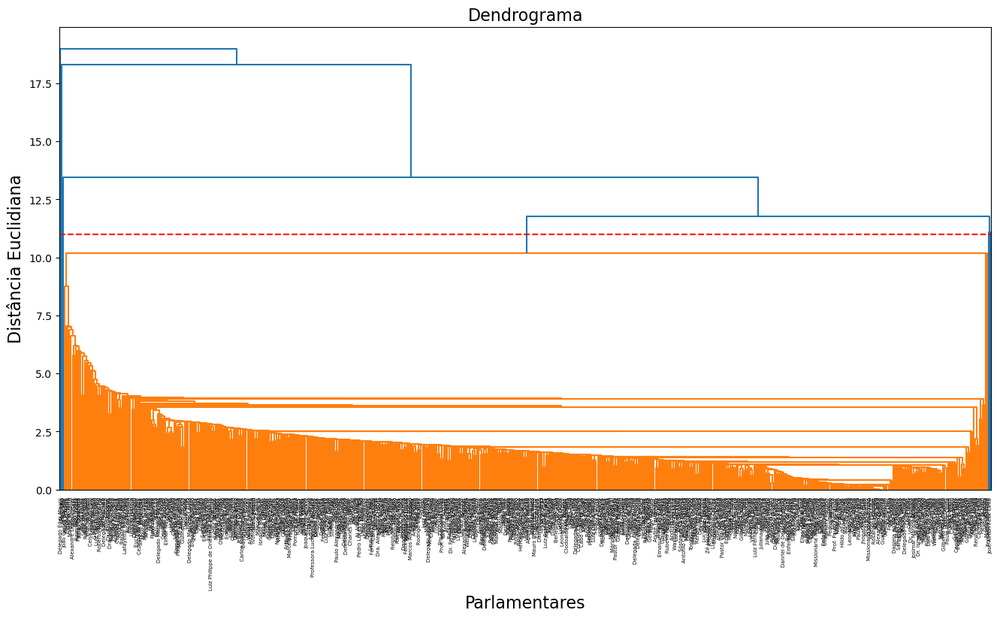

In [306]:
"""
Cluster hierárquico aglomerativo: 
 distância:  euclidiana 
método encademaento: single linkage

""" 
# Visualizando as distâncias
dist_euclidiana = pdist(df_quanti_pad, 
                        metric='euclidean') 

# Opções para as distâncias ("metric"):
    ## euclidean
    ## sqeuclidean
    ## cityblock (Manhattan)
    ## chebyshev
    ## canberra
    ## correlation

# Gerando o dendrograma
## Distância euclidiana e método de encadeamento single linkage

plt.figure(figsize=(16,8))
dend_sing = sch.linkage(df_quanti_pad, 
                        method = 'single', 
                        metric = 'euclidean') #gerar clusterizaçao aglomerativa
y_linha=11
dendrogram_s = sch.dendrogram(dend_sing,
                              color_threshold = y_linha, 
                              labels = list(df_agrup_preliminar['txNomeParlamentar'])  
                             )

plt.title('Dendrograma', fontsize=16)
plt.xlabel('Parlamentares', fontsize=16)

plt.ylabel('Distância Euclidiana', fontsize=16)
plt.axhline(y = y_linha,
            color = 'red', linestyle = '--')
plt.show()

# Opções para o método de encadeamento ("method"):
    ## single
    ## complete
    ## average

# Opções para as distâncias ("metric"):
    ## euclidean
    ## sqeuclidean
    ## cityblock
    ## chebyshev
    ## canberra
    ## correlation


Nao conseguimos visualizar o padrao de aglomeraçao.
As observaçoes estao muito proximas entre elas.
Unões acontecem em diastancias baixas.


In [ ]:
"""

#Como já imaginado, há muitas observaçoes para     
# Como já observamos 4 clusters no dendrograma, vamos selecionar "4" clusters
# A medida de distância e o método de encadeamento são mantidos

cluster_sing = AgglomerativeClustering(n_clusters = 4, 
                                       metric = 'euclidean', 
                                       linkage = 'single')

indica_cluster_sing = cluster_sing.fit_predict(df_quanti_pad)

df_agrup_preliminar['cluster_agg_euc_single'] = indica_cluster_sing
df_agrup_preliminar['cluster_agg_euc_single'] = df_agrup_preliminar['cluster_agg_euc_single'].astype('category')

# Coeficientes do esquema hierárquico de aglomeração (single)
coef_single = [y[1] for y in dendrogram_s['dcoord']]
#print(coef_single)

"""

In [ ]:
#Dendograma é péssimo para conseguir distinguir algo.

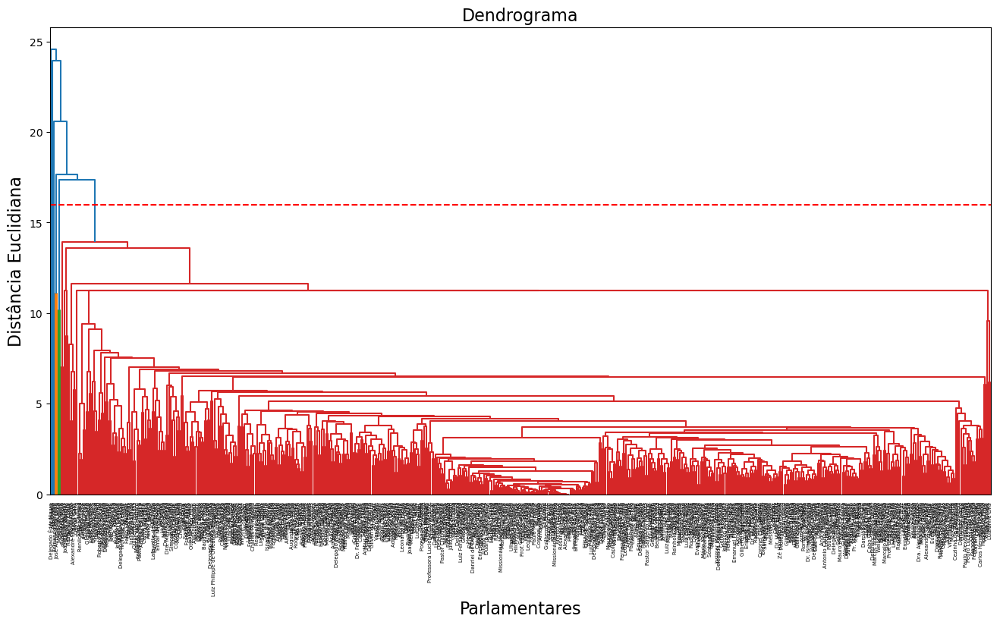

In [307]:
""" 2
Cluster hierárquico aglomerativo: 
 distância: EUCLIDIANA 
método encademaento: AVERAGE linkage

"""
#%% Cluster hierárquico aglomerativo: distância euclidiana + AVeRAGE linkage

# Gerando o dendrograma
## Distância euclidiana e método de encadeamento AVERAGE linkage

plt.figure(figsize=(16,8))
dend_avg = sch.linkage(df_quanti_pad,
                         method = 'average', 
                         metric = 'euclidean')
y_linha_threshold = 16
dendrogram_c = sch.dendrogram(dend_avg, 
                              color_threshold = y_linha_threshold, 
                              labels = list(df_agrup_preliminar['txNomeParlamentar'])
                                )

plt.title('Dendrograma', fontsize=16)
plt.xlabel('Parlamentares', fontsize=16)
plt.ylabel('Distância Euclidiana', fontsize=16)
plt.axhline(y = y_linha_threshold, 
            color = 'red', linestyle = '--')
plt.show()


In [ ]:
"""

# Gerando a variável com a indicação do cluster no dataset

cluster_avg = AgglomerativeClustering(n_clusters = 8,
                                       metric = 'euclidean',
                                       linkage = 'average')

indica_cluster_avg = cluster_avg.fit_predict(df_quanti_pad)

df_agrup_preliminar['cluster_agg_euc_avg'] = indica_cluster_avg
df_agrup_preliminar['cluster_agg_euc_avg'] = df_agrup_preliminar['cluster_agg_euc_avg'].astype('category')

# Coeficientes do esquema hierárquico de aglomeração (complete)
#coef_complete = [y[1] for y in dendrogram_c['dcoord']]
#print(coef_complete)
df_agrup_preliminar.head()

"""


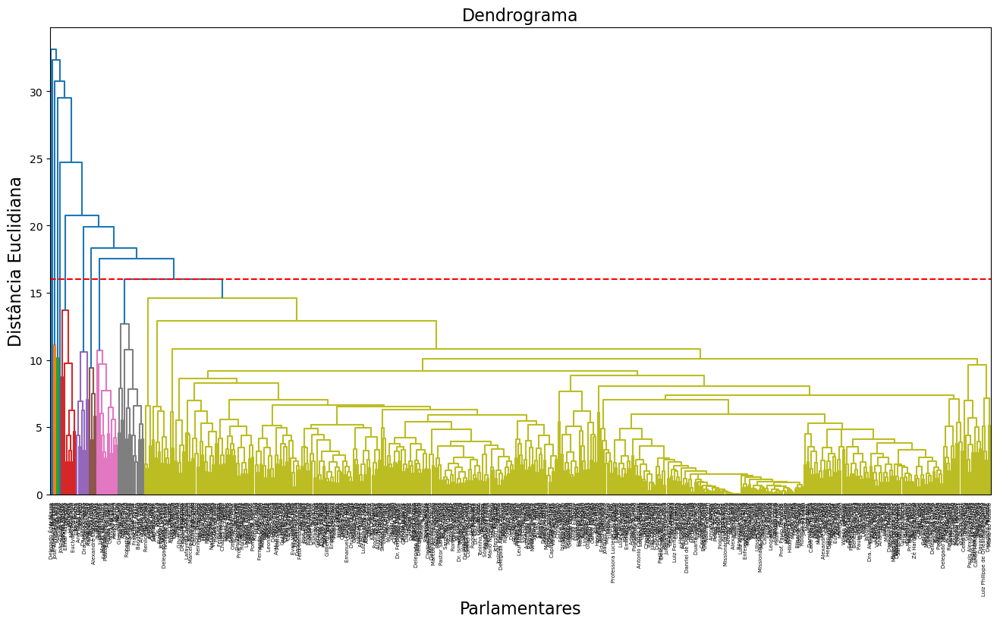

In [308]:
""" 3
Cluster hierárquico aglomerativo: 
 distância: EUCLIDIANA 
método encademaento: COMPLETE linkage

""" 
#%% Cluster hierárquico aglomerativo: distância euclidiana + complete linkage

# Gerando o dendrograma
## Distância euclidiana e método de encadeamento complete linkage

plt.figure(figsize=(16,8))
dend_compl = sch.linkage(df_quanti_pad,
                         method = 'complete', 
                         metric = 'euclidean')
y_linha_threshold = 16
dendrogram_c = sch.dendrogram(dend_compl, 
                              color_threshold = y_linha_threshold, 
                              labels = list(df_agrup_preliminar['txNomeParlamentar'])
                                )

plt.title('Dendrograma', fontsize=16)
plt.xlabel('Parlamentares', fontsize=16)
plt.ylabel('Distância Euclidiana', fontsize=16)
plt.axhline(y = y_linha_threshold, 
            color = 'red', linestyle = '--')
plt.show()



Ainda Nao conseguimos visualizar o padrao de aglomeraçao.
As observaçoes estao muito proximas entre elas.
Unões acontecem em diastancias baixas.

In [ ]:
# Gerando o dendrograma
plt.figure(figsize=(16,8))
dend_compl = sch.linkage(
    df_quanti_pad,
    method='complete',
    metric='euclidean'
)
y_linha_threshold = 16 # Ajustado para o exemplo
dendrogram_c = sch.dendrogram(
    dend_compl,
    color_threshold=y_linha_threshold,
    labels=list(df_agrup_preliminar['txNomeParlamentar'])
)

plt.title('Dendrograma', fontsize=16)
plt.xlabel('Parlamentares', fontsize=16)
plt.ylabel('Distância Euclidiana', fontsize=16)
plt.axhline(y=y_linha_threshold, color='red', linestyle='--')

# --- Trecho para adicionar as linhas verticais ---

# Obtém a lista de ticks do eixo X
num_ticks = len(plt.xticks()[0]) 
# Ajusta o passo. O dendrograma usa um espaçamento de 10 no eixo X, então ajustamos o passo.
passo = num_ticks // 5

# Desenha as linhas verticais em 5 posições
for i in range(1, 5):
    plt.axvline(x=i * passo, color='black', linestyle='--', linewidth=0.8)

# --- Fim do trecho ---

plt.show()

In [ ]:
# --- Visualização com Zoom ---

plt.figure(figsize=(16, 8))
dendrogram_s_zoom = sch.dendrogram(
    dend_sing,
    color_threshold=y_linha,
    labels=list(df_agrup_preliminar['txNomeParlamentar'])
)

# Calcula o limite do eixo X para os primeiros 20% dos casos
num_casos = len(df_quanti_pad)
limite_x = num_casos * 0.2
 
# Aplica o zoom no eixo X
plt.xlim(0, limite_x * 10) # Multiplica por 10 pois o espaçamento no eixo x é de 10
plt.title('Dendrograma com Zoom (Primeiros 20% dos Casos)', fontsize=16)
plt.xlabel('Parlamentares', fontsize=16)
plt.ylabel('Distância Euclidiana', fontsize=16)
plt.axhline(y= y_linha_threshold, color='red', linestyle='--')
plt.show()

In [ ]:
""" # Gerando a variável com a indicação do cluster no dataset

cluster_comp = AgglomerativeClustering(n_clusters = 8,
                                       metric = 'euclidean',
                                       linkage = 'complete')
indica_cluster_comp = cluster_comp.fit_predict(df_quanti_pad)

df_agrup_preliminar['cluster_agg_euc_compl'] = indica_cluster_comp
df_agrup_preliminar['cluster_agg_euc_compl'] = df_agrup_preliminar['cluster_agg_euc_compl'].astype('category')

# Coeficientes do esquema hierárquico de aglomeração (complete)
#coef_complete = [y[1] for y in dendrogram_c['dcoord']]
#print(coef_complete)

### 3.3.2
<div style="background-color:rgb(255, 219, 88); padding: 10px;">
  <span style="font-size:14px; font-weight:bold;">3.3.2 -  Clusterizaçao hierarquica  aglomerativa  - Distancia Manhattan</span>
</div>


In [ ]:
# Muito dificil visualizar com aierarquica, com muitos registros.

In [ ]:
"""  4
Cluster hierárquico aglomerativo: 
 distância:  CITIBLOCK (MANHATTAN)
método encademaento: single linkage

""" 
# Visualizando as distâncias
dist_manhattan= pdist(df_quanti_pad, 
                        metric='cityblock') 

# Opções para as distâncias ("metric"):
    ## euclidean
    ## sqeuclidean
    ## cityblock (Manhattan)
    ## chebyshev
    ## canberra
    ## correlation

# Gerando o dendrograma
## Distância euclidiana e método de encadeamento single linkage

plt.figure(figsize=(16,8))
dend_sing = sch.linkage(df_quanti_pad, 
                        method = 'single', 
                        metric = 'cityblock') #gerar clusterizaçao aglomerativa
y_linha=25
dendrogram_s = sch.dendrogram(dend_sing,
                              color_threshold = y_linha, 
                              labels = list(df_agrup_preliminar['txNomeParlamentar'])  
                             )

plt.title('Dendrograma', fontsize=16)
plt.xlabel('Parlamentares', fontsize=16)

plt.ylabel('Distância Manhattan', fontsize=16)
plt.axhline(y = y_linha,
            color = 'red', linestyle = '--')
plt.show()

# Opções para o método de encadeamento ("method"):
    ## single
    ## complete
    ## average

# Opções para as distâncias ("metric"):
    ## euclidean
    ## sqeuclidean
    ## cityblock
    ## chebyshev
    ## canberra
    ## correlation

In [ ]:
"""
#Como já imaginado, há muitas observaçoes para     
# Como já observamos 4 clusters no dendrograma, vamos selecionar "4" clusters
# A medida de distância e o método de encadeamento são mantidos

cluster_sing = AgglomerativeClustering(n_clusters = 4, 
                                       metric = 'cityblock', 
                                       linkage = 'single')

indica_cluster_sing = cluster_sing.fit_predict(df_quanti_pad)

df_agrup_preliminar['cluster_agg_manh_single'] = indica_cluster_sing
df_agrup_preliminar['cluster_agg_manh_single'] = df_agrup_preliminar['cluster_agg_manh_single'].astype('category')

# Coeficientes do esquema hierárquico de aglomeração (single)
coef_single = [y[1] for y in dendrogram_s['dcoord']]
#print(coef_single)

"""

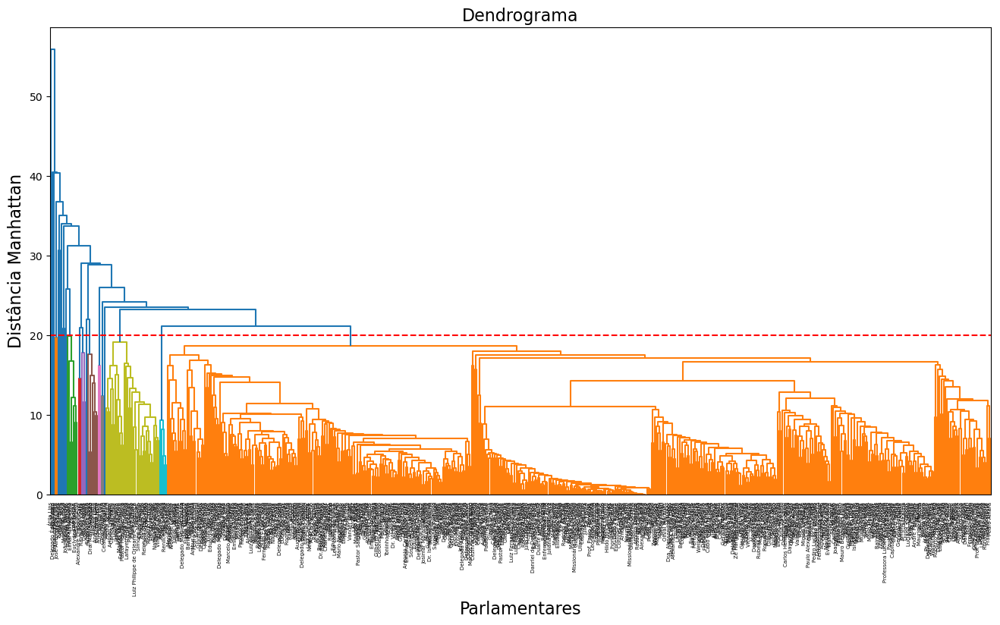

In [259]:
""" 5
Cluster hierárquico aglomerativo: 
 distância:  CITIBLOCK (MANHATTAN)
método encademaento: Average linkage

""" 
# Gerando o dendrograma
## Distância Manhattan ( ou Cityblock) e método de encadeamento complete linkage

plt.figure(figsize=(16,8))
dend_compl = sch.linkage(df_quanti_pad,
                         method = 'average', 
                         metric = 'cityblock')
y_linha_threshold = 20
dendrogram_c = sch.dendrogram(dend_compl, 
                              color_threshold = y_linha_threshold, 
                              labels = list(df_agrup_preliminar['txNomeParlamentar'])
                                )

plt.title('Dendrograma', fontsize=16)
plt.xlabel('Parlamentares', fontsize=16)
plt.ylabel('Distância Manhattan', fontsize=16)
plt.axhline(y = y_linha_threshold, 
            color = 'red', linestyle = '--')
plt.show()


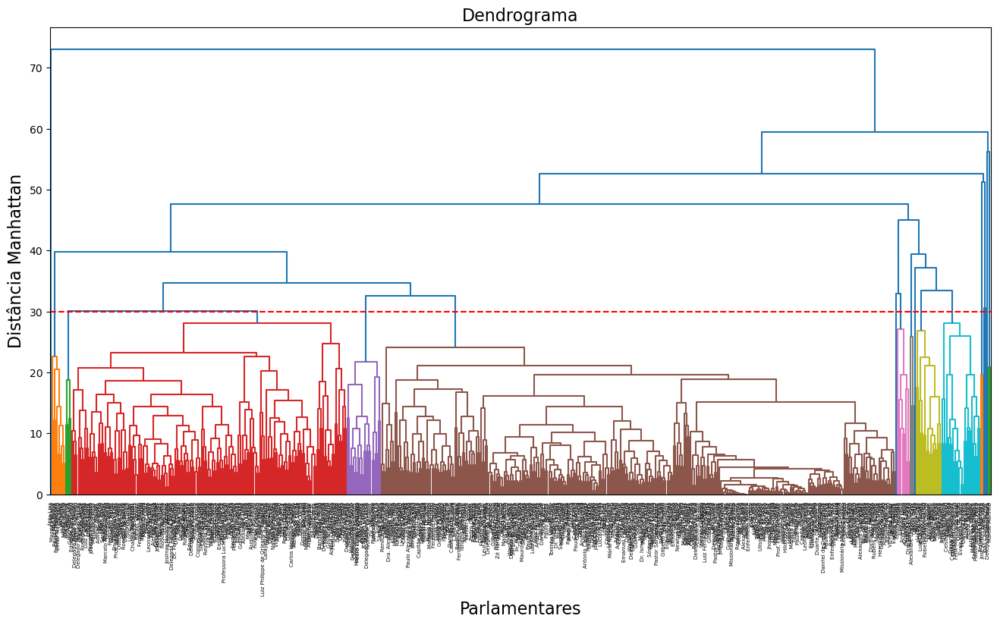

In [309]:
""" 6
Cluster hierárquico aglomerativo: 
 distância:  CITIBLOCK (MANHATTAN)
método encademaento: complete linkage

""" 
# Gerando o dendrograma
## Distância Distância Manhattan ( ou Cityblock)  e método de encadeamento complete linkage

plt.figure(figsize=(16,8))
dend_compl = sch.linkage(df_quanti_pad,
                         method = 'complete', 
                         metric = 'cityblock')
y_linha_threshold = 30
dendrogram_c = sch.dendrogram(dend_compl, 
                              color_threshold = y_linha_threshold, 
                              labels = list(df_agrup_preliminar['txNomeParlamentar'])
                                )

plt.title('Dendrograma', fontsize=16)
plt.xlabel('Parlamentares', fontsize=16)
plt.ylabel('Distância Manhattan', fontsize=16)
plt.axhline(y = y_linha_threshold, 
            color = 'red', linestyle = '--')
plt.show()


In [ ]:


# Gerando o dendrograma
## Distância euclidiana e método de encadeamento complete linkage

plt.figure(figsize=(16,8))
dend_compl = sch.linkage(df_quanti_pad,
                         method = 'complete', 
                         metric = 'cityblock')
y_linha_threshold = 45
dendrogram_c = sch.dendrogram(dend_compl, 
                              color_threshold = y_linha_threshold, 
                              labels = list(df_agrup_preliminar['txNomeParlamentar'])
                                )

plt.title('Dendrograma', fontsize=16)
plt.xlabel('Parlamentares', fontsize=16)
plt.ylabel('Distância Manhattan', fontsize=16)
plt.axhline(y = y_linha_threshold, 
            color = 'red', linestyle = '--')
plt.show()



In [ ]:

"""
#Como já imaginado, há muitas observaçoes      
# Como já observamos 4 clusters no dendrograma, vamos selecionar "4" clusters
# A medida de distância e o método de encadeamento são mantidos

cluster_sing = AgglomerativeClustering(n_clusters = 7, 
                                       metric = 'cityblock', 
                                       linkage = 'complete')

indica_cluster_sing = cluster_sing.fit_predict(df_quanti_pad)

df_agrup_preliminar['cluster_agg_manh_comp'] = indica_cluster_sing
df_agrup_preliminar['cluster_agg_manh_comp'] = df_agrup_preliminar['cluster_agg_manh_comp'].astype('category')

# Coeficientes do esquema hierárquico de aglomeração (single)
coef_single = [y[1] for y in dendrogram_s['dcoord']]
#print(coef_single)

"""

### 3.3.3
<div style="background-color:rgb(255, 219, 88); padding: 10px;">
  <span style="font-size:14px; font-weight:bold;">3.3.3 -  Clusterizaçao hierarquica  aglomerativa  - Distancia Chebichev</span>
</div>


In [ ]:
"""  7
Cluster hierárquico aglomerativo: 
 distância: chebichev
método encademaento: single linkage

""" 
# Visualizando as distâncias
dist_manhattan= pdist(df_quanti_pad, 
                        metric='cityblock') 

# Opções para as distâncias ("metric"):
    ## euclidean
    ## sqeuclidean
    ## cityblock (Manhattan)
    ## chebyshev
    ## canberra
    ## correlation

# Gerando o dendrograma


plt.figure(figsize=(16,8))
dend_sing = sch.linkage(df_quanti_pad, 
                        method = 'single', 
                        metric = 'chebyshev') #gerar clusterizaçao aglomerativa
y_linha=10
dendrogram_s = sch.dendrogram(dend_sing,
                              color_threshold = y_linha, 
                              labels = list(df_agrup_preliminar['txNomeParlamentar'])  
                             )

plt.title('Dendrograma', fontsize=16)
plt.xlabel('Parlamentares', fontsize=16)

plt.ylabel('Distância Chebyshev', fontsize=16)
plt.axhline(y = y_linha,
            color = 'red', linestyle = '--')
plt.show()

# Opções para o método de encadeamento ("method"):
    ## single
    ## complete
    ## average

# Opções para as distâncias ("metric"):
    ## euclidean
    ## sqeuclidean
    ## cityblock
    ## chebyshev
    ## canberra
    ## correlation


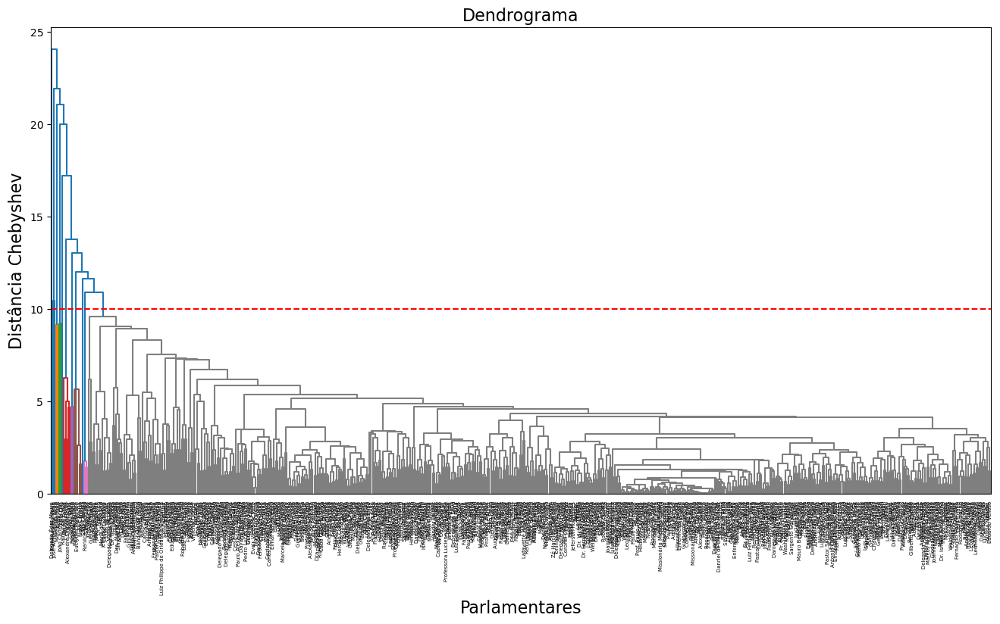

In [311]:
"""  8
Cluster hierárquico aglomerativo: 
 distância: chebichev
método encademaento: COMPLETE linkage

""" 
# Visualizando as distâncias
dist_manhattan= pdist(df_quanti_pad, 
                        metric='chebyshev') 

# Opções para as distâncias ("metric"):
    ## euclidean
    ## sqeuclidean
    ## cityblock (Manhattan)
    ## chebyshev
    ## canberra
    ## correlation

# Gerando o dendrograma


plt.figure(figsize=(16,8))
dend_compl = sch.linkage(df_quanti_pad, 
                        method = 'complete', 
                        metric = 'chebyshev') #gerar clusterizaçao aglomerativa
y_linha=10
dendrogram_s = sch.dendrogram(dend_compl,
                              color_threshold = y_linha, 
                              labels = list(df_agrup_preliminar['txNomeParlamentar'])  
                             )

plt.title('Dendrograma', fontsize=16)
plt.xlabel('Parlamentares', fontsize=16)

plt.ylabel('Distância Chebyshev', fontsize=16)
plt.axhline(y = y_linha,
            color = 'red', linestyle = '--')
plt.show()

# Opções para o método de encadeamento ("method"):
    ## single
    ## complete
    ## average

# Opções para as distâncias ("metric"):
    ## euclidean
    ## sqeuclidean
    ## cityblock
    ## chebyshev
    ## canberra
    ## correlation


## 3.4
<div style="background-color:lightblue; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;">3.4 K-means</span>
</div>


#### Obs: Distancia euclidiana apenas



#### setup

Objetivo: Dividir os dados em K grupos com base na proximidade dos pontos ao centro de cada grupo (centroides).

Como funciona:
 - Você escolhe o número de clusters (K).
 - O algoritmo posiciona K centroides aleatoriamente.
 - Cada ponto é atribuído ao centro mais próximo.
 - Os centroides são recalculados com base nos pontos atribuídos.
 - Repete até os centroides estabilizarem.

Aplicações comuns:
- Segmentação de clientes por comportamento de compra.
- Agrupamento de documentos por tema.


Vantagens:
- Simples e rápido.
- Funciona bem com grandes volumes de dados.

Limitações:
- Precisa definir K previamente.
- Sensível a outliers.
- Assume que os clusters são esféricos e de tamanho semelhante.

In [223]:
len(df['txNomeParlamentar'].unique() )

632

In [224]:
## import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.cluster.hierarchy as sch
import scipy.stats as stats
from scipy.stats import zscore
from scipy.spatial.distance import pdist
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
import pingouin as pg
import plotly.express as px 
import plotly.io as pio
pio.renderers.default='browser'
import prince
from scipy.stats import chi2_contingency
import statsmodels.api as sm
from sklearn.metrics import silhouette_score


### 3.4.1

<div style="background-color:rgb(255, 219, 88); padding: 10px;">
  <span style="font-size:14px; font-weight:bold;">3.4.1 -  Determinaçao do nro de clusters do K-means - Método do cotovelo</span>
</div>


#### ----

In [ ]:
elbow = []
K = range(1,21) # ponto de parada pode ser parametrizado manualmente
for k in K:
    kmeanElbow = KMeans(n_clusters=k,
                        init='random', 
                        random_state=100).fit(df_quanti_pad)
    
    elbow.append(kmeanElbow.inertia_)
    
plt.figure(figsize=(16,8))
plt.plot(K, elbow, marker='o')
plt.xlabel('Nº Clusters', fontsize=16)
plt.xticks(K) # ajustar range
plt.ylabel('WCSS', fontsize=16)
plt.title('Método de Elbow', fontsize=16)
plt.show()


In [ ]:
elbow = []
cauda_wcss = [] # Lista para armazenar a queda de WCSS

K = range(1,30)
for k in K:
    kmeanElbow = KMeans(n_clusters=k, init='random', random_state=100, n_init='auto').fit(df_quanti_pad)
    elbow.append(kmeanElbow.inertia_)
    
    # Calcular a queda do WCSS
    if k > 1:
        queda = elbow[k-2] - elbow[k-1]
        cauda_wcss.append(queda)
        print(f"Queda do WCSS de {k-1} para {k} clusters: {queda:.2f}")

# ---
# Plotagem do método de Elbow
plt.figure(figsize=(10,8))
plt.plot(K, elbow, marker='o')
plt.xlabel('Nº Clusters', fontsize=16)
plt.xticks(K)
plt.ylabel('WCSS', fontsize=16)
plt.title('Método de Elbow', fontsize=16)
plt.show()

# Opcional: Plotar a queda do WCSS
plt.figure(figsize=(16,8))
plt.plot(K[1:], cauda_wcss, marker='o')
plt.xlabel('Nº Clusters', fontsize=16)
plt.xticks(K[1:])
plt.ylabel('Queda do WCSS', fontsize=16)
plt.title('Análise da Queda do WCSS', fontsize=16)
plt.grid(True)
plt.show()

#### elbow com queda de wcss

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have

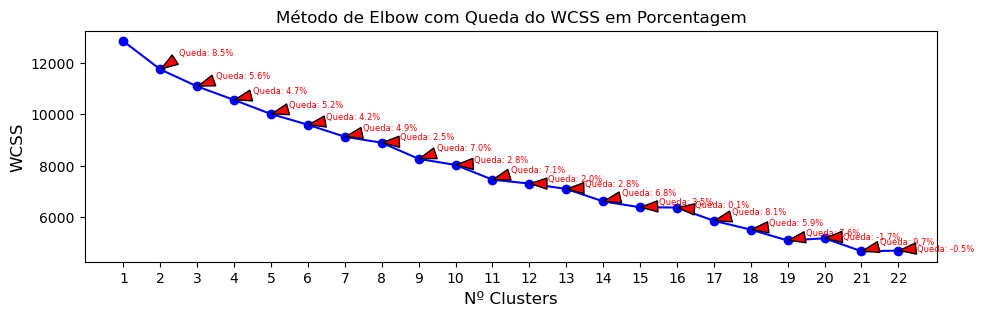

In [225]:
# ---
elbow = []
K = range(1, 23)

for k in K:
    kmeanElbow = KMeans(n_clusters=k, init='random', random_state=100, n_init='auto').fit(df_quanti_pad)
    elbow.append(kmeanElbow.inertia_)

# ---
# Plotagem do método de Elbow com anotações de queda em porcentagem
plt.figure(figsize=(11, 3))
plt.plot(K, elbow, marker='o', linestyle='-', color='b')
plt.xlabel('Nº Clusters', fontsize=12)  # Fonte menor para o eixo X
plt.xticks(K)
plt.ylabel('WCSS', fontsize=12)  # Fonte menor para o eixo Y
plt.title('Método de Elbow com Queda do WCSS em Porcentagem', fontsize=12)  # Fonte menor para o título
#plt.grid(True)

# Adicionar as anotações de queda em porcentagem
for i in range(1, len(elbow)):
    # Calcular a queda absoluta
    queda_absoluta = elbow[i-1] - elbow[i]
    # Calcular a queda em porcentagem
    queda_porcentagem = (queda_absoluta / elbow[i-1]) * 100
    
    # Posição da anotação
    x_pos = K[i]
    y_pos = elbow[i] + (elbow[i-1] - elbow[i]) / 2
    
    # Texto da anotação
    texto_anotacao = f"Queda: {queda_porcentagem:.1f}%"
    
    # Adicionar a anotação com uma seta
    plt.annotate(
        texto_anotacao,
        xy=(K[i], elbow[i]),
        xytext=(x_pos + 0.5, y_pos),
        arrowprops=dict(facecolor='red', shrink=0.05, width=1.5, headwidth=8),
        fontsize=6,  # Fonte menor para o texto da anotação
        color='red'
    )


C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have

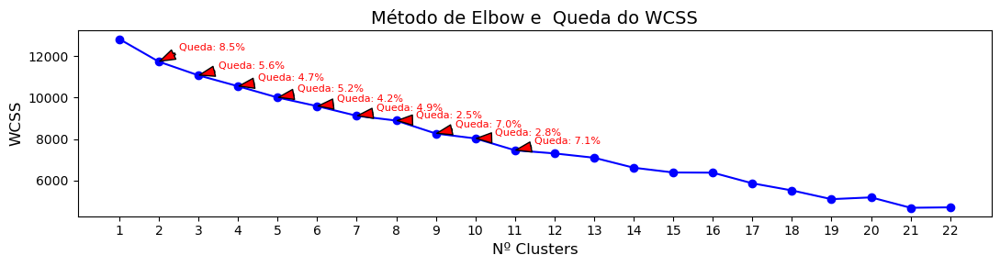

In [231]:
# --- CONFIGURAÇÃO DA ANÁLISE (K = 1 a 22) ---

K_MAX = 23
elbow = []
K = range(1, K_MAX) 

# Índice limite para anotações: K=11. Como K começa em 1, o índice é 11.
LIMITE_ANOTACAO = 11

# --- EXECUÇÃO DO K-MEANS PARA ELBOW ---
# NOTE: df_quanti_pad deve estar definido no seu ambiente.
for k in K:
    # O n_init='auto' é um bom padrão no scikit-learn
    kmeanElbow = KMeans(n_clusters=k, init='random', random_state=100, n_init='auto').fit(df_quanti_pad)
    elbow.append(kmeanElbow.inertia_)

# --- PLOTAGEM DO MÉTODO DE ELBOW COM ANOTAÇÕES LIMITADAS ---

plt.figure(figsize=(11, 3))
plt.plot(K, elbow, marker='o', linestyle='-', color='b')
plt.xlabel('Nº Clusters', fontsize=12)
# Exibe todos os ticks gerados (até 22)
plt.xticks(K) 
plt.ylabel('WCSS', fontsize=12)
plt.title('Método de Elbow e  Queda do WCSS', fontsize=14) 

# Adicionar as anotações de queda em porcentagem APENAS ATÉ O CLUSTER 11
# O loop vai de i=1 (Cluster 2) até o índice LIMITE_ANOTACAO (Cluster 11)
for i in range(1, LIMITE_ANOTACAO):
    
    # Calcular a queda absoluta
    queda_absoluta = elbow[i-1] - elbow[i]
    # Calcular a queda em porcentagem
    queda_porcentagem = (queda_absoluta / elbow[i-1]) * 100
    
    # Posição da anotação
    x_pos = K[i]
    y_pos = elbow[i] + (elbow[i-1] - elbow[i]) / 2 
    
    # Texto da anotação
    texto_anotacao = f"Queda: {queda_porcentagem:.1f}%"
    
    # Adicionar a anotação
    plt.annotate(
        texto_anotacao,
        xy=(K[i], elbow[i]),
        xytext=(x_pos + 0.5, y_pos), 
        arrowprops=dict(facecolor='red', shrink=0.05, width=1.5, headwidth=8),
        fontsize=8, 
        color='red'
    )

plt.tight_layout()
plt.show()


### 3.4.2
<div style="background-color:rgb(255, 219, 88); padding: 10px;">
  <span style="font-size:14px; font-weight:bold;">3.4.2 - Determinaçao do nro de clusters do K-means - Método da Silhueta </span>
</div>

In [ ]:
df_quanti_pad.shape

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have

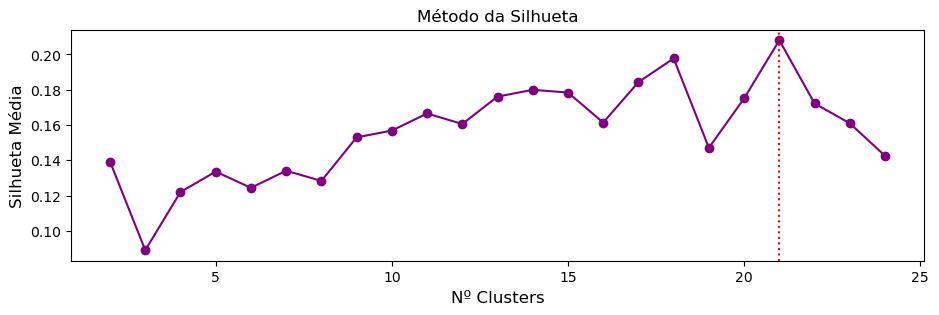

In [314]:
## identificação da quantidade de clusters (Método da Silhueta)
max_clust =24
silhueta = []
I = range(2,max_clust+1) # ponto de parada pode ser parametrizado manualmente
for i in I: 
    kmeansSil = KMeans(n_clusters=i, init='random', random_state=100).fit(df_quanti_pad) 
    silhueta.append(silhouette_score(df_quanti_pad, 
                    kmeansSil.labels_))

plt.figure(figsize=(11,3))

plt.plot(range(2, max_clust+1), silhueta, 
         color = 'purple', 
         marker='o')
plt.xlabel('Nº Clusters', fontsize=12)
plt.ylabel('Silhueta Média', fontsize=12)
plt.title('Método da Silhueta', fontsize=12)
plt.axvline(x = silhueta.index(max(silhueta))+2, 
            linestyle = 'dotted', 
            color = 'red') 
plt.show()

###  Conclusao da etapa 3.4.2




### 3.4.3
<div style="background-color:rgb(255, 219, 88); padding: 10px;">
  <span style="font-size:14px; font-weight:bold;">3.4.3 - Formação de clusters </span>
</div>

#### Geração dos clusters - PArte 1

In [232]:
# %% Cluster K-means

# Vamos considerar 6 clusters, dadas as evidências anteriores!
kmeans_final = KMeans(n_clusters = 18,
                      init = 'random', 
                      random_state=100).fit(df_quanti_pad)

# Gerando a variável para identificarmos os clusters gerados
kmeans_clusters = kmeans_final.labels_

df_agrup_preliminar['Cluster'] = kmeans_clusters
df_quanti_pad['Cluster'] = kmeans_clusters

df_agrup_preliminar['Cluster'] = df_agrup_preliminar['Cluster'].astype('category')
df_quanti_pad['Cluster'] = df_quanti_pad['Cluster'].astype('category')
df_agrup_preliminar.head()

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.



nome_var_categoria_espec,txNomeParlamentar,sgUF,sgPartido,cat_reeleicao,cat_cargo_titusup,flag_lid,genero,vl_alimentacao,vl_assinaturas,vl_comb_aeronaves,...,vl_manut_escritorio,vl_pass_aerea_reembolso,vl_pass_aerea_rpa,vl_pass_aerea_sigepa,vl_pass_ter_mar_flu,vl_servseguranca,vl_taxi_ped_estac,vl_telefonia,vl_tokens,Cluster
0,AJ Albuquerque,CE,PP,Reeleito,Titular,0,H,0.00,0.0,0.0,...,18086.25,29291.60,0.00,108188.97,0.0,0.0,0.0,8289.98,0.0,4
1,Abilio Brunini,MT,PL,Nao_reeleito,Titular,0,H,423.56,0.0,0.0,...,216736.82,0.00,0.00,128132.75,498.0,0.0,30.0,871.69,0.0,6
2,Acácio Favacho,AP,MDB,Reeleito,Titular,0,H,0.00,0.0,0.0,...,8683.10,24170.96,0.00,300021.66,0.0,0.0,0.0,15527.42,0.0,4
3,Adail Filho,AM,REPUBLICANOS,Nao_reeleito,Titular,0,H,0.00,0.0,0.0,...,945.20,0.00,0.00,98508.09,0.0,0.0,0.0,2586.29,0.0,0
4,Adilson Barroso,SP,PL,Nao_reeleito,Suplente,0,H,12068.16,0.0,0.0,...,128140.36,2823.90,37225.49,106966.48,0.0,0.0,21802.1,4743.73,120.0,13


In [ ]:
df_agrup_preliminar['Cluster_op1A'] = df_agrup_preliminar['Cluster'].astype('category')
df_agrup_preliminar_op1A= df_agrup_preliminar.copy()


df_quanti_pad['Cluster_op1A']= df_quanti_pad['Cluster']
df_quanti_pad_op1A = df_quanti_pad.copy()

In [ ]:
# Para opção 1
#df_quanti_pad['Cluster_Opcao1A'] = df_quanti_pad['Cluster'].astype('category')


#Para opção 2
#df_quanti_pad['Cluster_Opcao1B'] = df_quanti_pad['Cluster'].astype('category')

In [ ]:
df_agrup_preliminar['Cluster'].value_counts()

#### Parte 1  - Resultados

In [ ]:
# info sobre cluster especifico

#df_agrup_preliminar[df_agrup_preliminar['Cluster']==5].sort_values(by=['Cluster', 'cat_reeleicao', 'cat_cargo_titusup', 'sgPartido', 'sgUF'])

In [ ]:
"""
df_agrup_preliminar[['txNomeParlamentar','vl_alimentacao', 'vl_manut_escritorio', 'vl_divulg_ativ',
 'vl_pass_aerea_reembolso',
 'vl_pass_aerea_rpa',
 'vl_pass_aerea_sigepa',
                      'vl_locfret_autom',
                     
 'vl_assinaturas',
 'vl_comb_aeronaves',
 'vl_comb_autom',
 'vl_comb_embarc',
 'vl_comb_semespec',
 'vl_cursos_eventos',

 'vl_hospedagem',
 'vl_locfret_aeronave',

 'vl_locfret_embarc',

 'vl_pass_ter_mar_flu',
 'vl_servseguranca',
 'vl_taxi_ped_estac',
 'vl_telefonia',
 'vl_tokens']]

 """

### 3.4.4
<div style="background-color:rgb(255, 219, 88); padding: 10px;">
  <span style="font-size:14px; font-weight:bold;">3.4.4 - ANOVA - verificação da significânica das variáveis na clusterização </span>
</div>

In [233]:
# ANOVA
# Analisando se as duas variáveis são significativas para a clusterização 
import pingouin as pg

# 1) vl_alimentacao 
pg.anova(dv='vl_alimentacao', 
         between='Cluster', 
         data=df_quanti_pad,
         detailed=True).T



,0,1
Source,Cluster,Within
SS,352.322497,258.677503
DF,17,594
MS,20.724853,0.435484
F,47.590387,NaN
p-unc,0.0,NaN
np2,0.576633,NaN


ambos as variaveis p-valor é zero, menor que meu nivel de significacna. auxilia na formaçao de pelo menos 1 dos clusters.
é uma variavel singificativamente importnate em termos estatisticos para formaçao de pel menos 1 dos clusters. Esles sestao representando a clusterizaçao.
(e a var F)?


In [ ]:
#df_agrup_preliminar.columns

In [ ]:
#colunas_quantitativas

In [234]:
## Vamos montar uma tabela com todos os resultados de estatísticas p e valores da estatistica F
#1. Lista de variaveis da ANOVA
#variaveis_anova = colunas_quantitativas.copy().remove('vl_serv_postais')
variaveis_anova = colunas_quantitativas.copy()


# 2. Crie uma lista vazia para armazenar os resultados
resultados_anova = []

# 3. Itere sobre a lista de variáveis e rode a ANOVA para cada uma
for var in variaveis_anova:
    # Execute a ANOVA
    anova_result = pg.anova(dv=var, 
                            between='Cluster', 
                            data=df_quanti_pad, 
                            detailed=True)
    
    # Selecione apenas a linha onde 'Source' é 'Cluster'
    cluster_row = anova_result.loc[anova_result['Source'] == 'Cluster']
    
    # Extraia os valores de 'F' e 'p-unc'
    f_value = cluster_row['F'].iloc[0]
    p_unc_value = cluster_row['p-unc'].iloc[0]
    
    # Crie um dicionário com os resultados e adicione o nome da variável
    resultado = {
        'Variavel': var,
        'F': f_value,
        'p-unc': p_unc_value
    }
    
    # Adicione o dicionário à lista de resultados
    resultados_anova.append(resultado)


# 4. Concatene a lista de dicionários em um único DataFrame

df_anova_final = pd.DataFrame(resultados_anova)
df_anova_final['p-unc'] = df_anova_final['p-unc'].round(3)

df_anova_final.sort_values(by='F', ascending=False)

,Variavel,F,p-unc
5,vl_comb_semespec,355.934098,0.00
20,vl_tokens,268.827227,0.00
6,vl_cursos_eventos,132.749831,0.00
17,vl_servseguranca,127.036459,0.00
16,vl_pass_ter_mar_flu,112.216302,0.00
1,vl_assinaturas,104.054352,0.00
2,vl_comb_aeronaves,71.703241,0.00
7,vl_divulg_ativ,60.168055,0.00
9,vl_locfret_aeronave,57.304077,0.00
0,vl_alimentacao,47.590387,0.00


In [ ]:
# quanto maior a estatistica F, maior a relevancia da variavel na geraçao de pelo menos 1 dos clusters

In [ ]:
#df_anova_final_opcao_1A = df_anova_final

#### Detalhes de cada resultado ANOVA 

In [236]:

# 2) vl_assinaturas
pg.anova(dv='vl_assinaturas', 
         between='Cluster', 
         data=df_quanti_pad,
         detailed=True).T

,0,1
Source,Cluster,Within
SS,457.404708,153.595292
DF,17,594
MS,26.906159,0.258578
F,104.054352,NaN
p-unc,0.0,NaN
np2,0.748617,NaN


In [237]:
         
# 3) vl_comb_aeronaves
pg.anova(dv='vl_comb_aeronaves',
         between='Cluster',
         data=df_quanti_pad,
         detailed=True).T

,0,1
Source,Cluster,Within
SS,410.810817,200.189183
DF,17,594
MS,24.165342,0.337019
F,71.703241,NaN
p-unc,0.0,NaN
np2,0.672358,NaN


In [238]:
# 4) vl_comb_autom
pg.anova(dv='vl_comb_autom',
         between='Cluster',
         data=df_quanti_pad,
         detailed=True).T

,0,1
Source,Cluster,Within
SS,263.998625,347.001375
DF,17,594
MS,15.529331,0.584177
F,26.583245,NaN
p-unc,0.0,NaN
np2,0.432076,NaN


In [239]:
# 5) vl_comb_embarc
pg.anova(dv='vl_comb_embarc',
         between='Cluster',
         data=df_quanti_pad,
         detailed=True).T


,0,1
Source,Cluster,Within
SS,191.792469,419.207531
DF,17,594
MS,11.28191,0.705737
F,15.986007,NaN
p-unc,0.0,NaN
np2,0.313899,NaN


In [235]:


         



# 6) vl_comb_semespec
pg.anova(dv='vl_comb_semespec',
         between='Cluster',
         data=df_quanti_pad,
         detailed=True).T
         
# 7) vl_cursos_eventos
pg.anova(dv='vl_cursos_eventos',
         between='Cluster',
         data=df_quanti_pad,
         detailed=True).T

# 8) vl_divulg_ativ
pg.anova(dv='vl_divulg_ativ',
         between='Cluster',
         data=df_quanti_pad,
         detailed=True).T

# 9) vl_hospedagem
pg.anova(dv='vl_hospedagem',
         between='Cluster',
         data=df_quanti_pad,
         detailed=True).T

# 10) vl_locfret_aeronave
pg.anova(dv='vl_locfret_aeronave',
         between='Cluster',
         data=df_quanti_pad,
         detailed=True).T

# 11) vl_locfret_autom
pg.anova(dv='vl_locfret_autom',
         between='Cluster',
         data=df_quanti_pad,
         detailed=True).T

# 12) vl_locfret_embarc
pg.anova(dv='vl_locfret_embarc',
         between='Cluster',
         data=df_quanti_pad,
         detailed=True).T

# 13) vl_manut_escritorio
pg.anova(dv='vl_manut_escritorio',
         between='Cluster',
         data=df_quanti_pad,
         detailed=True).T

# 14) vl_pass_aerea_reembolso
pg.anova(dv='vl_pass_aerea_reembolso',
         between='Cluster',
         data=df_quanti_pad,
         detailed=True).T

# 15) vl_pass_aerea_rpa
pg.anova(dv='vl_pass_aerea_rpa',
         between='Cluster',
         data=df_quanti_pad,
         detailed=True).T

# 16) vl_pass_aerea_sigepa
pg.anova(dv='vl_pass_aerea_sigepa',
         between='Cluster',
         data=df_quanti_pad,
         detailed=True).T

# 17) vl_pass_ter_mar_flu
pg.anova(dv='vl_pass_ter_mar_flu',
         between='Cluster',
         data=df_quanti_pad,
         detailed=True).T

# 18) vl_servseguranca
pg.anova(dv='vl_servseguranca',
         between='Cluster',
         data=df_quanti_pad,
         detailed=True).T

# 19) vl_taxi_ped_estac
pg.anova(dv='vl_taxi_ped_estac',
         between='Cluster',
         data=df_quanti_pad,
         detailed=True).T

# 20) vl_telefonia
pg.anova(dv='vl_telefonia',
         between='Cluster',
         data=df_quanti_pad,
         detailed=True).T

# 21) vl_tokens
pg.anova(dv='vl_tokens',
         between='Cluster',
         data=df_quanti_pad,
         detailed=True).T


,0,1
Source,Cluster,Within
SS,540.719291,70.280709
DF,17,594
MS,31.807017,0.118318
F,268.827227,NaN
p-unc,0.0,NaN
np2,0.884974,NaN


### 3.4.5
<div style="background-color:rgb(255, 219, 88); padding: 10px;">
  <span style="font-size:14px; font-weight:bold;">3.4.5 - Gráficos dos clusters</span>
</div>

In [244]:
import plotly.express as px
import plotly.offline as py
from plotly.colors import qualitative # Importe as paletas de cores do Plotly


In [245]:
colunas_quantitativas_2

NameError: name 'colunas_quantitativas_2' is not defined

In [246]:
# Perspectiva 1   - 3 vriaveis mais volumosas no geral
ordem_dos_clusters = [str(c) for c in range(18)]

cores_personalizadas = qualitative.Light24


fig = px.scatter_3d(
    df_agrup_preliminar,
    x='vl_divulg_ativ',
    y='vl_locfret_autom',
    z='vl_pass_aerea_sigepa',
    color='Cluster',
    title='Perspectiva 1',
    color_discrete_sequence=cores_personalizadas,
    
    # --- PARÂMETRO CHAVE PARA FORÇAR A ORDEM ---
    category_orders={"Cluster": ordem_dos_clusters}
)

fig.update_traces(marker=dict(size=4))
fig.show()



In [ ]:
#df_quanti_pad

In [250]:
# Perspectiva 2 - 3 variaveis com maior valor de F
ordem_dos_clusters = [str(c) for c in range(18)]
cores_personalizadas = qualitative.Light24

fig = px.scatter_3d(
    df_agrup_preliminar,
    x='vl_comb_semespec',
    y='vl_tokens',
    z='vl_comb_embarc',
    color='Cluster',
    title='Perspectiva 2',
    color_discrete_sequence=cores_personalizadas,
    
    # --- PARÂMETRO CHAVE PARA FORÇAR A ORDEM ---
    category_orders={"Cluster": ordem_dos_clusters}
)

fig.update_traces(marker=dict(size=4))
fig.show()

In [242]:
# Perspectiva 3
ordem_dos_clusters = [str(c) for c in range(18)]
cores_personalizadas = qualitative.Light24

fig = px.scatter_3d(
    df_agrup_preliminar,
                    x='vl_divulg_ativ', 
                    y='vl_locfret_autom', 
                    z='vl_comb_autom',
    color='Cluster',
    title='Perspectiva 3',
    color_discrete_sequence=cores_personalizadas,
    
    # --- PARÂMETRO CHAVE PARA FORÇAR A ORDEM ---
    category_orders={"Cluster": ordem_dos_clusters})


fig.update_traces(marker=dict(size=4))
fig.show()



NameError: name 'qualitative' is not defined

In [243]:
# Perspectiva 4
ordem_dos_clusters = [str(c) for c in range(18)]
cores_personalizadas = qualitative.Light24

fig = px.scatter_3d(
    df_agrup_preliminar,
                    x='vl_divulg_ativ', 
                    y='vl_locfret_autom', 
                    z='vl_manut_escritorio',
    color='Cluster',
    title='Perspectiva 4',
    color_discrete_sequence=cores_personalizadas,
    
    # --- PARÂMETRO CHAVE PARA FORÇAR A ORDEM ---
    category_orders={"Cluster": ordem_dos_clusters})


fig.update_traces(marker=dict(size=4))
fig.show()



NameError: name 'qualitative' is not defined

In [ ]:
df_anova_final_op1A = df_anova_final.copy()

df_agrup_preliminar['Cluster_op1A'] = df_agrup_preliminar['Cluster'].astype('category')

df_agrup_preliminar_op1A= df_agrup_preliminar.copy()

df_quanti_pad['Cluster_op1A']= df_quanti_pad['Cluster']
df_quanti_pad_op1A = df_quanti_pad.copy()

## 
<div style="background-color:yellow; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;"> ------------------------------------------------------------  </span>
</div>


<div style="background-color:yellow; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;"> ------------------------------------------------------------  </span>
</div>

## 3.10
## opção 1B - apenas k=5 clusters e 6 variaveis quanti - todo o periodo


#### Preparacao 

In [315]:
#Parte 1
df_agrupado = df.groupby(['txNomeParlamentar', 'sgUF', 'sgPartido', 
                          'cat_reeleicao','cat_cargo_titusup' , 'flag_lid', 'genero','desc_Subcota_Espec'])['vlrLiquido'].sum().reset_index()
df_agrupado.head()


,txNomeParlamentar,sgUF,sgPartido,cat_reeleicao,cat_cargo_titusup,flag_lid,genero,desc_Subcota_Espec,vlrLiquido
0,AJ Albuquerque,CE,PP,Reeleito,Titular,0,H,COMBUSTÍVEIS E LUBRIFICANTES - Veículos Automo...,83607.29
1,AJ Albuquerque,CE,PP,Reeleito,Titular,0,H,DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR,155300.00
2,AJ Albuquerque,CE,PP,Reeleito,Titular,0,H,"HOSPEDAGEM ,EXCETO DO PARLAMENTAR NO DISTRITO ...",40046.00
3,AJ Albuquerque,CE,PP,Reeleito,Titular,0,H,LOCAÇÃO OU FRETAMENTO DE AERONAVES,30000.00
4,AJ Albuquerque,CE,PP,Reeleito,Titular,0,H,LOCAÇÃO OU FRETAMENTO DE VEÍCULOS AUTOMOTORES,258713.00


In [316]:

# --- ETAPA 3: Adicionar a nova coluna 'nome_var_categoria_espec' ---
# Mapeamento fornecido para criar a nova coluna

mapeamento_categorias = {
    'AQUISIÇÃO DE TOKENS E CERTIFICADOS DIGITAIS': 'vl_tokens',
    'ASSINATURA DE PUBLICAÇÕES': 'vl_assinaturas',
    'COMBUSTÍVEIS E LUBRIFICANTES - Veículos Automotores': 'vl_comb_autom',
    'COMBUSTÍVEIS E LUBRIFICANTES - Embarcações': 'vl_comb_embarc',
    'COMBUSTÍVEIS E LUBRIFICANTES - Aeronaves': 'vl_comb_aeronaves',
    'COMBUSTÍVEIS E LUBRIFICANTES - Sem Especificações': 'vl_comb_semespec',
    'DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR': 'vl_divulg_ativ',
    'FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR': 'vl_alimentacao',
    'HOSPEDAGEM ,EXCETO DO PARLAMENTAR NO DISTRITO FEDERAL': 'vl_hospedagem',
    'LOCAÇÃO OU FRETAMENTO DE AERONAVES': 'vl_locfret_aeronave',
    'LOCAÇÃO OU FRETAMENTO DE VEÍCULOS AUTOMOTORES': 'vl_locfret_autom',
    'LOCAÇÃO OU FRETAMENTO DE EMBARCAÇÕES': 'vl_locfret_embarc',
    'MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE PARLAMENTAR': 'vl_manut_escritorio',
    'PARTICIPAÇÃO EM CURSO, PALESTRA OU EVENTO SIMILAR': 'vl_cursos_eventos',
    'PASSAGEM AÉREA - REEMBOLSO': 'vl_pass_aerea_reembolso',
    'PASSAGEM AÉREA - SIGEPA': 'vl_pass_aerea_sigepa',
    'PASSAGEM AÉREA - RPA': 'vl_pass_aerea_rpa',
    'PASSAGENS TERRESTRES, MARÍTIMAS OU FLUVIAIS': 'vl_pass_ter_mar_flu',
    'SERVIÇO DE SEGURANÇA PRESTADO POR EMPRESA ESPECIALIZADA': 'vl_servseguranca',
    'SERVIÇO DE TÁXI, PEDÁGIO E ESTACIONAMENTO': 'vl_taxi_ped_estac',
    'SERVIÇOS POSTAIS': 'vl_serv_postais',
    'TELEFONIA': 'vl_telefonia'
}

df_agrupado['nome_var_categoria_espec'] = df_agrupado['desc_Subcota_Espec'].map(mapeamento_categorias)




In [317]:

# --- ETAPA 4: Pivotar a coluna 'nome_var_categoria_espec' ---
# Define o índice para o pivot
indices_pivot = [
    'txNomeParlamentar', 
    'sgUF', 
    'sgPartido', 
    'cat_reeleicao',
    'cat_cargo_titusup' ,
    'flag_lid',
    'genero',

]

# Pivota o dataframe. fillna(0) preenche os valores ausentes com 0.
df_agrup_preliminar = df_agrupado.pivot_table(
    index=indices_pivot, 
    columns='nome_var_categoria_espec', 
    values='vlrLiquido', 
    aggfunc='sum'
).reset_index().fillna(0)



In [318]:
#selecao das colunas 
colunas_quantitativas_completa=['vl_alimentacao',
 'vl_assinaturas',
 'vl_comb_aeronaves',
 'vl_comb_autom',
 'vl_comb_embarc',
 'vl_comb_semespec',
 'vl_cursos_eventos',
 'vl_divulg_ativ',
 'vl_hospedagem',
 'vl_locfret_aeronave',
 'vl_locfret_autom',
 'vl_locfret_embarc',
 'vl_manut_escritorio',
 'vl_pass_aerea_reembolso',
 'vl_pass_aerea_rpa',
 'vl_pass_aerea_sigepa',
 'vl_pass_ter_mar_flu',
 'vl_servseguranca',
 'vl_taxi_ped_estac',
 'vl_telefonia',
 'vl_tokens']


colunas_quantitativas_reduzida =  ['vl_divulg_ativ',
'vl_pass_aerea_sigepa',
'vl_locfret_autom',
'vl_manut_escritorio',
'vl_comb_autom',
'vl_hospedagem']

"""
['vl_comb_semespec','vl_comb_embarc','vl_comb_autom',
'vl_divulg_ativ','vl_locfret_autom','vl_pass_aerea_sigepa', 'vl_manut_escritorio']
"""


colunas_quantitativas =  colunas_quantitativas_reduzida.copy()

In [319]:
#Seleção variáveis quantitativas apenas
df_quanti=df_agrup_preliminar[colunas_quantitativas]

# Copie o DataFrame para não alterar o original
df_quanti_pad = df_quanti.copy()


#### teste elbow e silhueta

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have

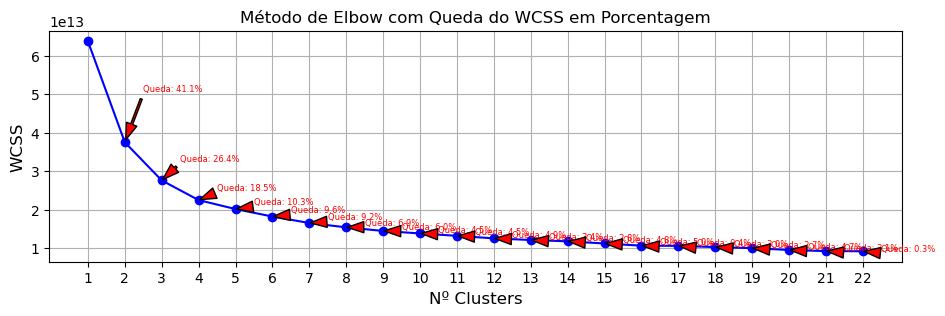

In [320]:
# ---
elbow = []
K = range(1, 23)

for k in K:
    kmeanElbow = KMeans(n_clusters=k, init='random', random_state=100, n_init='auto').fit(df_quanti_pad)
    elbow.append(kmeanElbow.inertia_)

# ---
# Plotagem do método de Elbow com anotações de queda em porcentagem
plt.figure(figsize=(11, 3))
plt.plot(K, elbow, marker='o', linestyle='-', color='b')
plt.xlabel('Nº Clusters', fontsize=12)  # Fonte menor para o eixo X
plt.xticks(K)
plt.ylabel('WCSS', fontsize=12)  # Fonte menor para o eixo Y
plt.title('Método de Elbow com Queda do WCSS em Porcentagem', fontsize=12)  # Fonte menor para o título
plt.grid(True)

# Adicionar as anotações de queda em porcentagem
for i in range(1, len(elbow)):
    # Calcular a queda absoluta
    queda_absoluta = elbow[i-1] - elbow[i]
    # Calcular a queda em porcentagem
    queda_porcentagem = (queda_absoluta / elbow[i-1]) * 100
    
    # Posição da anotação
    x_pos = K[i]
    y_pos = elbow[i] + (elbow[i-1] - elbow[i]) / 2
    
    # Texto da anotação
    texto_anotacao = f"Queda: {queda_porcentagem:.1f}%"
    
    # Adicionar a anotação com uma seta
    plt.annotate(
        texto_anotacao,
        xy=(K[i], elbow[i]),
        xytext=(x_pos + 0.5, y_pos),
        arrowprops=dict(facecolor='red', shrink=0.05, width=1.5, headwidth=8),
        fontsize=6,  # Fonte menor para o texto da anotação
        color='red'
    )



C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have

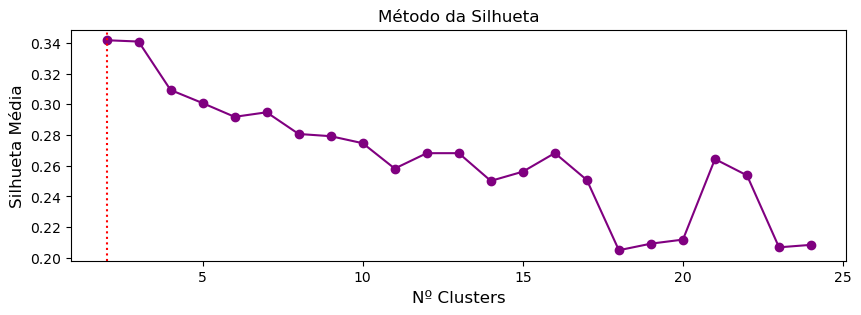

In [321]:

##SILHUETA
## identificação da quantidade de clusters (Método da Silhueta)
max_clust =24
silhueta = []
I = range(2,max_clust+1) # ponto de parada pode ser parametrizado manualmente
for i in I: 
    kmeansSil = KMeans(n_clusters=i, init='random', random_state=100).fit(df_quanti_pad) 
    silhueta.append(silhouette_score(df_quanti_pad, 
                    kmeansSil.labels_))

plt.figure(figsize=(10,3))

plt.plot(range(2, max_clust+1), silhueta, 
         color = 'purple', 
         marker='o')
plt.xlabel('Nº Clusters', fontsize=12)
plt.ylabel('Silhueta Média', fontsize=12)
plt.title('Método da Silhueta', fontsize=12)
plt.axvline(x = silhueta.index(max(silhueta))+2, 
            linestyle = 'dotted', 
            color = 'red') 
plt.show()




#### k-means

In [322]:
# %% Cluster K-means

# Vamos considerar 6 clusters, dadas as evidências anteriores!
kmeans_final = KMeans(n_clusters = 6,
                      init = 'random', 
                      random_state=100).fit(df_quanti_pad)

# Gerando a variável para identificarmos os clusters gerados
kmeans_clusters = kmeans_final.labels_

df_agrup_preliminar['Cluster'] = kmeans_clusters
df_quanti_pad['Cluster'] = kmeans_clusters

df_agrup_preliminar['Cluster'] = df_agrup_preliminar['Cluster'].astype('category')
df_quanti_pad['Cluster'] = df_quanti_pad['Cluster'].astype('category')
df_agrup_preliminar.head()




#==================================================

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.



nome_var_categoria_espec,txNomeParlamentar,sgUF,sgPartido,cat_reeleicao,cat_cargo_titusup,flag_lid,genero,vl_alimentacao,vl_assinaturas,vl_comb_aeronaves,...,vl_manut_escritorio,vl_pass_aerea_reembolso,vl_pass_aerea_rpa,vl_pass_aerea_sigepa,vl_pass_ter_mar_flu,vl_servseguranca,vl_taxi_ped_estac,vl_telefonia,vl_tokens,Cluster
0,AJ Albuquerque,CE,PP,Reeleito,Titular,0,H,0.00,0.0,0.0,...,18086.25,29291.60,0.00,108188.97,0.0,0.0,0.0,8289.98,0.0,2
1,Abilio Brunini,MT,PL,Nao_reeleito,Titular,0,H,423.56,0.0,0.0,...,216736.82,0.00,0.00,128132.75,498.0,0.0,30.0,871.69,0.0,3
2,Acácio Favacho,AP,MDB,Reeleito,Titular,0,H,0.00,0.0,0.0,...,8683.10,24170.96,0.00,300021.66,0.0,0.0,0.0,15527.42,0.0,4
3,Adail Filho,AM,REPUBLICANOS,Nao_reeleito,Titular,0,H,0.00,0.0,0.0,...,945.20,0.00,0.00,98508.09,0.0,0.0,0.0,2586.29,0.0,0
4,Adilson Barroso,SP,PL,Nao_reeleito,Suplente,0,H,12068.16,0.0,0.0,...,128140.36,2823.90,37225.49,106966.48,0.0,0.0,21802.1,4743.73,120.0,4


In [323]:
df_quanti_pad['Cluster_Opcao1B'] = df_quanti_pad['Cluster'].astype('category')


In [324]:
df_agrup_preliminar['Cluster'].value_counts()

Cluster
4    146
2    117
1    111
0     89
5     89
3     60
Name: count, dtype: int64

In [325]:
# info sobre cluster especifico

#df_agrup_preliminar[df_agrup_preliminar['Cluster']==5].sort_values(by=['Cluster', 'cat_reeleicao', 'cat_cargo_titusup', 'sgPartido', 'sgUF'])


In [326]:
#================ ANOVA

## Vamos montar uma tabela com todos os resultados de estatísticas p e valores da estatistica F
#1. Lista de variaveis da ANOVA
#variaveis_anova = colunas_quantitativas.copy().remove('vl_serv_postais')
variaveis_anova = colunas_quantitativas.copy()


# 2. Crie uma lista vazia para armazenar os resultados
resultados_anova = []

# 3. Itere sobre a lista de variáveis e rode a ANOVA para cada uma
for var in variaveis_anova:
    # Execute a ANOVA
    anova_result = pg.anova(dv=var, 
                            between='Cluster', 
                            data=df_quanti_pad, 
                            detailed=True)
    
    # Selecione apenas a linha onde 'Source' é 'Cluster'
    cluster_row = anova_result.loc[anova_result['Source'] == 'Cluster']
    
    # Extraia os valores de 'F' e 'p-unc'
    f_value = cluster_row['F'].iloc[0]
    p_unc_value = cluster_row['p-unc'].iloc[0]
    
    # Crie um dicionário com os resultados e adicione o nome da variável
    resultado = {
        'Variavel': var,
        'F': f_value,
        'p-unc': p_unc_value
    }
    
    # Adicione o dicionário à lista de resultados
    resultados_anova.append(resultado)


# 4. Concatene a lista de dicionários em um único DataFrame

df_anova_final = pd.DataFrame(resultados_anova)
df_anova_final['p-unc'] = df_anova_final['p-unc'].round(3)

df_anova_final.sort_values(by='F', ascending=False)

#============================================================



,Variavel,F,p-unc
0,vl_divulg_ativ,981.019390,0.0
3,vl_manut_escritorio,193.042470,0.0
2,vl_locfret_autom,91.523724,0.0
1,vl_pass_aerea_sigepa,70.979950,0.0
4,vl_comb_autom,44.550259,0.0
5,vl_hospedagem,12.130766,0.0


#### Elbow e Silhueta

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have

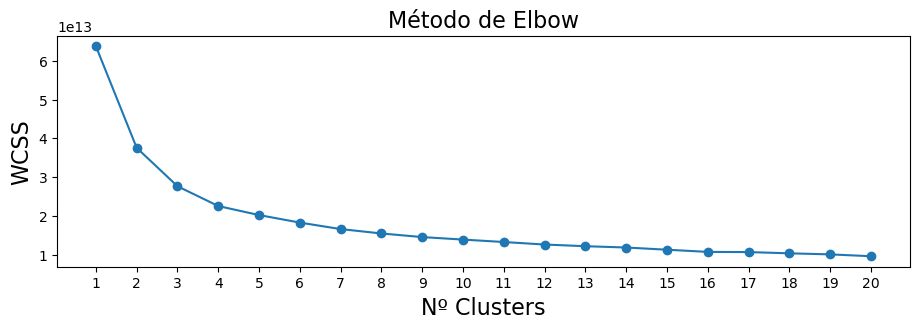

In [327]:
elbow = []
K = range(1,21) # ponto de parada pode ser parametrizado manualmente
for k in K:
    kmeanElbow = KMeans(n_clusters=k,
                        init='random', 
                        random_state=100).fit(df_quanti_pad)
    
    elbow.append(kmeanElbow.inertia_)
    
plt.figure(figsize=(11,3))
plt.plot(K, elbow, marker='o')
plt.xlabel('Nº Clusters', fontsize=16)
plt.xticks(K) # ajustar range
plt.ylabel('WCSS', fontsize=16)
plt.title('Método de Elbow', fontsize=16)
plt.show()


C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have

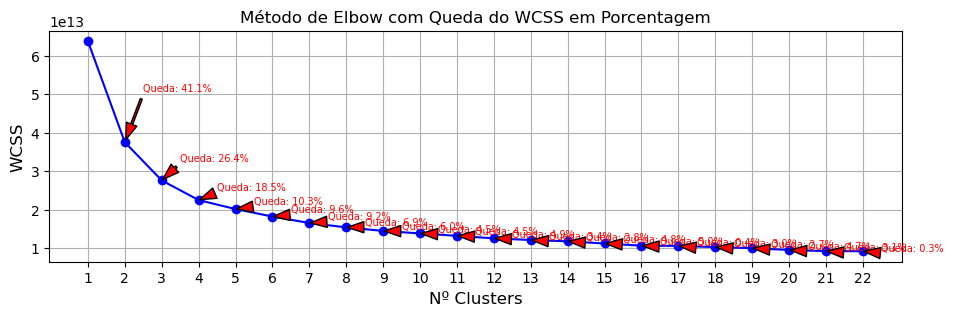

In [328]:
##elbow

# ---
elbow = []
K = range(1, 23)

for k in K:
    kmeanElbow = KMeans(n_clusters=k, init='random', random_state=100, n_init='auto').fit(df_quanti_pad)
    elbow.append(kmeanElbow.inertia_)

# ---
# Plotagem do método de Elbow com anotações de queda em porcentagem
plt.figure(figsize=(11, 3))
plt.plot(K, elbow, marker='o', linestyle='-', color='b')
plt.xlabel('Nº Clusters', fontsize=12)  # Fonte menor para o eixo X
plt.xticks(K)
plt.ylabel('WCSS', fontsize=12)  # Fonte menor para o eixo Y
plt.title('Método de Elbow com Queda do WCSS em Porcentagem', fontsize=12)  # Fonte menor para o título
plt.grid(True)

# Adicionar as anotações de queda em porcentagem
for i in range(1, len(elbow)):
    # Calcular a queda absoluta
    queda_absoluta = elbow[i-1] - elbow[i]
    # Calcular a queda em porcentagem
    queda_porcentagem = (queda_absoluta / elbow[i-1]) * 100
    
    # Posição da anotação
    x_pos = K[i]
    y_pos = elbow[i] + (elbow[i-1] - elbow[i]) / 2
    
    # Texto da anotação
    texto_anotacao = f"Queda: {queda_porcentagem:.1f}%"
    
    # Adicionar a anotação com uma seta
    plt.annotate(
        texto_anotacao,
        xy=(K[i], elbow[i]),
        xytext=(x_pos + 0.5, y_pos),
        arrowprops=dict(facecolor='red', shrink=0.05, width=1.5, headwidth=8),
        fontsize=7,  # Fonte menor para o texto da anotação
        color='red'
    )



C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have

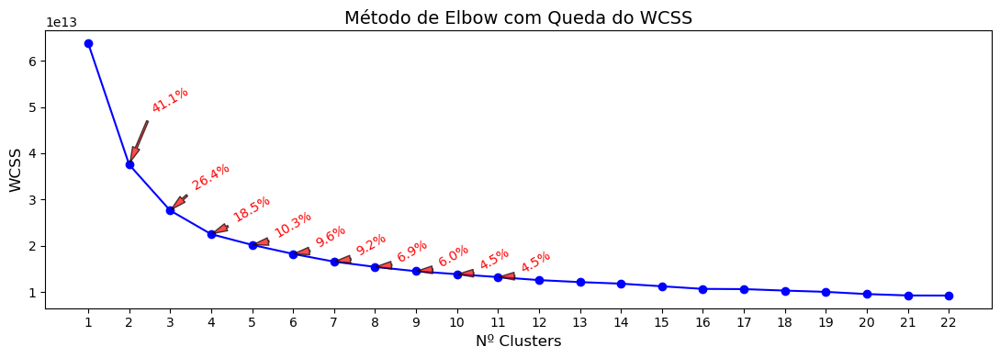

In [340]:
# --- CONFIGURAÇÃO DA ANÁLISE (K = 1 a 22) ---
K_MAX = 23
elbow = []
K = range(1, K_MAX) 

# Limite para as anotações, para focar onde a queda é mais relevante (K=11)
LIMITE_ANOTACAO = 11

# --- EXECUÇÃO DO K-MEANS PARA ELBOW ---
# NOTE: df_quanti_pad deve estar definido no seu ambiente.
for k in K:
    kmeanElbow = KMeans(n_clusters=k, init='random', random_state=100, n_init='auto').fit(df_quanti_pad)
    elbow.append(kmeanElbow.inertia_)

# --- PLOTAGEM DO MÉTODO DE ELBOW COM RÓTULOS ROTACIONADOS ---

plt.figure(figsize=(11, 4)) # Aumentei um pouco o Y para acomodar a rotação
plt.plot(K, elbow, marker='o', linestyle='-', color='b')
plt.xlabel('Nº Clusters', fontsize=12)
plt.xticks(K)
plt.ylabel('WCSS', fontsize=12)
plt.title('Método de Elbow com Queda do WCSS', fontsize=14)
#plt.grid(True, axis='y', linestyle='--', alpha=0.5) # Deixei a grade do eixo Y para referência

# Adicionar as anotações de queda em porcentagem APENAS ATÉ O CLUSTER 11
for i in range(1, LIMITE_ANOTACAO):
    
    # Calcular a queda em porcentagem
    queda_porcentagem = ((elbow[i-1] - elbow[i]) / elbow[i-1]) * 100
    
    # Posição da anotação
    x_pos = K[i]
    # Posiciona o texto ligeiramente acima e à direita da seta (ajustado para rotação)
    y_pos = elbow[i] + ((elbow[i-1] - elbow[i]) / 2) * 0.8
    
    # Texto da anotação
    texto_anotacao = f"{queda_porcentagem:.1f}%" # Simplifiquei o texto
    
    # Adicionar a anotação com rotação de 45 graus
    plt.annotate(
        texto_anotacao,
        xy=(K[i], elbow[i]),
        xytext=(x_pos + 0.5, y_pos),
        arrowprops=dict(facecolor='red', shrink=0.05, width=1.5, headwidth=6, alpha=0.7),
        fontsize=10,
        color='red',
        rotation=30,  # <--- ROTAÇÃO APLICADA AQUI
        ha='left',
        va='bottom'
    )

plt.tight_layout()
plt.show()

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have

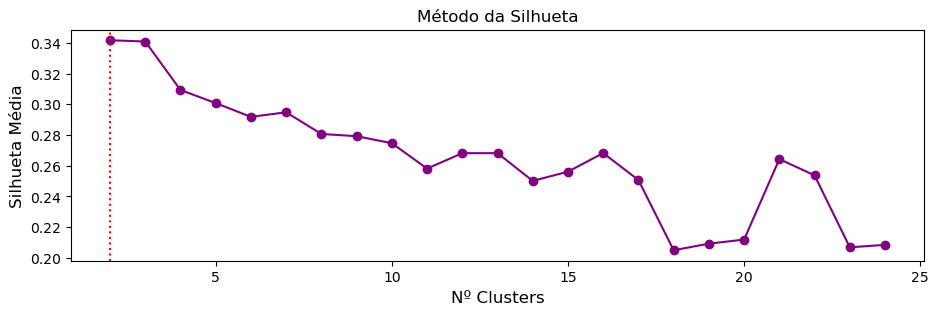

In [341]:
##SILHUETA
## identificação da quantidade de clusters (Método da Silhueta)
max_clust =24
silhueta = []
I = range(2,max_clust+1) # ponto de parada pode ser parametrizado manualmente
for i in I: 
    kmeansSil = KMeans(n_clusters=i, init='random', random_state=100).fit(df_quanti_pad) 
    silhueta.append(silhouette_score(df_quanti_pad, 
                    kmeansSil.labels_))

plt.figure(figsize=(11,3))

plt.plot(range(2, max_clust+1), silhueta, 
         color = 'purple', 
         marker='o')
plt.xlabel('Nº Clusters', fontsize=12)
plt.ylabel('Silhueta Média', fontsize=12)
plt.title('Método da Silhueta', fontsize=12)
plt.axvline(x = silhueta.index(max(silhueta))+2, 
            linestyle = 'dotted', 
            color = 'red') 
plt.show()





#### k-means

In [342]:
# %% Cluster K-means

# Vamos considerar 6 clusters, dadas as evidências anteriores!
kmeans_final = KMeans(n_clusters = 5,
                      init = 'random', 
                      random_state=100).fit(df_quanti_pad)

# Gerando a variável para identificarmos os clusters gerados
kmeans_clusters = kmeans_final.labels_

df_agrup_preliminar['Cluster'] = kmeans_clusters
df_quanti_pad['Cluster'] = kmeans_clusters

df_agrup_preliminar['Cluster'] = df_agrup_preliminar['Cluster'].astype('category')
df_quanti_pad['Cluster'] = df_quanti_pad['Cluster'].astype('category')
df_agrup_preliminar.head()



C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.



nome_var_categoria_espec,txNomeParlamentar,sgUF,sgPartido,cat_reeleicao,cat_cargo_titusup,flag_lid,genero,vl_alimentacao,vl_assinaturas,vl_comb_aeronaves,...,vl_manut_escritorio,vl_pass_aerea_reembolso,vl_pass_aerea_rpa,vl_pass_aerea_sigepa,vl_pass_ter_mar_flu,vl_servseguranca,vl_taxi_ped_estac,vl_telefonia,vl_tokens,Cluster
0,AJ Albuquerque,CE,PP,Reeleito,Titular,0,H,0.00,0.0,0.0,...,18086.25,29291.60,0.00,108188.97,0.0,0.0,0.0,8289.98,0.0,4
1,Abilio Brunini,MT,PL,Nao_reeleito,Titular,0,H,423.56,0.0,0.0,...,216736.82,0.00,0.00,128132.75,498.0,0.0,30.0,871.69,0.0,1
2,Acácio Favacho,AP,MDB,Reeleito,Titular,0,H,0.00,0.0,0.0,...,8683.10,24170.96,0.00,300021.66,0.0,0.0,0.0,15527.42,0.0,3
3,Adail Filho,AM,REPUBLICANOS,Nao_reeleito,Titular,0,H,0.00,0.0,0.0,...,945.20,0.00,0.00,98508.09,0.0,0.0,0.0,2586.29,0.0,3
4,Adilson Barroso,SP,PL,Nao_reeleito,Suplente,0,H,12068.16,0.0,0.0,...,128140.36,2823.90,37225.49,106966.48,0.0,0.0,21802.1,4743.73,120.0,2


In [343]:

df_agrup_preliminar['Cluster'].value_counts()


Cluster
2    189
1    113
0    112
3     99
4     99
Name: count, dtype: int64

#### anova

In [344]:
## Vamos montar uma tabela com todos os resultados de estatísticas p e valores da estatistica F
#1. Lista de variaveis da ANOVA
#variaveis_anova = colunas_quantitativas.copy().remove('vl_serv_postais')
variaveis_anova = colunas_quantitativas.copy()


# 2. Crie uma lista vazia para armazenar os resultados
resultados_anova = []

# 3. Itere sobre a lista de variáveis e rode a ANOVA para cada uma
for var in variaveis_anova:
    # Execute a ANOVA
    anova_result = pg.anova(dv=var, 
                            between='Cluster', 
                            data=df_quanti_pad, 
                            detailed=True)
    
    # Selecione apenas a linha onde 'Source' é 'Cluster'
    cluster_row = anova_result.loc[anova_result['Source'] == 'Cluster']
    
    # Extraia os valores de 'F' e 'p-unc'
    f_value = cluster_row['F'].iloc[0]
    p_unc_value = cluster_row['p-unc'].iloc[0]
    
    # Crie um dicionário com os resultados e adicione o nome da variável
    resultado = {
        'Variavel': var,
        'F': f_value,
        'p-unc': p_unc_value
    }
    
    # Adicione o dicionário à lista de resultados
    resultados_anova.append(resultado)


# 4. Concatene a lista de dicionários em um único DataFrame

df_anova_final = pd.DataFrame(resultados_anova)
df_anova_final['p-unc'] = df_anova_final['p-unc'].round(3)

df_anova_final.sort_values(by='F', ascending=False)

,Variavel,F,p-unc
0,vl_divulg_ativ,824.542051,0.0
3,vl_manut_escritorio,170.267952,0.0
2,vl_locfret_autom,117.994268,0.0
1,vl_pass_aerea_sigepa,113.925023,0.0
4,vl_comb_autom,55.158418,0.0
5,vl_hospedagem,17.337335,0.0


#### Graficos

In [333]:
colunas_quantitativas

['vl_divulg_ativ',
 'vl_pass_aerea_sigepa',
 'vl_locfret_autom',
 'vl_manut_escritorio',
 'vl_comb_autom',
 'vl_hospedagem']

In [345]:
## Grafico dos clusters
# Perspectiva 1   - 3 vriaveis mais volumosas no geral


cores_personalizadas = qualitative.Light24
fig = px.scatter_3d(
    df_agrup_preliminar,
    x='vl_divulg_ativ',
    y='vl_locfret_autom',
    z='vl_pass_aerea_sigepa',
    color='Cluster',
    title='Perspectiva 1',
    # Adicione a paleta de cores personalizada aqui
    color_discrete_sequence=cores_personalizadas
)
fig.show()


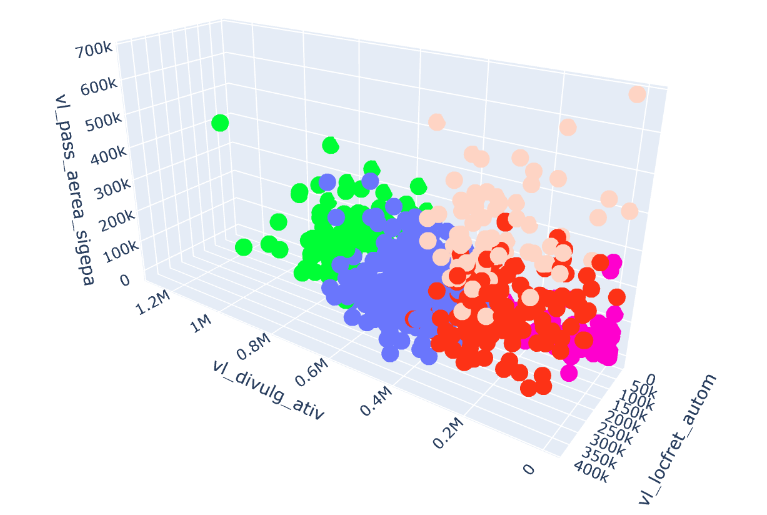

In [ ]:
# info sobre cluster especifico
#Cluster 3

df_op1B_cluster3 = df_agrup_preliminar[df_agrup_preliminar['Cluster']==3].sort_values(by=['Cluster', 'cat_reeleicao', 'cat_cargo_titusup', 'sgPartido', 'sgUF'])
df_op1B_cluster3

In [ ]:
# Perspectiva 2 - 3 variaveis com maior valor de F
cores_personalizadas = qualitative.Light24
fig = px.scatter_3d(
    df_agrup_preliminar, #df_agrup_preliminar,
    x='vl_comb_semespec',
    y='vl_tokens',
    z='vl_comb_embarc',
    color='Cluster',
    title='Perspectiva 2',
    # Adicione a paleta de cores personalizada aqui
    color_discrete_sequence=cores_personalizadas
)
fig.show()
"""



In [346]:


# Perspectiva 3
cores_personalizadas = qualitative.Light24
fig = px.scatter_3d(
    df_agrup_preliminar,
                    z=  'vl_locfret_autom', 
                    y= 'vl_comb_autom', 
                    x= 'vl_manut_escritorio',
                    color='Cluster',
    title='Perspectiva 3',
    # Adicione a paleta de cores personalizada aqui
    color_discrete_sequence=cores_personalizadas
)
fig.show()



In [ ]:
"""
# Perspectiva 4
ordem_dos_clusters = [str(c) for c in range(18)]
cores_personalizadas = qualitative.Light24

fig = px.scatter_3d(
    df_agrup_preliminar,
                    x='vl_divulg_ativ', 
                    y='vl_locfret_autom', 
                    z='vl_manut_escritorio',
    color='Cluster',
    title='Perspectiva 4',
    color_discrete_sequence=cores_personalizadas,
    
    # --- PARÂMETRO CHAVE PARA FORÇAR A ORDEM ---
    category_orders={"Cluster": ordem_dos_clusters})


fig.update_traces(marker=dict(size=4))
fig.show()
"""

#### gravacao das variaveis

In [ ]:
df_anova_final_op1B = df_anova_final.copy()

df_agrup_preliminar['Cluster_op1B'] = df_agrup_preliminar['Cluster'].astype('category')
df_agrup_preliminar_op1B= df_agrup_preliminar.copy()

df_quanti_pad['Cluster_op1B']= df_quanti_pad['Cluster']
df_quanti_pad_op1B = df_quanti_pad.copy()

#### exploração dos clusters

In [ ]:
df_agrup_preliminar_op1B.info()


In [ ]:
# 1. Isolar as observações onde 'Cluster_op1B' é igual a 4
df_cluster_4 = df_agrup_preliminar_op1B[df_agrup_preliminar_op1B['Cluster_op1B'] == 4].copy()

# Colunas para análise de contagem
colunas_para_contar = ['sgUF', 'sgPartido', 'cat_reeleicao', 'cat_cargo_titusup','genero']

print(f"--- Contagem de Elementos no Cluster 4 (Total de Observações: {len(df_cluster_4)}) ---")

# 2. Iterar e mostrar a contagem para cada coluna
for coluna in colunas_para_contar:
    print(f"\nContagem para: {coluna}")
    # Usa value_counts() para obter a contagem de cada valor único
    contagem = df_cluster_4[coluna].value_counts()
    print(contagem)
    print("-" * 30)


In [ ]:
df_cluster_3 = df_agrup_preliminar_op1B[df_agrup_preliminar_op1B['Cluster_op1B'] == 3].copy()

# Colunas para análise de contagem
colunas_para_contar = ['sgUF', 'sgPartido', 'cat_reeleicao', 'cat_cargo_titusup','genero']

print(f"--- Contagem de Elementos no Cluster 4 (Total de Observações: {len(df_cluster_3)}) ---")

# 2. Iterar e mostrar a contagem para cada coluna
for coluna in colunas_para_contar:
    print(f"\nContagem para: {coluna}")
    # Usa value_counts() para obter a contagem de cada valor único
    contagem = df_cluster_3[coluna].value_counts()
    print(contagem)
    print("-" * 30)


In [ ]:
# info sobre cluster especifico
#Cluster 3

df_op1B_cluster3 = df_agrup_preliminar_op1B[df_agrup_preliminar_op1B['Cluster']==4].sort_values(by=['Cluster', 'cat_reeleicao', 'cat_cargo_titusup', 'sgPartido', 'sgUF'])
df_op1B_cluster3.info()

## 
<div style="background-color:yellow; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;"> ------------------------------------------------------------  </span>
</div>

## 3.20
## Resultados opção 2 - usando os valores medios  - todos o periodo

####
<div style="background-color:rgb(255, 219, 88); padding: 10px;">
  <span style="font-size:14px; font-weight:bold;">  Variáveis mensais (Opção 2) </span>
</div>

#### ------

#### ajustes da base

In [347]:

df_agrupado = df.groupby(['txNomeParlamentar', 'sgUF', 'sgPartido', 
                          'cat_reeleicao','cat_cargo_titusup' , 'flag_lid', 'genero','desc_Subcota_Espec'])['vlrLiquido'].sum().reset_index()
df_agrupado.head()


,txNomeParlamentar,sgUF,sgPartido,cat_reeleicao,cat_cargo_titusup,flag_lid,genero,desc_Subcota_Espec,vlrLiquido
0,AJ Albuquerque,CE,PP,Reeleito,Titular,0,H,COMBUSTÍVEIS E LUBRIFICANTES - Veículos Automo...,83607.29
1,AJ Albuquerque,CE,PP,Reeleito,Titular,0,H,DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR,155300.00
2,AJ Albuquerque,CE,PP,Reeleito,Titular,0,H,"HOSPEDAGEM ,EXCETO DO PARLAMENTAR NO DISTRITO ...",40046.00
3,AJ Albuquerque,CE,PP,Reeleito,Titular,0,H,LOCAÇÃO OU FRETAMENTO DE AERONAVES,30000.00
4,AJ Albuquerque,CE,PP,Reeleito,Titular,0,H,LOCAÇÃO OU FRETAMENTO DE VEÍCULOS AUTOMOTORES,258713.00


In [348]:

mapeamento_categorias = {
    'AQUISIÇÃO DE TOKENS E CERTIFICADOS DIGITAIS': 'vl_tokens',
    'ASSINATURA DE PUBLICAÇÕES': 'vl_assinaturas',
    'COMBUSTÍVEIS E LUBRIFICANTES - Veículos Automotores': 'vl_comb_autom',
    'COMBUSTÍVEIS E LUBRIFICANTES - Embarcações': 'vl_comb_embarc',
    'COMBUSTÍVEIS E LUBRIFICANTES - Aeronaves': 'vl_comb_aeronaves',
    'COMBUSTÍVEIS E LUBRIFICANTES - Sem Especificações': 'vl_comb_semespec',
    'DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR': 'vl_divulg_ativ',
    'FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR': 'vl_alimentacao',
    'HOSPEDAGEM ,EXCETO DO PARLAMENTAR NO DISTRITO FEDERAL': 'vl_hospedagem',
    'LOCAÇÃO OU FRETAMENTO DE AERONAVES': 'vl_locfret_aeronave',
    'LOCAÇÃO OU FRETAMENTO DE VEÍCULOS AUTOMOTORES': 'vl_locfret_autom',
    'LOCAÇÃO OU FRETAMENTO DE EMBARCAÇÕES': 'vl_locfret_embarc',
    'MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE PARLAMENTAR': 'vl_manut_escritorio',
    'PARTICIPAÇÃO EM CURSO, PALESTRA OU EVENTO SIMILAR': 'vl_cursos_eventos',
    'PASSAGEM AÉREA - REEMBOLSO': 'vl_pass_aerea_reembolso',
    'PASSAGEM AÉREA - SIGEPA': 'vl_pass_aerea_sigepa',
    'PASSAGEM AÉREA - RPA': 'vl_pass_aerea_rpa',
    'PASSAGENS TERRESTRES, MARÍTIMAS OU FLUVIAIS': 'vl_pass_ter_mar_flu',
    'SERVIÇO DE SEGURANÇA PRESTADO POR EMPRESA ESPECIALIZADA': 'vl_servseguranca',
    'SERVIÇO DE TÁXI, PEDÁGIO E ESTACIONAMENTO': 'vl_taxi_ped_estac',
    'SERVIÇOS POSTAIS': 'vl_serv_postais',
    'TELEFONIA': 'vl_telefonia'
}

df_agrupado['nome_var_categoria_espec'] = df_agrupado['desc_Subcota_Espec'].map(mapeamento_categorias)


In [349]:
# --- ETAPA 4: Pivotar a coluna 'nome_var_categoria_espec' ---
# Define o índice para o pivot
indices_pivot = [
    'txNomeParlamentar', 
    'sgUF', 
    'sgPartido', 
    'cat_reeleicao',
    'cat_cargo_titusup' ,
    'flag_lid'

]

# Pivota o dataframe. fillna(0) preenche os valores ausentes com 0.
df_agrup_preliminar = df_agrupado.pivot_table(
    index=indices_pivot, 
    columns='nome_var_categoria_espec', 
    values='vlrLiquido', 
    aggfunc='sum'
).reset_index().fillna(0)
df_agrup_preliminar


nome_var_categoria_espec,txNomeParlamentar,sgUF,sgPartido,cat_reeleicao,cat_cargo_titusup,flag_lid,vl_alimentacao,vl_assinaturas,vl_comb_aeronaves,vl_comb_autom,...,vl_locfret_embarc,vl_manut_escritorio,vl_pass_aerea_reembolso,vl_pass_aerea_rpa,vl_pass_aerea_sigepa,vl_pass_ter_mar_flu,vl_servseguranca,vl_taxi_ped_estac,vl_telefonia,vl_tokens
0,AJ Albuquerque,CE,PP,Reeleito,Titular,0,0.00,0.0,0.00,83607.29,...,0.0,18086.25,29291.60,0.00,108188.97,0.0,0.00,0.00,8289.98,0.00
1,Abilio Brunini,MT,PL,Nao_reeleito,Titular,0,423.56,0.0,0.00,115139.89,...,0.0,216736.82,0.00,0.00,128132.75,498.0,0.00,30.00,871.69,0.00
2,Acácio Favacho,AP,MDB,Reeleito,Titular,0,0.00,0.0,0.00,97259.19,...,0.0,8683.10,24170.96,0.00,300021.66,0.0,0.00,0.00,15527.42,0.00
3,Adail Filho,AM,REPUBLICANOS,Nao_reeleito,Titular,0,0.00,0.0,0.00,63038.98,...,0.0,945.20,0.00,0.00,98508.09,0.0,0.00,0.00,2586.29,0.00
4,Adilson Barroso,SP,PL,Nao_reeleito,Suplente,0,12068.16,0.0,0.00,110208.29,...,0.0,128140.36,2823.90,37225.49,106966.48,0.0,0.00,21802.10,4743.73,120.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
607,Zé Silva,MG,SOLIDARIEDADE,Reeleito,Titular,0,4663.91,0.0,69061.23,72169.41,...,0.0,90386.03,0.00,0.00,156282.78,0.0,0.00,507.00,23148.51,0.00
608,Zé Trovão,SC,PL,Nao_reeleito,Titular,0,11577.68,0.0,0.00,137170.84,...,0.0,485675.48,0.00,0.00,113494.52,0.0,14273.93,6097.11,10607.66,0.00
609,Zé Vitor,MG,PL,Reeleito,Titular,0,0.00,0.0,11160.60,135198.50,...,0.0,2026.05,0.00,4335.89,78964.45,0.0,0.00,3996.98,299.93,161.66
610,Átila Lins,AM,PSD,Reeleito,Titular,0,0.00,0.0,0.00,0.00,...,0.0,5350.50,104420.56,335611.56,41731.61,0.0,0.00,0.00,49178.19,0.00


In [350]:
#df_agrup_preliminar.drop(['cont_meses_gastos_x', 'cont_meses_gastos_y'], axis=1, inplace=True)


In [351]:
df_agrup_preliminar = pd.merge(
    df_agrup_preliminar, 
    df_contagem_meses[['txNomeParlamentar', 'cont_meses_gastos']], 
    on='txNomeParlamentar', 
    how='left'
)

In [352]:
df_agrup_preliminar.head(2)

,txNomeParlamentar,sgUF,sgPartido,cat_reeleicao,cat_cargo_titusup,flag_lid,vl_alimentacao,vl_assinaturas,vl_comb_aeronaves,vl_comb_autom,...,vl_manut_escritorio,vl_pass_aerea_reembolso,vl_pass_aerea_rpa,vl_pass_aerea_sigepa,vl_pass_ter_mar_flu,vl_servseguranca,vl_taxi_ped_estac,vl_telefonia,vl_tokens,cont_meses_gastos
0,AJ Albuquerque,CE,PP,Reeleito,Titular,0,0.00,0.0,0.0,83607.29,...,18086.25,29291.6,0.0,108188.97,0.0,0.0,0.0,8289.98,0.0,27
1,Abilio Brunini,MT,PL,Nao_reeleito,Titular,0,423.56,0.0,0.0,115139.89,...,216736.82,0.0,0.0,128132.75,498.0,0.0,30.0,871.69,0.0,23


In [353]:
# 2. Definir a lista de colunas a serem divididas
colunas_quantitativas_completa=['vl_alimentacao',
 'vl_assinaturas',
 'vl_comb_aeronaves',
 'vl_comb_autom',
 'vl_comb_embarc',
 'vl_comb_semespec',
 'vl_cursos_eventos',
 'vl_divulg_ativ',
 'vl_hospedagem',
 'vl_locfret_aeronave',
 'vl_locfret_autom',
 'vl_locfret_embarc',
 'vl_manut_escritorio',
 'vl_pass_aerea_reembolso',
 'vl_pass_aerea_rpa',
 'vl_pass_aerea_sigepa',
 'vl_pass_ter_mar_flu',
 'vl_servseguranca',
 'vl_taxi_ped_estac',
 'vl_telefonia',
 'vl_tokens']


colunas_quantitativas_reduzida =  ['vl_divulg_ativ',
'vl_pass_aerea_sigepa',
'vl_locfret_autom',
'vl_manut_escritorio',
'vl_comb_autom',
'vl_hospedagem']

"""
['vl_comb_semespec','vl_comb_embarc','vl_comb_autom','vl_divulg_ativ','vl_locfret_autom','vl_pass_aerea_sigepa', 'vl_manut_escritorio']
"""

colunas_quantitativas = colunas_quantitativas_reduzida.copy()

In [354]:
#faz a divisao por todas as colunas, mesmo as que nao forem ser usadas

# 3. Dividir cada coluna de gasto pela coluna 'cont_meses_gastos'
for coluna in colunas_quantitativas_completa:
    df_agrup_preliminar[coluna] = df_agrup_preliminar[coluna] / df_agrup_preliminar['cont_meses_gastos']

In [355]:
df_agrup_preliminar

,txNomeParlamentar,sgUF,sgPartido,cat_reeleicao,cat_cargo_titusup,flag_lid,vl_alimentacao,vl_assinaturas,vl_comb_aeronaves,vl_comb_autom,...,vl_manut_escritorio,vl_pass_aerea_reembolso,vl_pass_aerea_rpa,vl_pass_aerea_sigepa,vl_pass_ter_mar_flu,vl_servseguranca,vl_taxi_ped_estac,vl_telefonia,vl_tokens,cont_meses_gastos
0,AJ Albuquerque,CE,PP,Reeleito,Titular,0,0.000000,0.0,0.000000,3096.566296,...,669.861111,1084.874074,0.000000,4006.998889,0.000000,0.000000,0.000000,307.036296,0.000000,27
1,Abilio Brunini,MT,PL,Nao_reeleito,Titular,0,18.415652,0.0,0.000000,5006.082174,...,9423.340000,0.000000,0.000000,5570.989130,21.652174,0.000000,1.304348,37.899565,0.000000,23
2,Acácio Favacho,AP,MDB,Reeleito,Titular,0,0.000000,0.0,0.000000,3602.192222,...,321.596296,895.220741,0.000000,11111.913333,0.000000,0.000000,0.000000,575.089630,0.000000,27
3,Adail Filho,AM,REPUBLICANOS,Nao_reeleito,Titular,0,0.000000,0.0,0.000000,2334.777037,...,35.007407,0.000000,0.000000,3648.447778,0.000000,0.000000,0.000000,95.788519,0.000000,27
4,Adilson Barroso,SP,PL,Nao_reeleito,Suplente,0,446.968889,0.0,0.000000,4081.788519,...,4745.939259,104.588889,1378.721852,3961.721481,0.000000,0.000000,807.485185,175.693704,4.444444,27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
613,Zé Silva,MG,SOLIDARIEDADE,Reeleito,Titular,0,172.737407,0.0,2557.823333,2672.941111,...,3347.630741,0.000000,0.000000,5788.251111,0.000000,0.000000,18.777778,857.352222,0.000000,27
614,Zé Trovão,SC,PL,Nao_reeleito,Titular,0,428.802963,0.0,0.000000,5080.401481,...,17987.980741,0.000000,0.000000,4203.500741,0.000000,528.664074,225.818889,392.876296,0.000000,27
615,Zé Vitor,MG,PL,Reeleito,Titular,0,0.000000,0.0,413.355556,5007.351852,...,75.038889,0.000000,160.588519,2924.609259,0.000000,0.000000,148.036296,11.108519,5.987407,27
616,Átila Lins,AM,PSD,Reeleito,Titular,0,0.000000,0.0,0.000000,0.000000,...,198.166667,3867.428148,12430.057778,1545.615185,0.000000,0.000000,0.000000,1821.414444,0.000000,27


In [356]:
# df_agrup_preliminar = df_agrup_preliminar.drop('cont_meses_gastos', axis=1)

#### Padronização

In [357]:
# Aqui estpa marcado a reduzida

df_quanti=df_agrup_preliminar[colunas_quantitativas]
df_quanti
# Copie o DataFrame para não alterar o original
df_quanti_pad = df_quanti.copy()

#Aplicar a padronização Z-score a essas colunas dinâmicas
df_quanti_pad[colunas_quantitativas] = df_quanti_pad[colunas_quantitativas].apply(zscore, ddof=1)


In [358]:
df_quanti_pad.head()

,vl_divulg_ativ,vl_pass_aerea_sigepa,vl_locfret_autom,vl_manut_escritorio,vl_comb_autom,vl_hospedagem
0,-0.621156,-0.359656,0.445107,-0.832739,-0.064401,0.519551
1,-0.570953,-0.158201,0.435404,0.919269,0.513219,0.225557
2,0.470594,0.555516,0.331057,-0.902444,0.088549,-0.329807
3,1.093093,-0.405840,0.086678,-0.959805,-0.294838,-0.329807
4,-0.111151,-0.365488,0.820224,-0.016912,0.233624,0.008774


#### Elbow e silhueta

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have

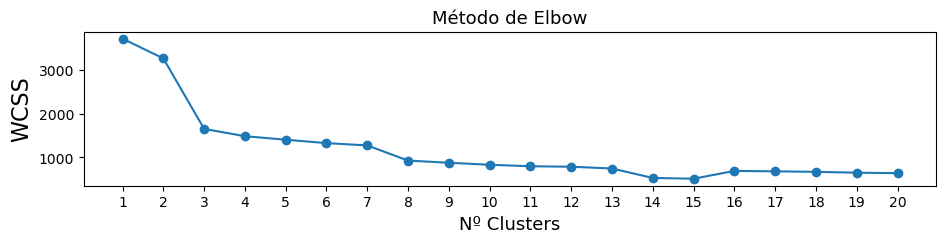

In [359]:
elbow = []
K = range(1,21) # ponto de parada pode ser parametrizado manualmente
for k in K:
    kmeanElbow = KMeans(n_clusters=k,
                        init='random', 
                        random_state=100).fit(df_quanti_pad)
    
    elbow.append(kmeanElbow.inertia_)
    
plt.figure(figsize=(11,2))
plt.plot(K, elbow, marker='o')
plt.xlabel('Nº Clusters', fontsize=13)
plt.xticks(K) # ajustar range
plt.ylabel('WCSS', fontsize=16)
plt.title('Método de Elbow', fontsize=13)
plt.show()


C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have

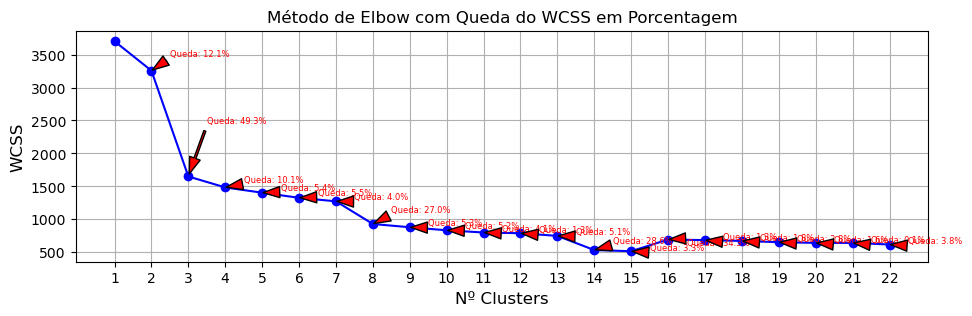

In [360]:
##elbow

# ---
elbow = []
K = range(1, 23)

for k in K:
    kmeanElbow = KMeans(n_clusters=k, init='random', random_state=100, n_init='auto').fit(df_quanti_pad)
    elbow.append(kmeanElbow.inertia_)

# ---
# Plotagem do método de Elbow com anotações de queda em porcentagem
plt.figure(figsize=(11, 3))
plt.plot(K, elbow, marker='o', linestyle='-', color='b')
plt.xlabel('Nº Clusters', fontsize=12)  # Fonte menor para o eixo X
plt.xticks(K)
plt.ylabel('WCSS', fontsize=12)  # Fonte menor para o eixo Y
plt.title('Método de Elbow com Queda do WCSS em Porcentagem', fontsize=12)  # Fonte menor para o título
plt.grid(True)

# Adicionar as anotações de queda em porcentagem
for i in range(1, len(elbow)):
    # Calcular a queda absoluta
    queda_absoluta = elbow[i-1] - elbow[i]
    # Calcular a queda em porcentagem
    queda_porcentagem = (queda_absoluta / elbow[i-1]) * 100
    
    # Posição da anotação
    x_pos = K[i]
    y_pos = elbow[i] + (elbow[i-1] - elbow[i]) / 2
    
    # Texto da anotação
    texto_anotacao = f"Queda: {queda_porcentagem:.1f}%"
    
    # Adicionar a anotação com uma seta
    plt.annotate(
        texto_anotacao,
        xy=(K[i], elbow[i]),
        xytext=(x_pos + 0.5, y_pos),
        arrowprops=dict(facecolor='red', shrink=0.05, width=1.5, headwidth=8),
        fontsize=6,  # Fonte menor para o texto da anotação
        color='red'
    )



C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.

C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have

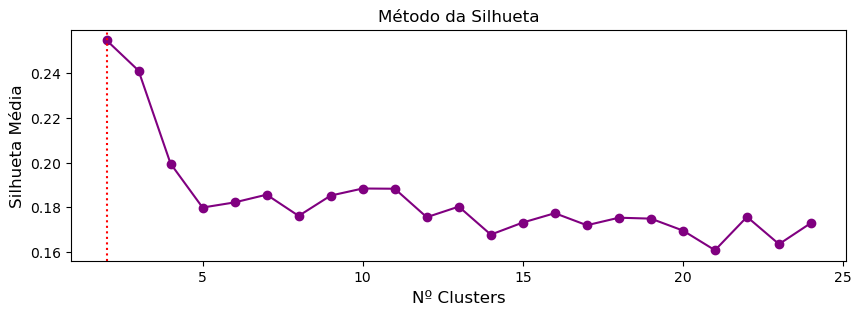

In [361]:
##SILHUETA
## identificação da quantidade de clusters (Método da Silhueta)
max_clust =24
silhueta = []
I = range(2,max_clust+1) # ponto de parada pode ser parametrizado manualmente
for i in I: 
    kmeansSil = KMeans(n_clusters=i, init='random', random_state=100).fit(df_quanti_pad) 
    silhueta.append(silhouette_score(df_quanti_pad, 
                    kmeansSil.labels_))

plt.figure(figsize=(10,3))

plt.plot(range(2, max_clust+1), silhueta, 
         color = 'purple', 
         marker='o')
plt.xlabel('Nº Clusters', fontsize=12)
plt.ylabel('Silhueta Média', fontsize=12)
plt.title('Método da Silhueta', fontsize=12)
plt.axvline(x = silhueta.index(max(silhueta))+2, 
            linestyle = 'dotted', 
            color = 'red') 
plt.show()



#### kmeans

In [362]:
# %% Cluster K-means

# Vamos considerar 6 clusters, dadas as evidências anteriores!
kmeans_final = KMeans(n_clusters = 5 ,
                      init = 'random', 
                      random_state=100).fit(df_quanti_pad)

# Gerando a variável para identificarmos os clusters gerados
kmeans_clusters = kmeans_final.labels_

df_agrup_preliminar['Cluster'] = kmeans_clusters
df_quanti_pad['Cluster'] = kmeans_clusters

df_agrup_preliminar['Cluster'] = df_agrup_preliminar['Cluster'].astype('category')
df_quanti_pad['Cluster'] = df_quanti_pad['Cluster'].astype('category')
df_agrup_preliminar.head()





C:\Users\dbwaller\AppData\Local\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.



,txNomeParlamentar,sgUF,sgPartido,cat_reeleicao,cat_cargo_titusup,flag_lid,vl_alimentacao,vl_assinaturas,vl_comb_aeronaves,vl_comb_autom,...,vl_pass_aerea_reembolso,vl_pass_aerea_rpa,vl_pass_aerea_sigepa,vl_pass_ter_mar_flu,vl_servseguranca,vl_taxi_ped_estac,vl_telefonia,vl_tokens,cont_meses_gastos,Cluster
0,AJ Albuquerque,CE,PP,Reeleito,Titular,0,0.000000,0.0,0.0,3096.566296,...,1084.874074,0.000000,4006.998889,0.000000,0.0,0.000000,307.036296,0.000000,27,1
1,Abilio Brunini,MT,PL,Nao_reeleito,Titular,0,18.415652,0.0,0.0,5006.082174,...,0.000000,0.000000,5570.989130,21.652174,0.0,1.304348,37.899565,0.000000,23,2
2,Acácio Favacho,AP,MDB,Reeleito,Titular,0,0.000000,0.0,0.0,3602.192222,...,895.220741,0.000000,11111.913333,0.000000,0.0,0.000000,575.089630,0.000000,27,4
3,Adail Filho,AM,REPUBLICANOS,Nao_reeleito,Titular,0,0.000000,0.0,0.0,2334.777037,...,0.000000,0.000000,3648.447778,0.000000,0.0,0.000000,95.788519,0.000000,27,4
4,Adilson Barroso,SP,PL,Nao_reeleito,Suplente,0,446.968889,0.0,0.0,4081.788519,...,104.588889,1378.721852,3961.721481,0.000000,0.0,807.485185,175.693704,4.444444,27,1


In [363]:

df_agrup_preliminar['Cluster'].value_counts()

Cluster
1    203
4    166
2    133
3    113
0      3
Name: count, dtype: int64

In [364]:

# info sobre cluster especifico

#df_agrup_preliminar[df_agrup_preliminar['Cluster']==5].sort_values(by=['Cluster', 'cat_reeleicao', 'cat_cargo_titusup', 'sgPartido', 'sgUF'])

#### Anova

In [ ]:
## Vamos montar uma tabela com todos os resultados de estatísticas p e valores da estatistica F
#1. Lista de variaveis da ANOVA
#variaveis_anova = colunas_quantitativas.copy().remove('vl_serv_postais')
variaveis_anova = colunas_quantitativas.copy()


# 2. Crie uma lista vazia para armazenar os resultados
resultados_anova = []

# 3. Itere sobre a lista de variáveis e rode a ANOVA para cada uma
for var in variaveis_anova:
    # Execute a ANOVA
    anova_result = pg.anova(dv=var, 
                            between='Cluster', 
                            data=df_quanti_pad, 
                            detailed=True)
    
    # Selecione apenas a linha onde 'Source' é 'Cluster'
    cluster_row = anova_result.loc[anova_result['Source'] == 'Cluster']
    
    # Extraia os valores de 'F' e 'p-unc'
    f_value = cluster_row['F'].iloc[0]
    p_unc_value = cluster_row['p-unc'].iloc[0]
    
    # Crie um dicionário com os resultados e adicione o nome da variável
    resultado = {
        'Variavel': var,
        'F': f_value,
        'p-unc': p_unc_value
    }
    
    # Adicione o dicionário à lista de resultados
    resultados_anova.append(resultado)


# 4. Concatene a lista de dicionários em um único DataFrame

df_anova_final = pd.DataFrame(resultados_anova)
df_anova_final['p-unc'] = df_anova_final['p-unc'].round(3)

df_anova_final.sort_values(by='F', ascending=False)

#### Graficos

In [ ]:
colunas_quantitativas

In [ ]:
## Grafico dos clusters
# Perspectiva 1   - 3 vriaveis mais volumosas no geral


cores_personalizadas = qualitative.Light24
fig = px.scatter_3d(
    df_agrup_preliminar,
    x='vl_divulg_ativ',
    y='vl_comb_autom',
    z='vl_pass_aerea_sigepa',
    color='Cluster',
    title='Perspectiva 1',
    # Adicione a paleta de cores personalizada aqui
    color_discrete_sequence=cores_personalizadas
)
fig.show()


In [ ]:
## Grafico dos clusters
# Perspectiva 2   - 3 vriaveis mais importantes em teste F


cores_personalizadas = qualitative.Light24
fig = px.scatter_3d(
    df_agrup_preliminar,
    x=  'vl_pass_aerea_sigepa',
    y='vl_locfret_autom',
    z= 'vl_divulg_ativ',
    color='Cluster',
    title='Perspectiva 2',
    # Adicione a paleta de cores personalizada aqui
    color_discrete_sequence=cores_personalizadas
)
fig.show()

In [ ]:
colunas_quantitativas

In [ ]:
## Grafico dos clusters
# Perspectiva 2   - 3 vriaveis mais importantes em teste F


cores_personalizadas = qualitative.Light24
fig = px.scatter_3d(
    df_agrup_preliminar,
    x=  'vl_pass_aerea_sigepa',
    y='vl_locfret_autom',
    z= 'vl_manut_escritorio',
    color='Cluster',
    title='Perspectiva 2',
    # Adicione a paleta de cores personalizada aqui
    color_discrete_sequence=cores_personalizadas
)
fig.show()

#### Gravacao das variaveis

In [ ]:
df_anova_final_op2 = df_anova_final.copy()

df_agrup_preliminar['Cluster_op2'] = df_agrup_preliminar['Cluster'].astype('category')
df_agrup_preliminar_op2= df_agrup_preliminar.copy()

df_quanti_pad['Cluster_op2']= df_quanti_pad['Cluster']
df_quanti_pad_op2 = df_quanti_pad.copy()

In [ ]:
colunas_cluster_quali_quanti =[
    'Cluster',
    'txNomeParlamentar',
    'sgUF',
    'sgPartido',
    'cat_reeleicao', 
    'cat_cargo_titusup',  
    #'genero',
    'vl_divulg_ativ',
     'vl_pass_aerea_sigepa',
     'vl_locfret_autom',
     'vl_manut_escritorio',
     'vl_comb_autom',
     'vl_hospedagem']

In [ ]:
#df_agrup_preliminar_op2

In [ ]:
# info sobre cluster especifico
#Cluster 3

df_op2_cluster0 = df_agrup_preliminar_op2[df_agrup_preliminar_op2['Cluster']==4][colunas_cluster_quali_quanti].sort_values(by=['Cluster', 'cat_reeleicao', 'cat_cargo_titusup', 'sgPartido', 'sgUF'])
df_op2_cluster0


<div style="background-color:yellow; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;"> ------------------------------------------------------------  </span>
</div>

## 3.30
## Resultados opção 3 - usando os valores do ultimo trimestre 

In [ ]:
df_quartotrim=df[df['numAnoMes_compet'].isin([202310,202311,202312,202410,202411,202412])] 
df_agrupado = df_quartotrim.groupby(['txNomeParlamentar', 'sgUF', 'sgPartido', 
                          'cat_reeleicao','cat_cargo_titusup' , 'flag_lid', 'desc_Subcota_Espec'])['vlrLiquido'].sum().reset_index()

### 
<div style="background-color:rgb(255, 219, 88); padding: 10px;">
  <span style="font-size:14px; font-weight:bold;"> - Apenas ultimos trimestres de 2023 e 2024  (Opção 3) </span>
</div>
Dado que peo grafico temporal, u ultimo trimestre tem gastos maiores que no inciio do ano, prinicipaemtne para a categoria de gastos de dibulgação de atividade parlamentar, vamos fazer uma tentativa de gerar a base de categorias apenas com os meses de out/23, no/23, dez/23, out/24, nov/24, dez/24

In [ ]:
df_quartotrim=df[df['numAnoMes_compet'].isin([202310,202311,202312,202410,202411,202412])] 

In [ ]:
df_agrupado = df_quartotrim.groupby(['txNomeParlamentar', 'sgUF', 'sgPartido', 
                          'cat_reeleicao','cat_cargo_titusup' , 'flag_lid', 'desc_Subcota_Espec'])['vlrLiquido'].sum().reset_index()


In [ ]:
mapeamento_categorias = {
    'AQUISIÇÃO DE TOKENS E CERTIFICADOS DIGITAIS': 'vl_tokens',
    'ASSINATURA DE PUBLICAÇÕES': 'vl_assinaturas',
    'COMBUSTÍVEIS E LUBRIFICANTES - Veículos Automotores': 'vl_comb_autom',
    'COMBUSTÍVEIS E LUBRIFICANTES - Embarcações': 'vl_comb_embarc',
    'COMBUSTÍVEIS E LUBRIFICANTES - Aeronaves': 'vl_comb_aeronaves',
    'COMBUSTÍVEIS E LUBRIFICANTES - Sem Especificações': 'vl_comb_semespec',
    'DIVULGAÇÃO DA ATIVIDADE PARLAMENTAR': 'vl_divulg_ativ',
    'FORNECIMENTO DE ALIMENTAÇÃO DO PARLAMENTAR': 'vl_alimentacao',
    'HOSPEDAGEM ,EXCETO DO PARLAMENTAR NO DISTRITO FEDERAL': 'vl_hospedagem',
    'LOCAÇÃO OU FRETAMENTO DE AERONAVES': 'vl_locfret_aeronave',
    'LOCAÇÃO OU FRETAMENTO DE VEÍCULOS AUTOMOTORES': 'vl_locfret_autom',
    'LOCAÇÃO OU FRETAMENTO DE EMBARCAÇÕES': 'vl_locfret_embarc',
    'MANUTENÇÃO DE ESCRITÓRIO DE APOIO À ATIVIDADE PARLAMENTAR': 'vl_manut_escritorio',
    'PARTICIPAÇÃO EM CURSO, PALESTRA OU EVENTO SIMILAR': 'vl_cursos_eventos',
    'PASSAGEM AÉREA - REEMBOLSO': 'vl_pass_aerea_reembolso',
    'PASSAGEM AÉREA - SIGEPA': 'vl_pass_aerea_sigepa',
    'PASSAGEM AÉREA - RPA': 'vl_pass_aerea_rpa',
    'PASSAGENS TERRESTRES, MARÍTIMAS OU FLUVIAIS': 'vl_pass_ter_mar_flu',
    'SERVIÇO DE SEGURANÇA PRESTADO POR EMPRESA ESPECIALIZADA': 'vl_servseguranca',
    'SERVIÇO DE TÁXI, PEDÁGIO E ESTACIONAMENTO': 'vl_taxi_ped_estac',
    'SERVIÇOS POSTAIS': 'vl_serv_postais',
    'TELEFONIA': 'vl_telefonia'
}

df_agrupado['nome_var_categoria_espec'] = df_agrupado['desc_Subcota_Espec'].map(mapeamento_categorias)



In [ ]:
df_agrupado.head()

In [ ]:
colunas_quantitativas_1 = ['vl_alimentacao',
 'vl_assinaturas',
 'vl_comb_aeronaves',
 'vl_comb_autom',
 'vl_comb_embarc',
 'vl_comb_semespec',
 'vl_cursos_eventos',
 'vl_divulg_ativ',
 'vl_hospedagem',
 'vl_locfret_aeronave',
 'vl_locfret_autom',
 'vl_locfret_embarc',
 'vl_manut_escritorio',
 'vl_pass_aerea_reembolso',
 'vl_pass_aerea_rpa',
 'vl_pass_aerea_sigepa',
 'vl_pass_ter_mar_flu',
 'vl_servseguranca',
 'vl_taxi_ped_estac',
 'vl_telefonia',
 'vl_tokens']

In [ ]:
colunas_quantitativas_2 =[
 'vl_comb_autom',
 'vl_divulg_ativ',
 'vl_hospedagem',
 'vl_locfret_autom',
 'vl_manut_escritorio',
 'vl_pass_aerea_sigepa'
]

In [ ]:
# Opções apenas com as 6 categorias mais relevantes 

colunas_quantitativas = colunas_quantitativas_1

#### Pivotagem

In [ ]:

# Define o índice para o pivot
indices_pivot = [
    'txNomeParlamentar', 
    'sgUF', 
    'sgPartido', 
    'cat_reeleicao',
    'cat_cargo_titusup' ,
    'flag_lid'

]

# Pivota o dataframe. fillna(0) preenche os valores ausentes com 0.
df_agrup_preliminar = df_agrupado.pivot_table(
    index=indices_pivot, 
    columns='nome_var_categoria_espec', 
    values='vlrLiquido', 
    aggfunc='sum'
).reset_index().fillna(0)
df_agrup_preliminar

#### Padronização

In [ ]:
colunas_quantitativas

In [ ]:
df_quanti=df_agrup_preliminar[colunas_quantitativas]


# Copie o DataFrame para não alterar o original
df_quanti_pad = df_quanti.copy()

#Aplicar a padronização Z-score a essas colunas dinâmicas
df_quanti_pad[colunas_quantitativas] = df_quanti_pad[colunas_quantitativas].apply(zscore, ddof=1)


In [ ]:
df_quanti_pad.head()

In [ ]:
df_anova_final_op3 = df_anova_final.copy()

df_agrup_preliminar['Cluster_op3'] = df_agrup_preliminar['Cluster'].astype('category')
df_agrup_preliminar_op3= df_agrup_preliminar.copy()

df_quanti_pad['Cluster_op3']= df_quanti_pad['Cluster']
df_quanti_pad_op3 = df_quanti_pad.copy()

# 
<div style="background-color:yellow; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;"> ------------------------------------------------------------  </span>
</div>

# 4. 
<div style="background-color:lightblue; padding: 20px;">
  <span style="font-size:14px; font-weight:bold;">4. ANÁLISE de Correspondencia Multipla - variaveis qualitativas</span>
</div>
 



ACM 
Análise de correspondencia multipla nas variaveis categoricas, incluindo ao qual  obsevacao pertence.
Agoa fazemos análise correspondencia


Obs.:A Análise de Correspondência Múltipla (ACM) é uma técnica estatística usada para analisar relações entre variáveis categóricas, enquanto a Análise de Correspondência (ANACOR ou ACS) é utilizada para duas variáveis. 


Para manter  as variaveis numa analise de correspondencia multipla, elas precisam apresentar associaçao estisticamentee significativa com epelo menos uma outra variavel da analise.
Vamos fazer combinaçoes para teste chi 2 de associaçao.
Pode aplicar atalho.. em que elege uma variavel, que se julgue a priori como importante,  e realiza  calculo todas tabelas de contignecia e fa;ço os testes chi 2 em relaçao a ela.
Se todas passarem , todas vao para canalise de correspondecia multipla.
se ela nao apssar, faço teste com outras vari[aveis


In [ ]:
df_agrup_preliminar.head(2)

In [ ]:
df_agrup_preliminar.info()


In [ ]:
#df_agrup_preliminar['Cluster']=df_agrup_preliminar['Cluster_op1A']

In [ ]:
df_quali = df_agrup_preliminar[['sgPartido', 'sgUF', 'cat_reeleicao','cat_cargo_titusup','Cluster']]
#'flag_lid' deixei de lado
df_quali.head() 

In [ ]:
#Estatísticas descritivas univariadas

# Tabelas de frequências por variável
print(df_quali.sgPartido.value_counts())
print(df_quali.sgUF.value_counts())
print(df_quali.cat_reeleicao.value_counts())
print(df_quali.cat_cargo_titusup.value_counts())
print(df_quali.Cluster.value_counts())

In [ ]:
# Teste de qui-quadrado para pares de variáveis
# A variável de referência agora é 'Cluster

# 1. Teste 'Cluster' vs 'sgPartido'
tabela1 = chi2_contingency(pd.crosstab(df_quali["Cluster"],
                                       df_quali["sgPartido"]))
print(f"p-valor da estatística (Cluster x sgPartido): {round(tabela1[1], 4)}")

# 2. Teste 'Cluster' vs 'sgUF'
tabela2 = chi2_contingency(pd.crosstab(df_quali["Cluster"],
                                       df_quali["sgUF"]))
print(f"p-valor da estatística (Cluster x sgUF): {round(tabela2[1], 4)}")

# 3. Teste 'Cluster' vs 'cat_reeleicao'
tabela3 = chi2_contingency(pd.crosstab(df_quali["Cluster"],
                                       df_quali["cat_reeleicao"]))
print(f"p-valor da estatística (Cluster x cat_reeleicao): {round(tabela3[1], 4)}")


# 4. Teste 'Cluster' vs 'cat_cargo_titusup'
tabela4 = chi2_contingency(pd.crosstab(df_quali["Cluster"],
                                       df_quali["cat_cargo_titusup"]))
print(f"p-valor da estatística (Cluster x cat_cargo_titusup): {round(tabela4[1], 4)}")


# 5. Teste 'Cluster' vs 'cat_cargo_titusup'
tabela5 = chi2_contingency(pd.crosstab(df_quali["Cluster"],
                                       df_quali["genero"]))
print(f"p-valor da estatística (Cluster x cat_cargo_titusup): {round(tabela5[1], 4)}")


In [ ]:
"""
# 5. Teste 'Cluster' vs 'flag_lid'
tabela5 = chi2_contingency(pd.crosstab(df_quali["Cluster"],
                                       df_quali["flag_lid"]))
print(f"p-valor da estatística (Cluster x flag_lid): {round(tabela5[1], 4)}")
"""

In [ ]:
# Elaborando a análise de correspondência múltipla
mca = prince.MCA(n_components=2).fit(df_quali)


In [ ]:
#Analisando os resultados

# Análise dos autovalores
tabela_autovalores = mca.eigenvalues_summary
print(tabela_autovalores)

# Inércia total da análise
print(mca.total_inertia_)

# Plotar apenas dimensões com inércia parcial superior à inércia total média
quant_dim = mca.J_ - mca.K_
print(mca.total_inertia_/quant_dim)


In [ ]:
#Obtendo as coordenadas-padrão das categorias das variáveis

coord_padrao = mca.column_coordinates(df_quali)/np.sqrt(mca.eigenvalues_)
print(coord_padrao)

In [ ]:
## Plotando o mapa perceptual (coordenadas-padrão)

# Primeiro passo: gerar um DataFrame detalhado

chart = coord_padrao.reset_index()
var_chart = pd.Series(chart['index'].str.split('_', expand=True).iloc[:,0])

nome_categ=[]
for col in df_quali:
    nome_categ.append(df_quali[col].sort_values(ascending=True).unique())
    categorias = pd.DataFrame(nome_categ).stack().reset_index()

chart_df_mca = pd.DataFrame({'categoria': chart['index'],
                             'obs_x': chart[0],
                             'obs_y': chart[1],
                             'obs_z': chart[2],
                             'variavel': var_chart,
                             'categoria_id': categorias[0]})

# Segundo passo: gerar o gráfico de pontos

fig = px.scatter_3d(chart_df_mca, 
                    x='obs_x', 
                    y='obs_y', 
                    z='obs_z',
                    color='variavel',
                    text=chart_df_mca.categoria_id)
fig.show()


In [ ]:
# Teste de qui-quadrado para pares de variáveis
# A variável de referência agora é 'sgPartido'

# 1. Teste 'sgPartido' vs 'Cluster'
tabela1 = chi2_contingency(pd.crosstab(df_quali["sgPartido"],
                                       df_quali["Cluster"]))
print(f"p-valor da estatística (sgPartido x Cluster): {round(tabela1[1], 4)}")

# 2. Teste 'sgPartido' vs 'sgUF'
tabela2 = chi2_contingency(pd.crosstab(df_quali["sgPartido"],
                                       df_quali["sgUF"]))
print(f"p-valor da estatística (sgPartido x sgUF): {round(tabela2[1], 4)}")

# 3. Teste 'sgPartido' vs 'flag_reeleito'
tabela3 = chi2_contingency(pd.crosstab(df_quali["sgPartido"],
                                       df_quali["flag_reeleito"]))
print(f"p-valor da estatística (sgPartido x flag_reeleito): {round(tabela3[1], 4)}")

# 4. Teste 'sgPartido' vs 'flag_lid'
tabela4 = chi2_contingency(pd.crosstab(df_quali["sgPartido"],
                                       df_quali["flag_lid"]))
print(f"p-valor da estatística (sgPartido x flag_lid): {round(tabela4[1], 4)}")